# P-153- Hourly Energy Consumption Forecast
Business Objective: PJM Hourly Energy Consumption Data PJM Interconnection LLC (PJM) is a regional transmission 
organization (RTO) in the United States. It is part of the Eastern Interconnection grid operating an electric transmission 
system serving all or parts of Delaware, Illinois, Indiana, Kentucky, Maryland, Michigan, New Jersey, North Carolina, Ohio, 
Pennsylvania, Tennessee, Virginia, West Virginia, and the District of Columbia.

The hourly power consumption data comes from PJM's website and are in megawatts (MW).

The regions have changed over the years so data may only appear for certain dates per region.

• Split the last year into a test set- can you build a model to predict energy consumption? 
• Find trends in energy consumption around hours of the day, holidays, or long term trends? 
• Understand how daily trends change depending of the time of year. Summer trends are very different than winter trends. 
• Forecast for next 30 days.

# Importing Libraries

In [1]:
#importing libraries for data
import pandas as pd
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt

import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
import statsmodels.graphics.tsaplots as tsa_plots
from pmdarima.utils import c, diff

# Loading Dataset

In [2]:
df= pd.read_csv("PJMW_hourly.csv", header=0, index_col=0, parse_dates=True)

In [3]:
df

,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077.0
2002-12-31 02:00:00,4939.0
2002-12-31 03:00:00,4885.0
2002-12-31 04:00:00,4857.0
2002-12-31 05:00:00,4930.0
...,...
2018-01-01 20:00:00,8401.0
2018-01-01 21:00:00,8373.0
2018-01-01 22:00:00,8238.0


# Reading data and desription of data

In [4]:
df.head()

,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077.0
2002-12-31 02:00:00,4939.0
2002-12-31 03:00:00,4885.0
2002-12-31 04:00:00,4857.0
2002-12-31 05:00:00,4930.0


In [5]:
df.size

143206

In [6]:
df.shape

(143206, 1)

In [7]:
df.nunique()

PJMW_MW    5343
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143206 entries, 2002-12-31 01:00:00 to 2018-01-02 00:00:00
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   PJMW_MW  143206 non-null  float64
dtypes: float64(1)
memory usage: 2.2 MB


In [9]:
df.mean()

PJMW_MW    5602.375089
dtype: float64

# Checking null and duplicated values

In [10]:
df.describe()

,PJMW_MW
count,143206.000000
mean,5602.375089
std,979.142872
min,487.000000
25%,4907.000000
50%,5530.000000
75%,6252.000000
max,9594.000000


We have the hourly energy consumption data with 143206 rows from 2002 to 2018.

In [11]:
df.isna().sum() 

PJMW_MW    0
dtype: int64

In [12]:
df = df.sort_index()

Sorted the dataset to arrange it in ascending order

In [13]:
df.head()

,PJMW_MW
Datetime,
2002-04-01 01:00:00,4374.0
2002-04-01 02:00:00,4306.0
2002-04-01 03:00:00,4322.0
2002-04-01 04:00:00,4359.0
2002-04-01 05:00:00,4436.0


In [14]:
df.tail()

,PJMW_MW
Datetime,
2018-08-02 20:00:00,6545.0
2018-08-02 21:00:00,6496.0
2018-08-02 22:00:00,6325.0
2018-08-02 23:00:00,5892.0
2018-08-03 00:00:00,5489.0


After sorting we found out that the data is from April 2002 to August 2018

In [15]:
df[df.index.duplicated()]

,PJMW_MW
Datetime,
2014-11-02 02:00:00,4613.0
2015-11-01 02:00:00,3832.0
2016-11-06 02:00:00,4089.0
2017-11-05 02:00:00,4042.0


In [16]:
unique, counts = np.unique(df.index.duplicated(), return_counts=True)

In [17]:
dict(zip(unique, counts))

{False: 143202, True: 4}

There are 4 Hours in the index that are duplicated in the data set

In [18]:
df['2014-11-02'].head()

,PJMW_MW
Datetime,
2014-11-02 00:00:00,4912.0
2014-11-02 01:00:00,4805.0
2014-11-02 02:00:00,4571.0
2014-11-02 02:00:00,4613.0
2014-11-02 03:00:00,4619.0


In [19]:
df=df.groupby(level=0).mean()

In [20]:
df['2014-11-02'].head()

,PJMW_MW
Datetime,
2014-11-02 00:00:00,4912.0
2014-11-02 01:00:00,4805.0
2014-11-02 02:00:00,4592.0
2014-11-02 03:00:00,4619.0
2014-11-02 04:00:00,4615.0


Replaced the duplicated indexes with the mean energy consumption values 

In [21]:
pd.date_range(df.index.min(), df.index.max(), freq="y").difference(df.index)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [22]:
pd.date_range(df.index.min(), df.index.max(), freq="m").difference(df.index)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [23]:
pd.date_range(df.index.min(), df.index.max(), freq="d").difference(df.index)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [24]:
pd.date_range(df.index.min(), df.index.max(), freq="H").difference(df.index)

DatetimeIndex(['2002-04-07 03:00:00', '2002-10-27 02:00:00',
               '2003-04-06 03:00:00', '2003-10-26 02:00:00',
               '2004-04-04 03:00:00', '2004-10-31 02:00:00',
               '2005-04-03 03:00:00', '2005-10-30 02:00:00',
               '2006-04-02 03:00:00', '2006-10-29 02:00:00',
               '2007-03-11 03:00:00', '2007-11-04 02:00:00',
               '2008-03-09 03:00:00', '2008-11-02 02:00:00',
               '2009-03-08 03:00:00', '2009-11-01 02:00:00',
               '2010-03-14 03:00:00', '2010-11-07 02:00:00',
               '2010-12-10 00:00:00', '2011-03-13 03:00:00',
               '2011-11-06 02:00:00', '2012-03-11 03:00:00',
               '2012-11-04 02:00:00', '2013-03-10 03:00:00',
               '2013-11-03 02:00:00', '2014-03-09 03:00:00',
               '2015-03-08 03:00:00', '2016-03-13 03:00:00',
               '2017-03-12 03:00:00', '2018-03-11 03:00:00'],
              dtype='datetime64[ns]', freq=None)

There are no missing years or date but there are 30 missing hours for the dataset. So we have deal with it.


In [25]:
df['2002-04-07'].head()

,PJMW_MW
Datetime,
2002-04-07 00:00:00,5116.0
2002-04-07 01:00:00,5002.0
2002-04-07 02:00:00,4858.0
2002-04-07 04:00:00,4871.0
2002-04-07 05:00:00,4909.0


In [26]:
new_date_range = pd.date_range(df.index.min(), df.index.max(), freq="H")
df=df.reindex(new_date_range)
df.head(150)

,PJMW_MW
2002-04-01 01:00:00,4374.0
2002-04-01 02:00:00,4306.0
2002-04-01 03:00:00,4322.0
2002-04-01 04:00:00,4359.0
2002-04-01 05:00:00,4436.0
...,...
2002-04-07 02:00:00,4858.0
2002-04-07 03:00:00,NaN
2002-04-07 04:00:00,4871.0
2002-04-07 05:00:00,4909.0


In [28]:
df['PJMW_MW']=df.PJMW_MW.interpolate(method='linear')
df.head(150)

,PJMW_MW
2002-04-01 01:00:00,4374.0
2002-04-01 02:00:00,4306.0
2002-04-01 03:00:00,4322.0
2002-04-01 04:00:00,4359.0
2002-04-01 05:00:00,4436.0
...,...
2002-04-07 02:00:00,4858.0
2002-04-07 03:00:00,4864.5
2002-04-07 04:00:00,4871.0
2002-04-07 05:00:00,4909.0


The missing hours are added and imputed with the mean of the above and below power consumption values

# Outlier Detection

In [27]:
sorted(df)

['PJMW_MW']

In [28]:
df['PJMW_MW'].skew

<bound method NDFrame._add_numeric_operations.<locals>.skew of 2002-04-01 01:00:00    4374.0
2002-04-01 02:00:00    4306.0
2002-04-01 03:00:00    4322.0
2002-04-01 04:00:00    4359.0
2002-04-01 05:00:00    4436.0
                        ...  
2018-08-02 20:00:00    6545.0
2018-08-02 21:00:00    6496.0
2018-08-02 22:00:00    6325.0
2018-08-02 23:00:00    5892.0
2018-08-03 00:00:00    5489.0
Freq: H, Name: PJMW_MW, Length: 143232, dtype: float64>

In [29]:
df['PJMW_MW'].kurt

<bound method NDFrame._add_numeric_operations.<locals>.kurt of 2002-04-01 01:00:00    4374.0
2002-04-01 02:00:00    4306.0
2002-04-01 03:00:00    4322.0
2002-04-01 04:00:00    4359.0
2002-04-01 05:00:00    4436.0
                        ...  
2018-08-02 20:00:00    6545.0
2018-08-02 21:00:00    6496.0
2018-08-02 22:00:00    6325.0
2018-08-02 23:00:00    5892.0
2018-08-03 00:00:00    5489.0
Freq: H, Name: PJMW_MW, Length: 143232, dtype: float64>

In [30]:
df['PJMW_MW'].describe()

count    143202.000000
mean       5602.415755
std         979.125254
min         487.000000
25%        4907.000000
50%        5530.000000
75%        6252.000000
max        9594.000000
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


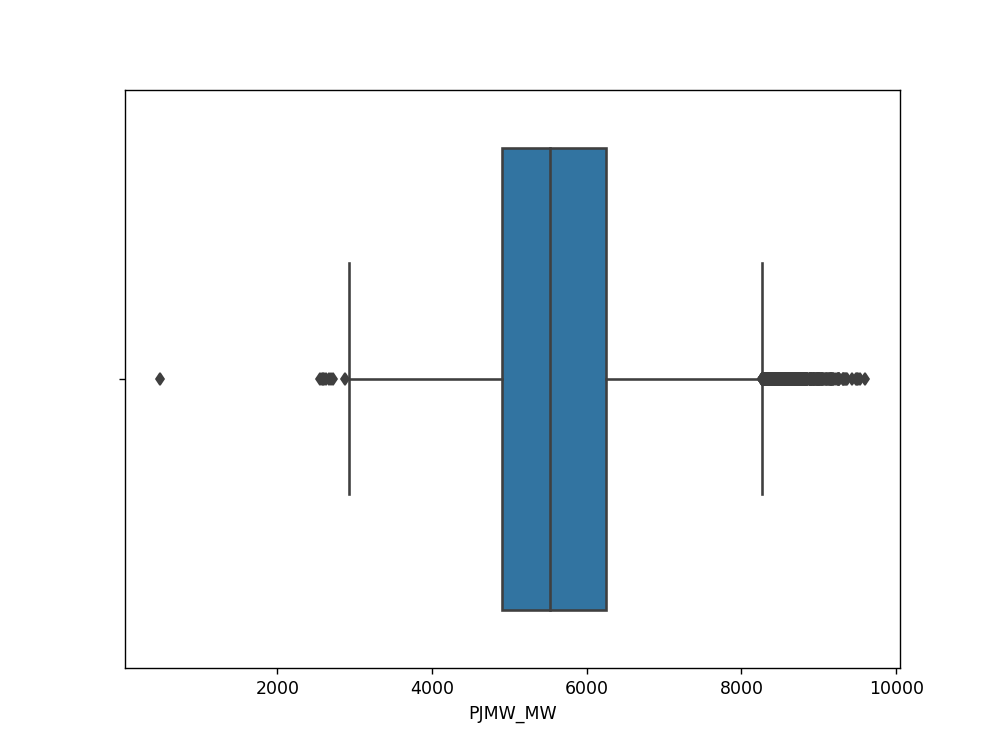

<AxesSubplot:xlabel='PJMW_MW'>

In [31]:
plt.figure(figsize=(8,6))
sns.boxplot(df['PJMW_MW'])

In [32]:
#Finding the IQR
percentile25 = df['PJMW_MW'].quantile(0.25)
percentile75 = df['PJMW_MW'].quantile(0.75)

In [33]:
percentile25

4907.0

In [34]:
percentile75

6252.0

In [35]:
iqr = percentile75 - percentile25

In [36]:
iqr

1345.0

In [37]:
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

In [38]:
print("Upper limit",upper_limit)
print("Lower limit",lower_limit)

Upper limit 8269.5
Lower limit 2889.5


In [41]:
#Finding Outliers

In [39]:
df[df['PJMW_MW'] > upper_limit]

,PJMW_MW
2002-07-22 17:00:00,8300.0
2002-07-29 18:00:00,8270.0
2003-01-23 18:00:00,8296.0
2003-01-23 19:00:00,8431.0
2003-01-23 20:00:00,8437.0
...,...
2018-07-03 19:00:00,8398.0
2018-07-16 15:00:00,8292.0
2018-07-16 16:00:00,8418.0
2018-07-16 17:00:00,8429.0


In [40]:
df[df['PJMW_MW'] < lower_limit]

,PJMW_MW
2003-05-29 00:00:00,487.0
2012-04-01 13:00:00,2878.0
2012-04-01 14:00:00,2721.0
2012-04-01 15:00:00,2663.0
2012-04-01 16:00:00,2574.0
2012-04-01 17:00:00,2586.0
2012-04-01 18:00:00,2600.0
2012-04-01 19:00:00,2630.0
2012-04-01 23:00:00,2690.0
2012-04-02 00:00:00,2553.0


In [41]:
#  method for detection of outliers and removing outliers
#capping method

In [42]:
new_df_cap = df.copy()

new_df_cap['PJMW_MW'] = np.where(
new_df_cap['PJMW_MW']> upper_limit,
upper_limit,
np.where(
    new_df_cap['PJMW_MW']< lower_limit,
    lower_limit,
    new_df_cap['PJMW_MW']
     )
)

In [43]:
new_df_cap.shape

(143232, 1)

<IPython.core.display.Javascript object>


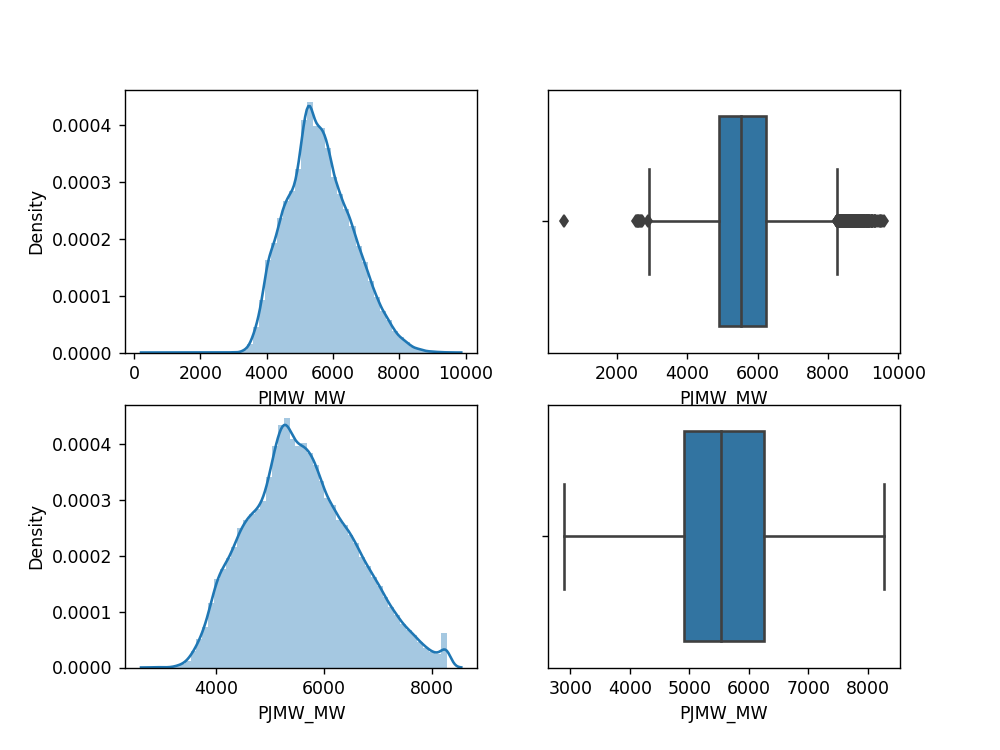

In [44]:
#comparing

plt.figure(figsize=(8,6))
plt.subplot(2,2,1)
sns.distplot(df['PJMW_MW'])

plt.subplot(2,2,2)
sns.boxplot(df['PJMW_MW'])

plt.subplot(2,2,3)
sns.distplot(new_df_cap['PJMW_MW'])

plt.subplot(2,2,4)
sns.boxplot(new_df_cap['PJMW_MW'])

plt.show()



# EDA (Exploratory Data Analysis)

<IPython.core.display.Javascript object>


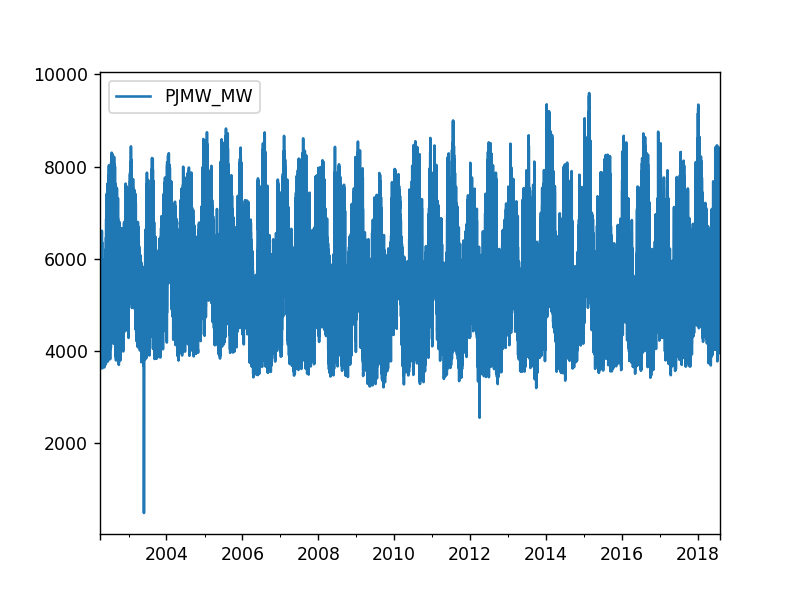

In [45]:
df.plot()
plt.show()

Though there is variation in the data ie, there is peak point as well as low points, 
there is no any specific trend. It looks like a stationary series with constatnt mean and sd.

Histogram of data df

<IPython.core.display.Javascript object>


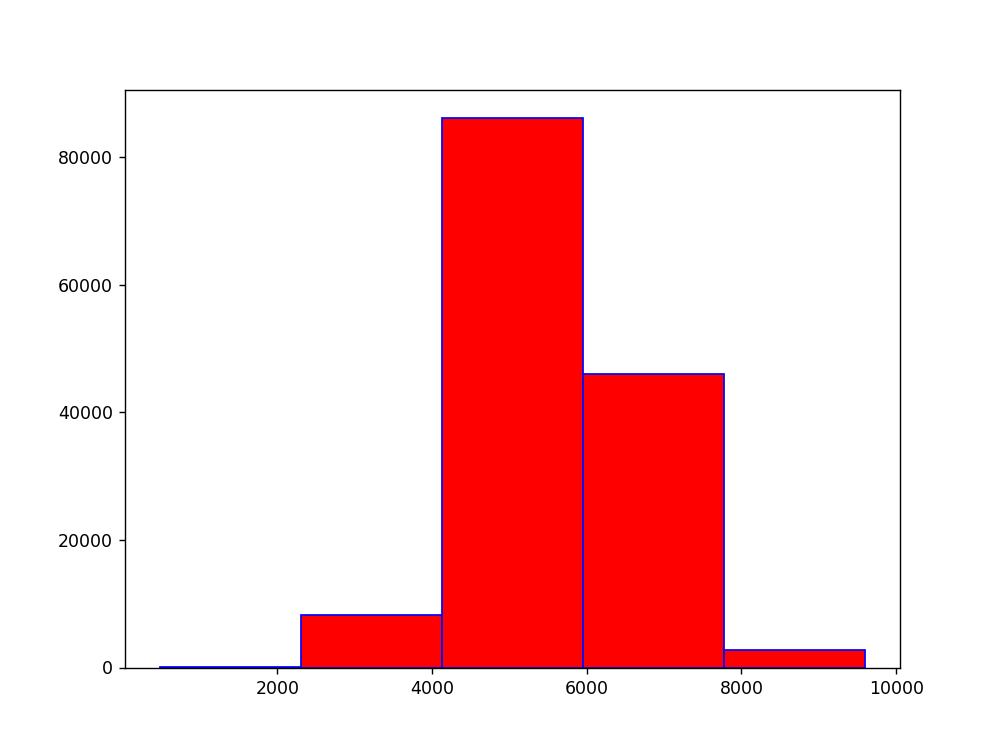

(array([1.0000e+00, 8.2950e+03, 8.6200e+04, 4.5985e+04, 2.7210e+03]),
 array([ 487. , 2308.4, 4129.8, 5951.2, 7772.6, 9594. ]),
 <BarContainer object of 5 artists>)

In [46]:
plt.figure(figsize=(8,6))
plt.hist(df['PJMW_MW'],facecolor ="red",edgecolor ="blue",bins =5)


<IPython.core.display.Javascript object>


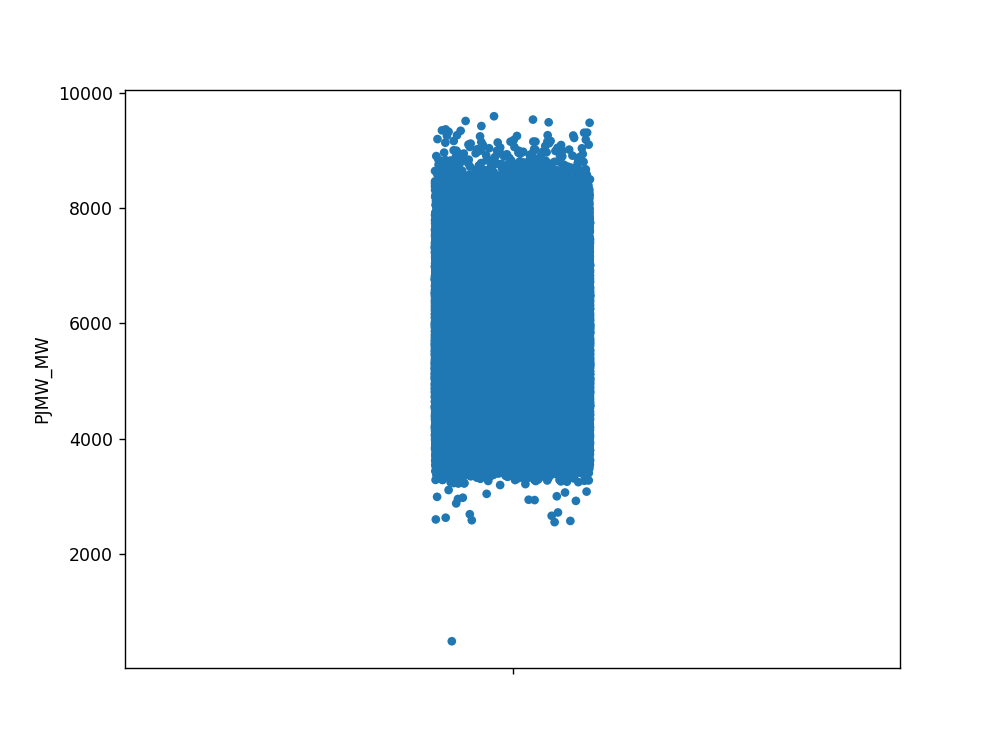

In [49]:
plt.figure(figsize=(8,6))
sns.stripplot(y= 'PJMW_MW', data=df,jitter=True)
plt.show()

Plot the maximum,minimum and mean values of each year

<IPython.core.display.Javascript object>


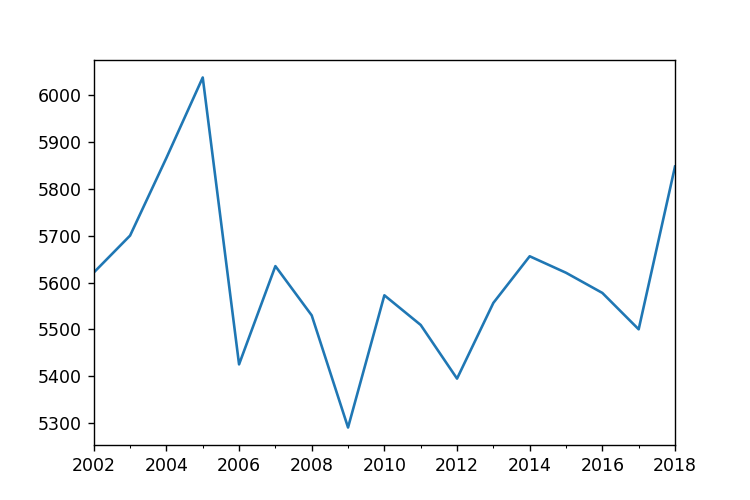

<AxesSubplot:>

In [52]:
plt.figure(figsize=(6,4))
df.PJMW_MW.resample(rule='A').mean().plot()

<IPython.core.display.Javascript object>


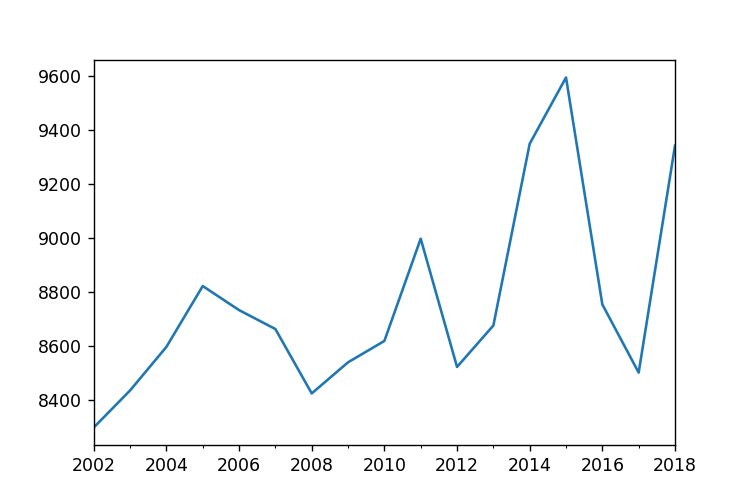

<AxesSubplot:>

In [53]:
plt.figure(figsize=(6,4))
df.PJMW_MW.resample(rule='A').max().plot()

<IPython.core.display.Javascript object>


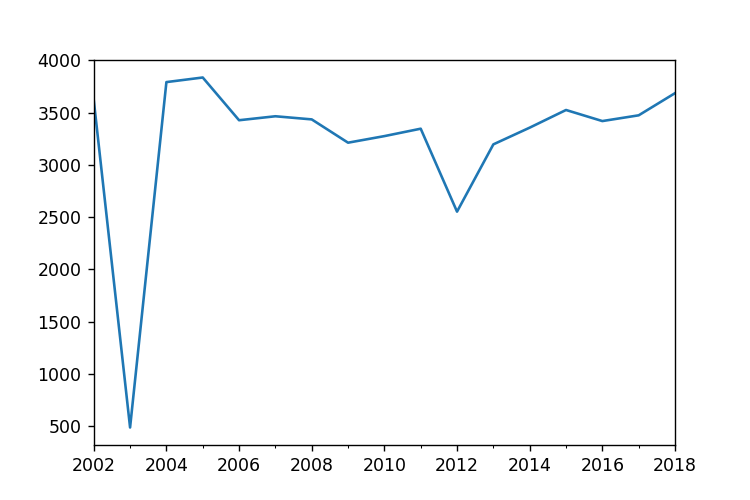

<AxesSubplot:>

In [54]:
plt.figure(figsize=(6,4))
df.PJMW_MW.resample(rule='A').min().plot()

The minimum of 2003 seems to be an outlier.

In [55]:
df['2003'].PJMW_MW.resample(rule='A').min()

2003-12-31    487.0
Freq: A-DEC, Name: PJMW_MW, dtype: float64

In [57]:
df[df['PJMW_MW']==487.0]

,PJMW_MW
2003-05-29,487.0


In [58]:
df['2003-05-29'].head()

,PJMW_MW
2003-05-29 00:00:00,487.0
2003-05-29 01:00:00,4560.0
2003-05-29 02:00:00,4424.0
2003-05-29 03:00:00,4351.0
2003-05-29 04:00:00,4337.0


In [59]:
df['PJMW_MW'].mask(df['PJMW_MW']<500,inplace=True)

In [60]:
df['PJMW_MW']=df.PJMW_MW.interpolate(method='linear')


Replaced the outlier value with the linear interpolation method

In [61]:
df['2003-05-29'].head()

,PJMW_MW
2003-05-29 00:00:00,4938.5
2003-05-29 01:00:00,4560.0
2003-05-29 02:00:00,4424.0
2003-05-29 03:00:00,4351.0
2003-05-29 04:00:00,4337.0


<IPython.core.display.Javascript object>


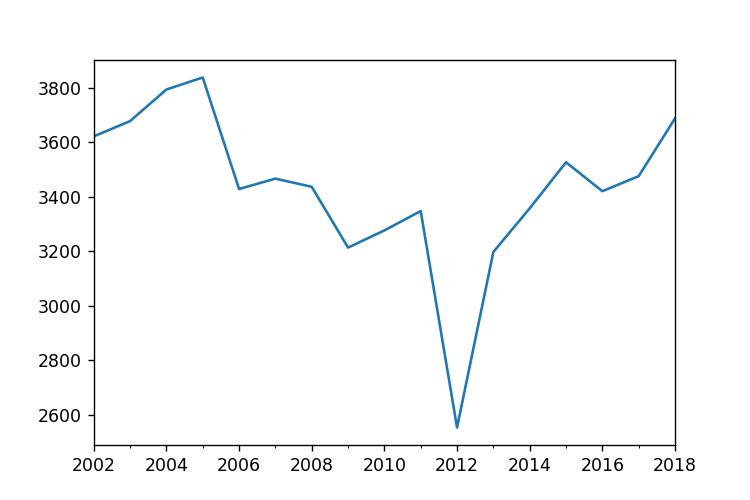

<AxesSubplot:>

In [62]:
plt.figure(figsize=(6,4))
df.PJMW_MW.resample(rule='A').min().plot()

In [63]:
df[df['PJMW_MW']==2553.0]

,PJMW_MW
2012-04-02,2553.0


In [64]:
df['2012-04-02'].head()

,PJMW_MW
2012-04-02 00:00:00,2553.0
2012-04-02 01:00:00,3904.0
2012-04-02 02:00:00,3779.0
2012-04-02 03:00:00,3776.0
2012-04-02 04:00:00,3764.0


In [65]:
df.to_csv('dataset.csv')

In [66]:
type(df)

pandas.core.frame.DataFrame

<IPython.core.display.Javascript object>


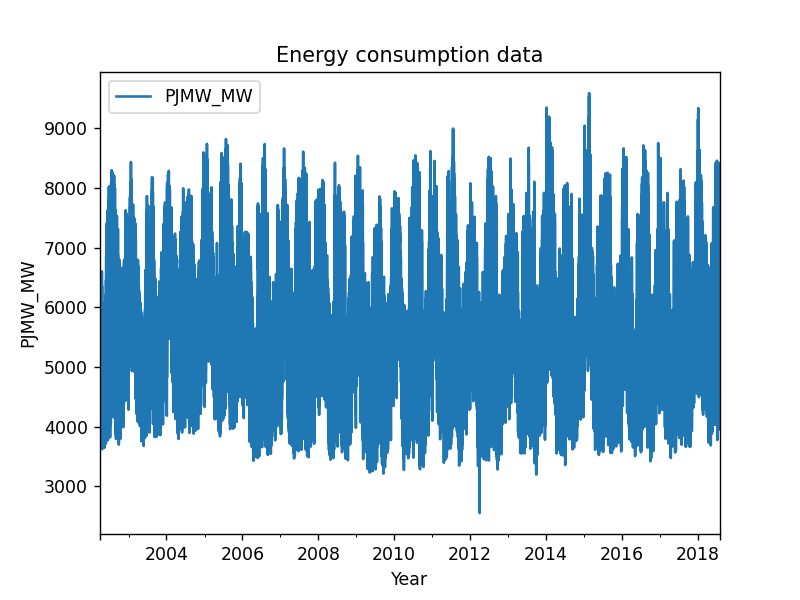

In [67]:
df.plot()
plt.xlabel('Year') 
plt.ylabel('PJMW_MW') 
# displaying the title
plt.title("Energy consumption data")
plt.show()

# Converting the data into Year,Month,Day And Hour

In [68]:
new_df=pd.read_csv('PJMW_hourly.csv')

In [69]:
new_df['Datetime']=pd.to_datetime(new_df['Datetime'])

In [70]:
new_df['Month']=pd.DatetimeIndex(new_df['Datetime']).month

In [71]:
new_df['Year']=pd.DatetimeIndex(new_df['Datetime']).year

In [72]:
import datetime as dt

In [73]:
new_df['Day']= new_df['Datetime'].dt.day
new_df['Weekday']= new_df['Datetime'].dt.weekday
new_df['Month_Name']= new_df['Datetime'].dt.month_name()
new_df['Week_Day']= new_df['Datetime'].dt.day_name().str[:3]
new_df['Hour']= new_df['Datetime'].dt.hour
new_df['Minute']= new_df['Datetime'].dt.minute
new_df['Quarter']= new_df['Datetime'].dt.quarter
new_df['Week'] = new_df['Datetime'].dt.week
new_df['Day_Of_Year']=new_df['Datetime'].dt.day_of_year

In [74]:
new_df

,Datetime,PJMW_MW,Month,Year,Day,Weekday,Month_Name,Week_Day,Hour,Minute,Quarter,Week,Day_Of_Year
0,2002-12-31 01:00:00,5077.0,12,2002,31,1,December,Tue,1,0,4,1,365
1,2002-12-31 02:00:00,4939.0,12,2002,31,1,December,Tue,2,0,4,1,365
2,2002-12-31 03:00:00,4885.0,12,2002,31,1,December,Tue,3,0,4,1,365
3,2002-12-31 04:00:00,4857.0,12,2002,31,1,December,Tue,4,0,4,1,365
4,2002-12-31 05:00:00,4930.0,12,2002,31,1,December,Tue,5,0,4,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...
143201,2018-01-01 20:00:00,8401.0,1,2018,1,0,January,Mon,20,0,1,1,1
143202,2018-01-01 21:00:00,8373.0,1,2018,1,0,January,Mon,21,0,1,1,1
143203,2018-01-01 22:00:00,8238.0,1,2018,1,0,January,Mon,22,0,1,1,1
143204,2018-01-01 23:00:00,7958.0,1,2018,1,0,January,Mon,23,0,1,1,1


In [75]:
new_df.isnull().sum()

Datetime       0
PJMW_MW        0
Month          0
Year           0
Day            0
Weekday        0
Month_Name     0
Week_Day       0
Hour           0
Minute         0
Quarter        0
Week           0
Day_Of_Year    0
dtype: int64

<IPython.core.display.Javascript object>


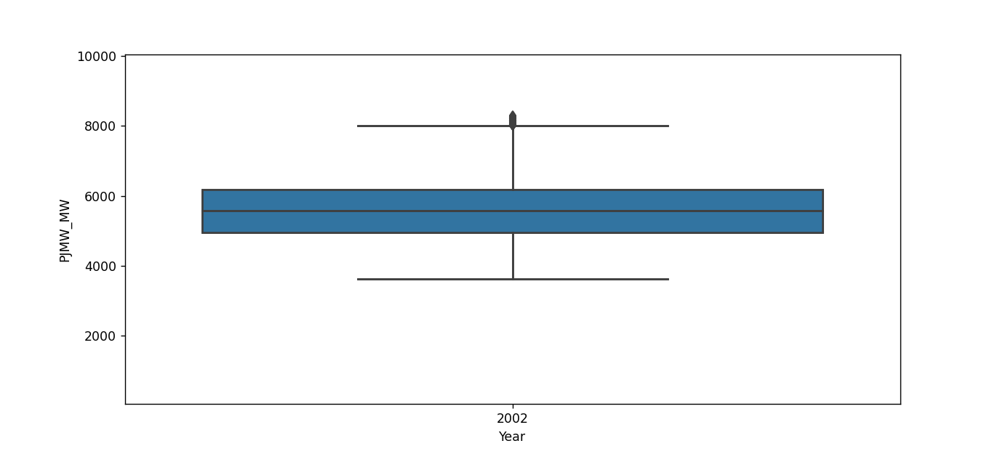

In [76]:
f, ax = plt.subplots(figsize=(11,5))
sns.boxplot(x='Year', y="PJMW_MW",  data=new_df);

In [77]:
outliners=[]
def detect_outliners(new_df):
    threshold=3
    mean=np.mean(new_df)
    std=np.std(new_df)
    for i in new_df:
        z_score=(i-mean)/std
        if np.abs(z_score)>threshold:
              outliners.append(i)
    return outliners

In [78]:
outliner_pt=detect_outliners(new_df["PJMW_MW"])

In [79]:
len(outliner_pt)

298

In [80]:
#As we see their are few outliners available we will try to remove it.

<IPython.core.display.Javascript object>


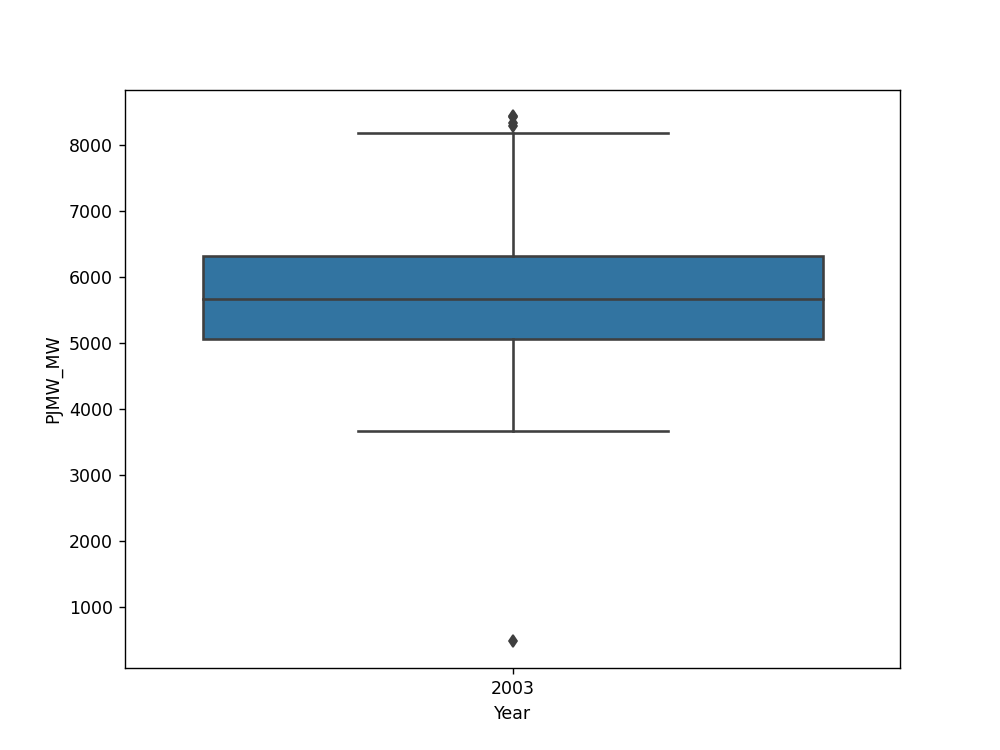

<IPython.core.display.Javascript object>


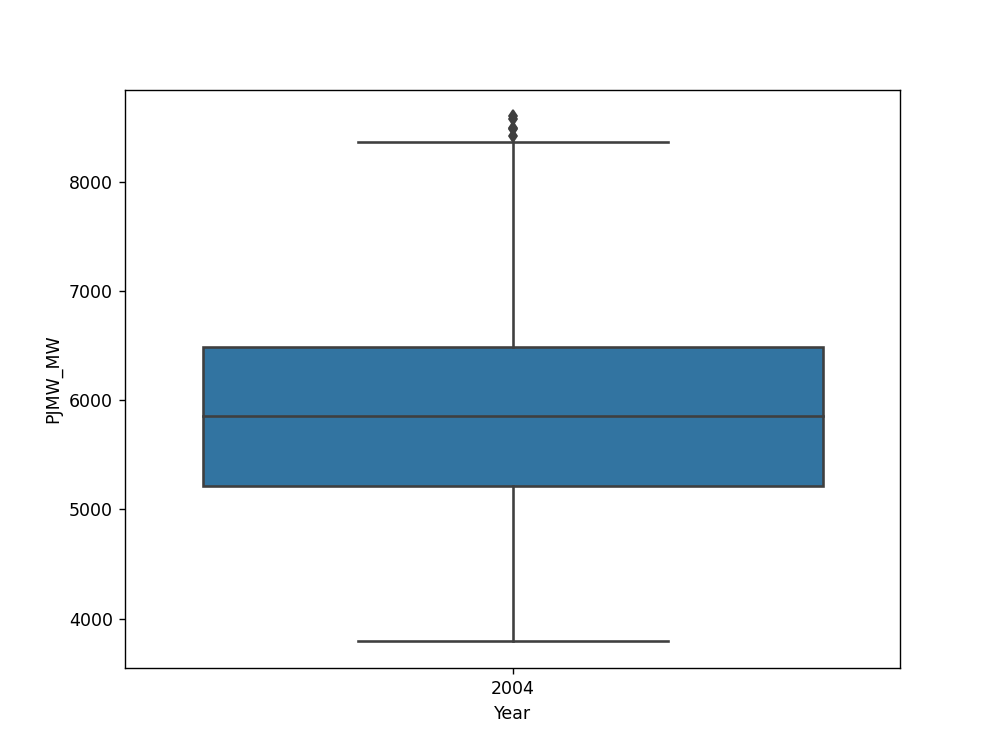

<IPython.core.display.Javascript object>


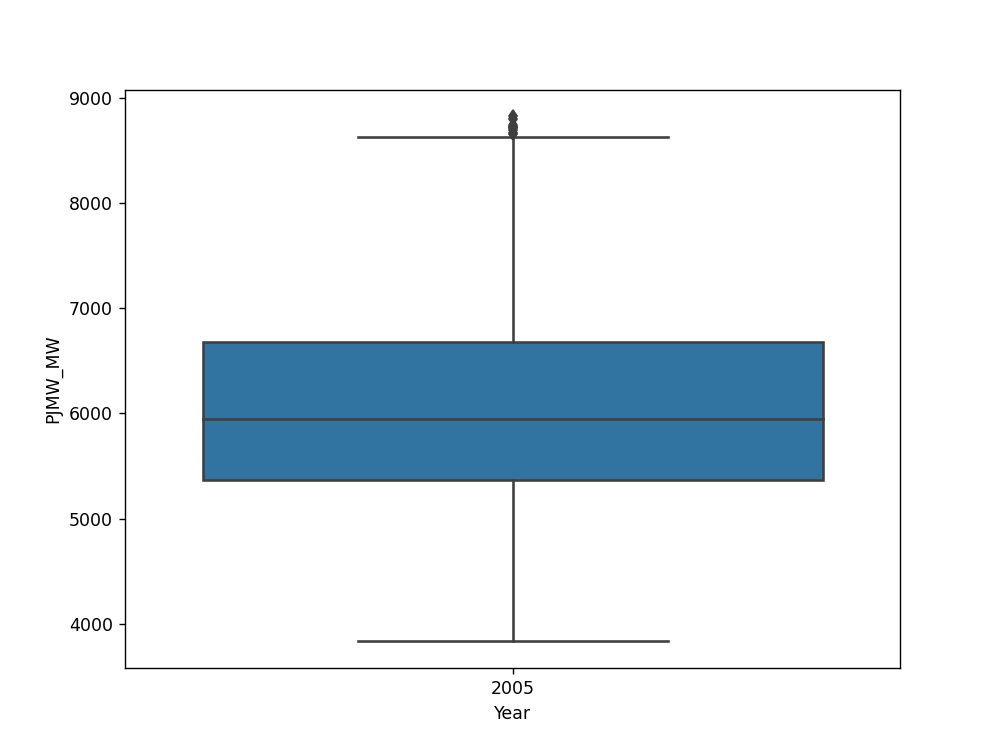

<IPython.core.display.Javascript object>


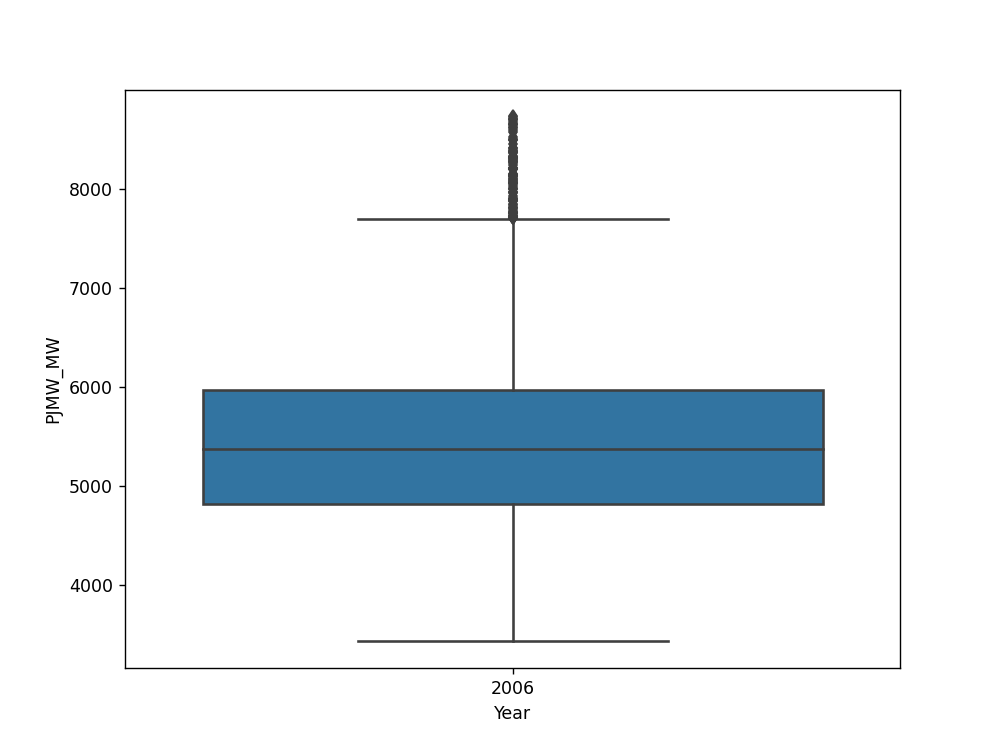

<IPython.core.display.Javascript object>


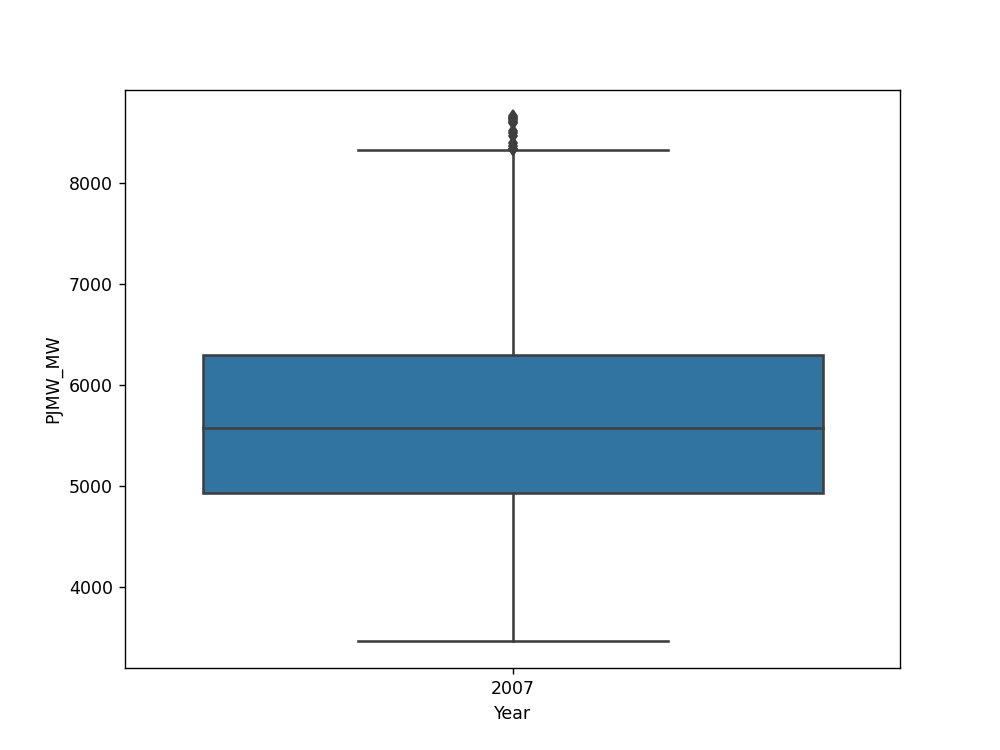

<IPython.core.display.Javascript object>


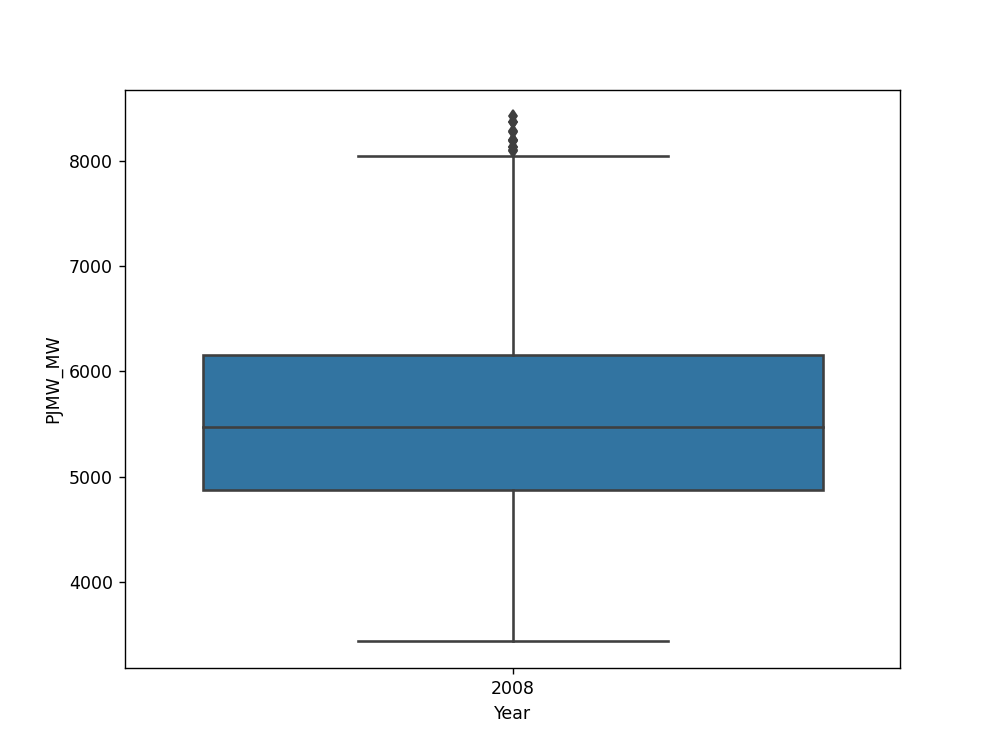

<IPython.core.display.Javascript object>


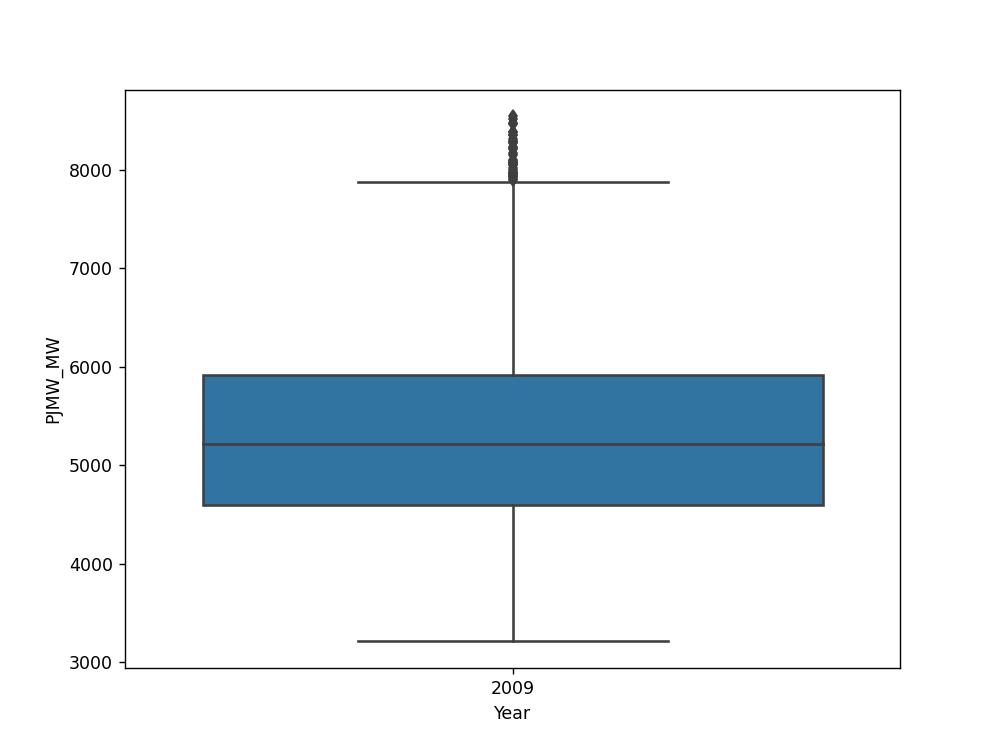

<IPython.core.display.Javascript object>


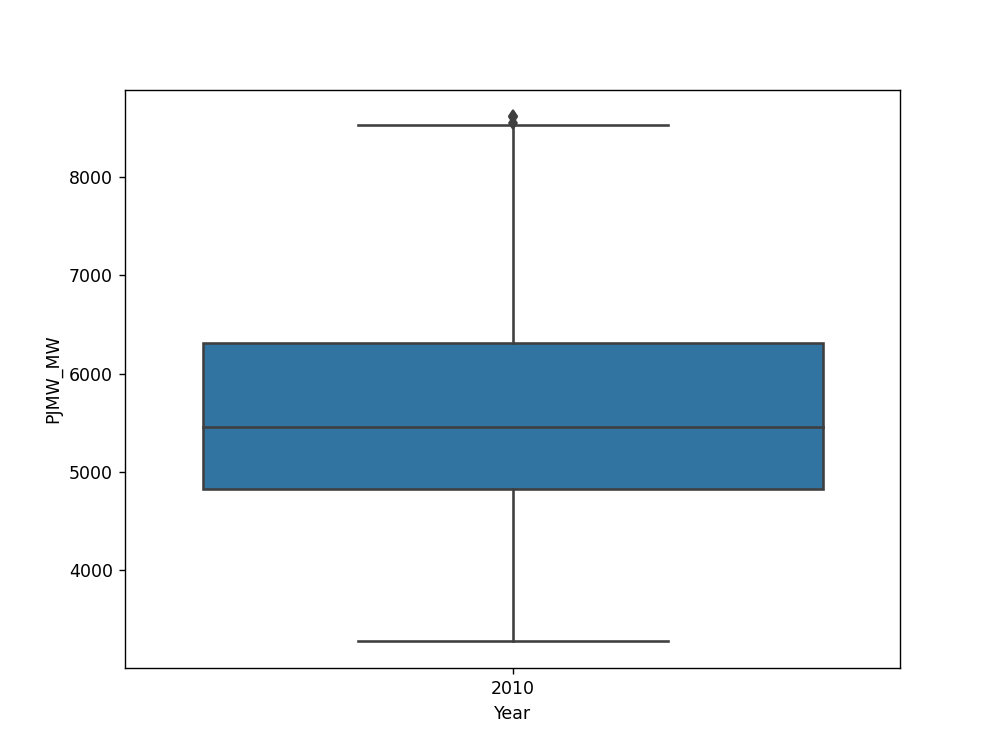

<IPython.core.display.Javascript object>


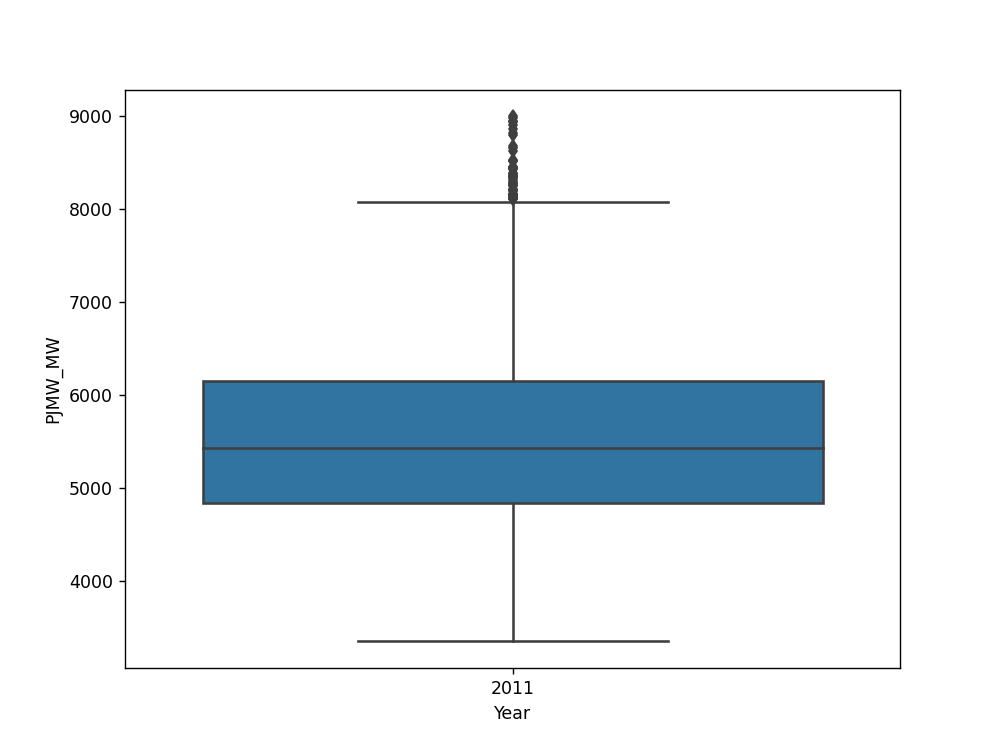

<IPython.core.display.Javascript object>


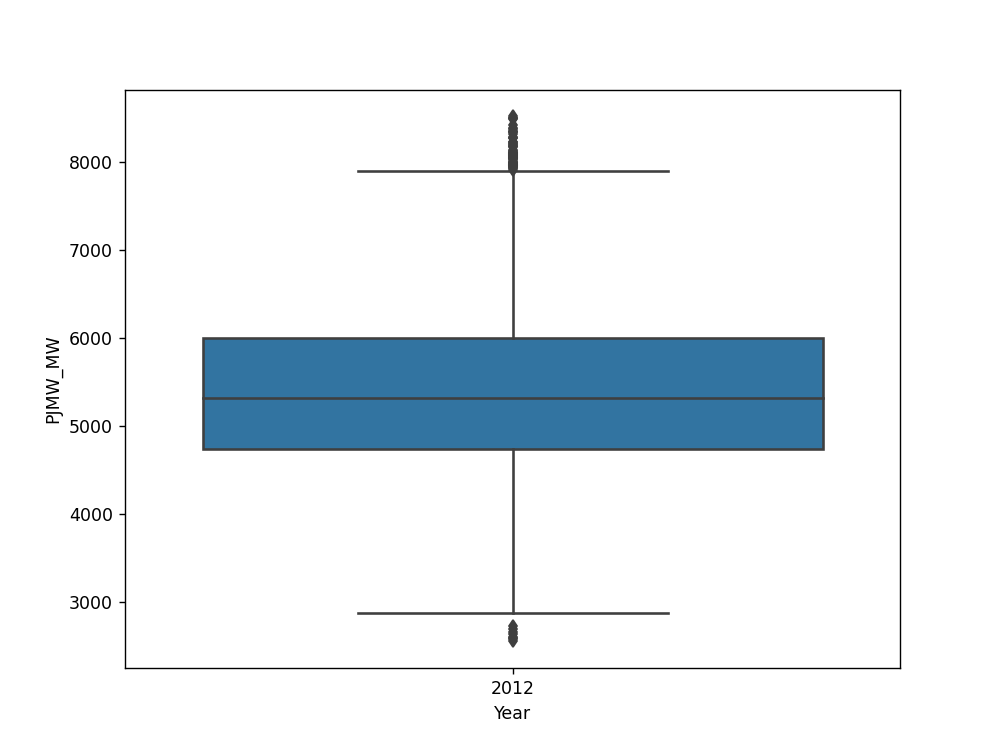

<IPython.core.display.Javascript object>


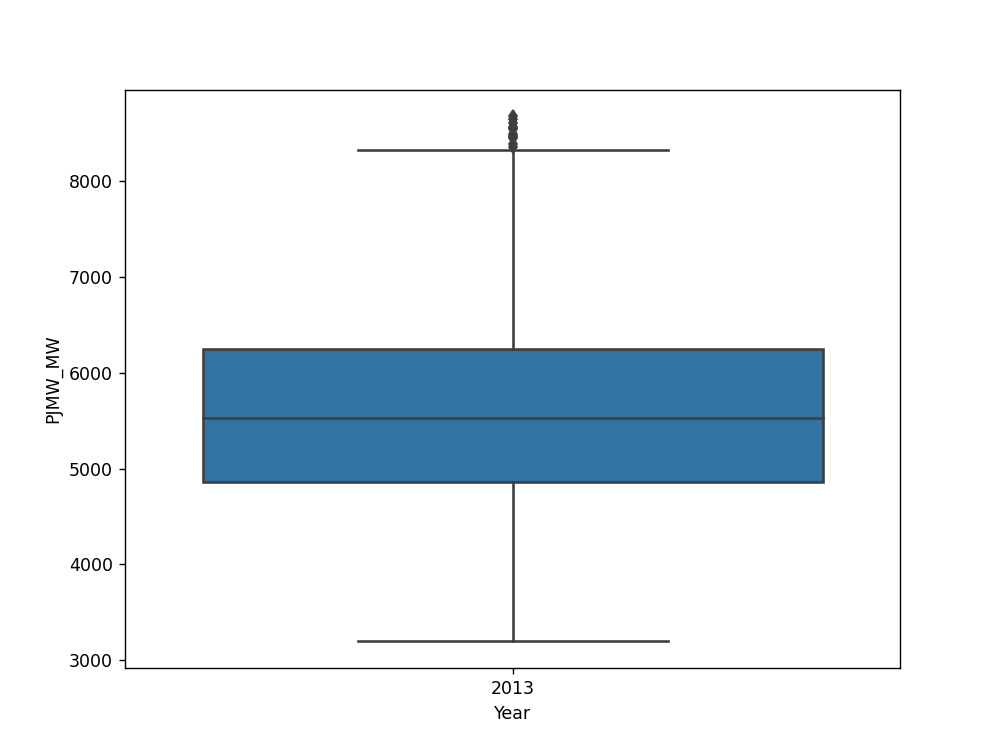

<IPython.core.display.Javascript object>


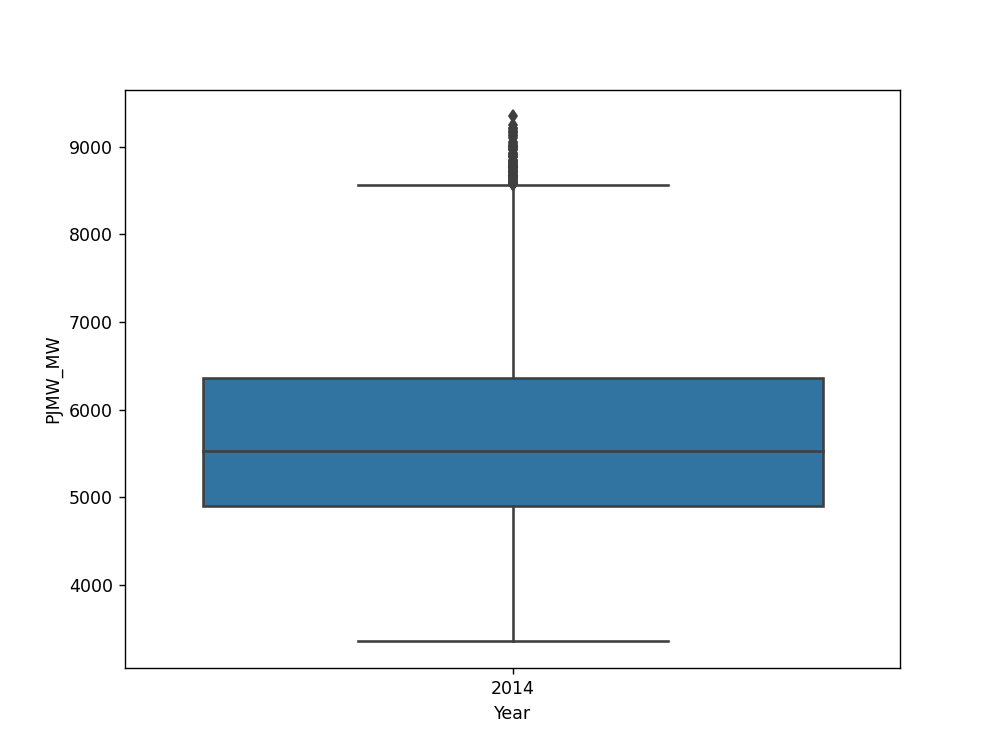

<IPython.core.display.Javascript object>


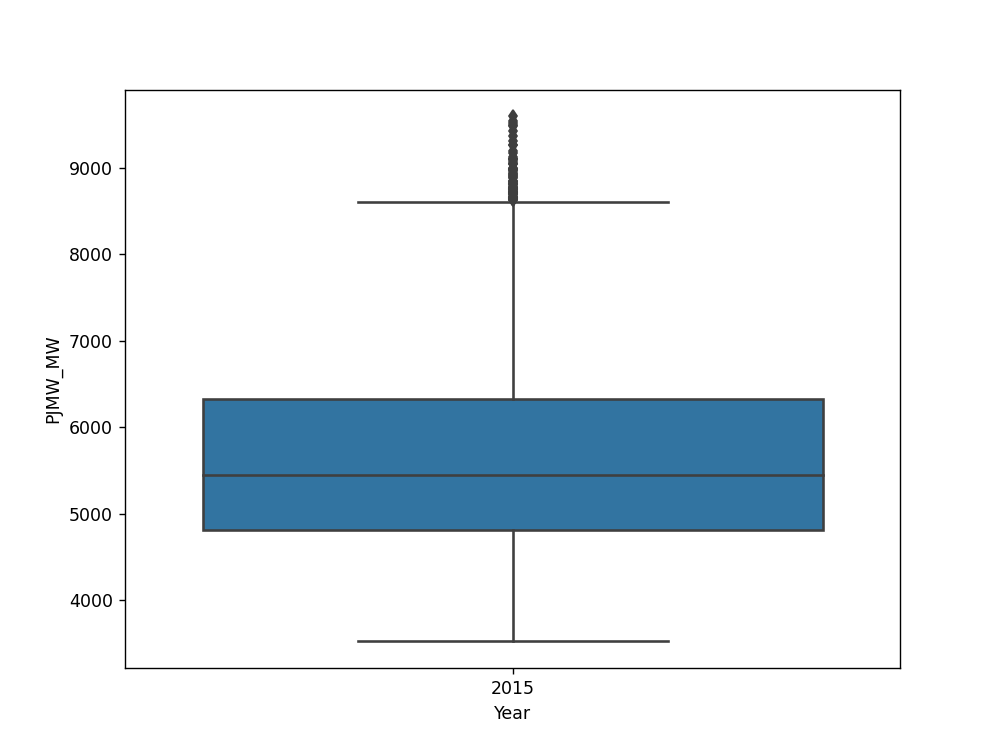

<IPython.core.display.Javascript object>


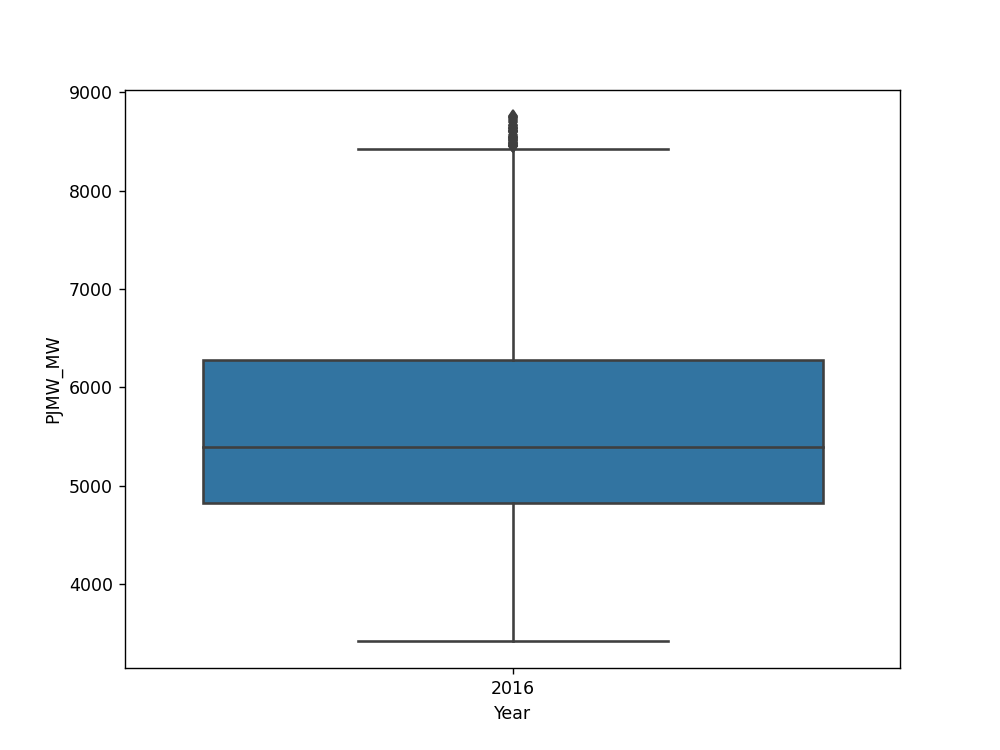

<IPython.core.display.Javascript object>


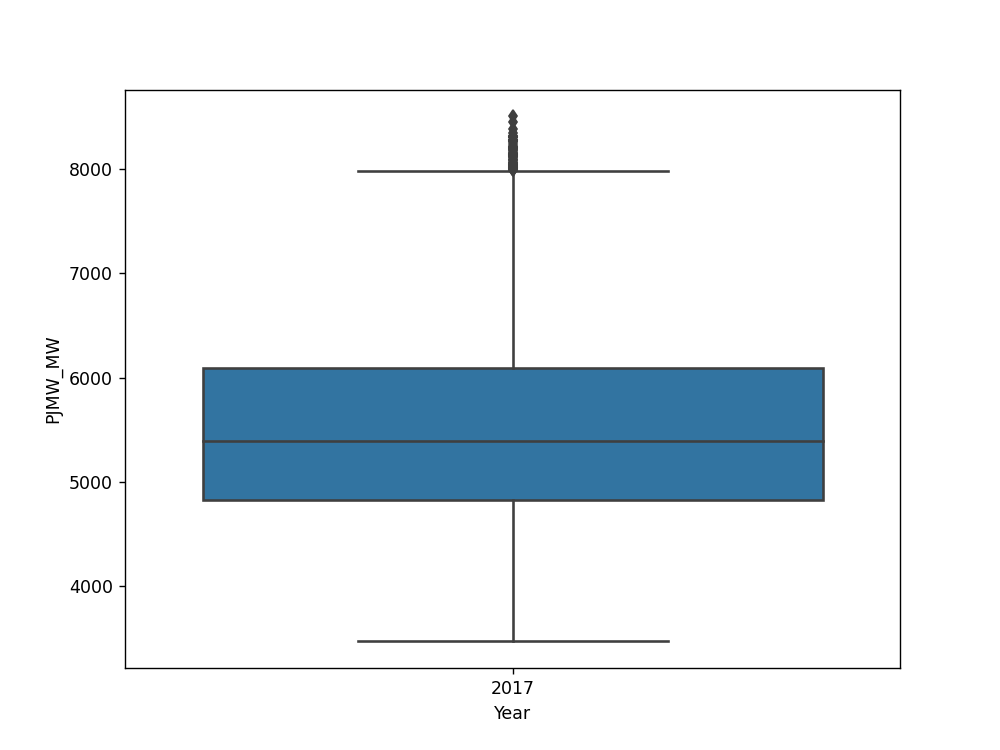

<IPython.core.display.Javascript object>


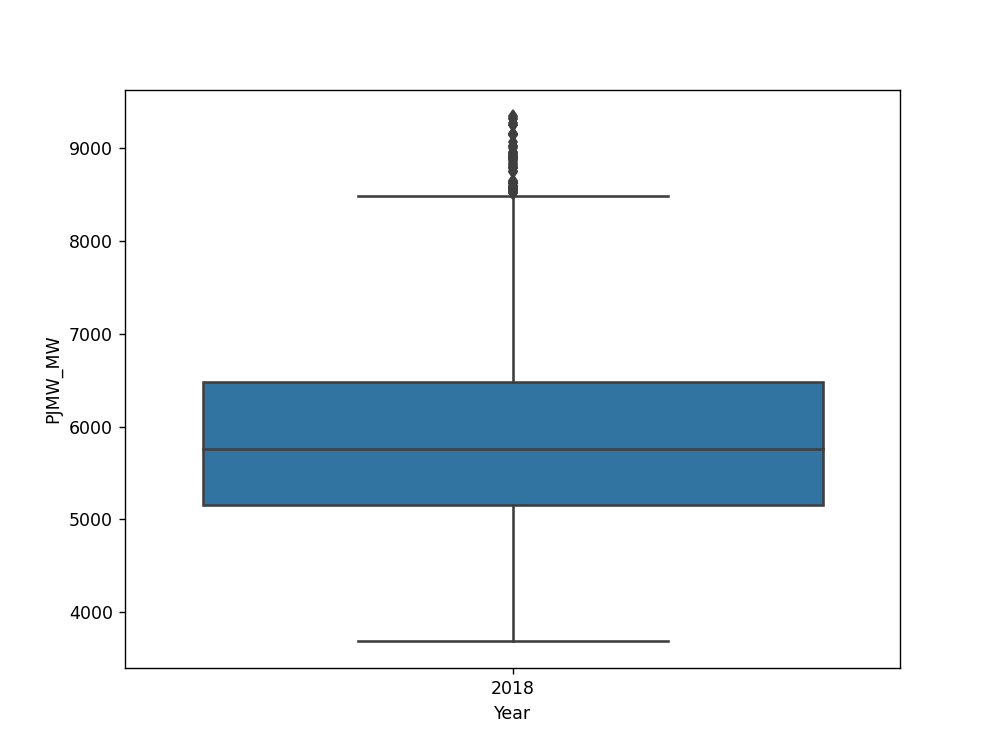

<IPython.core.display.Javascript object>


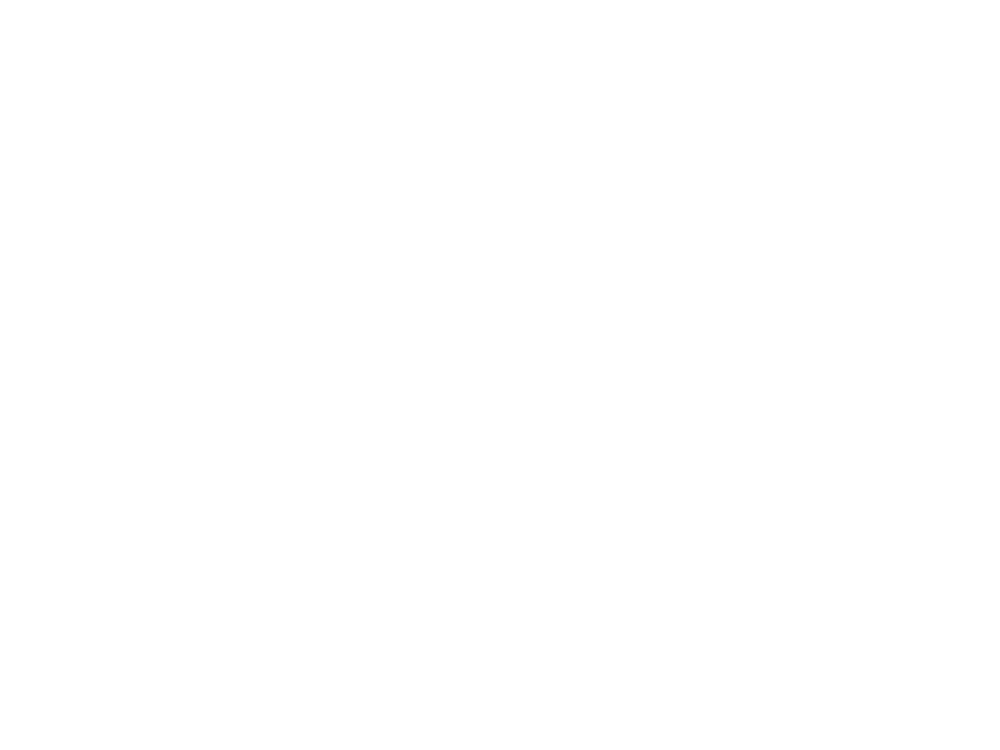

In [81]:
for col in range (2002,2019):
    col_year=new_df.loc[new_df['Year']==col]
    sns.boxplot(x=col_year['Year'],y=col_year['PJMW_MW'])
    plt.figure(figsize=(8,6))
    plt.show()

In [82]:
new_df_year = new_df.groupby('Year').agg({"PJMW_MW" : "mean"}).reset_index()

In [83]:
for col in range(2002,2019):
    col_year=new_df.loc[new_df['Year']==col]
    Q1 =np.percentile(col_year['PJMW_MW'], 25,interpolation = 'midpoint')
    Q3 =np.percentile(col_year['PJMW_MW'], 75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    s=1.5*IQR
    LB = Q1 - s
    UB = Q3 + s
    val=new_df_year.loc[new_df_year['Year']==col]
    ulval=val['PJMW_MW'].values[0]
    new_df.loc[new_df['PJMW_MW'] > UB,'PJMW_MW'] = ulval
    new_df.loc[new_df['PJMW_MW'] < LB,'PJMW_MW'] = ulval

<IPython.core.display.Javascript object>


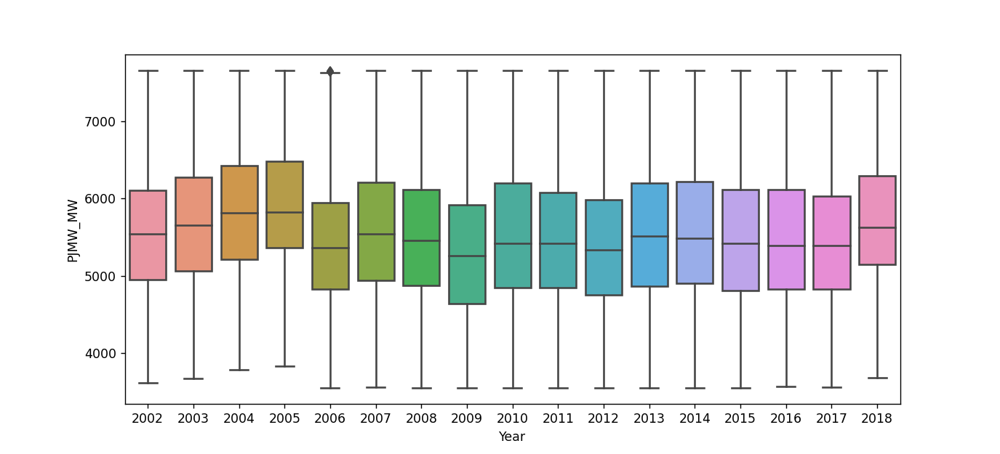

In [84]:
f, ax = plt.subplots(figsize=(11,5))
sns.boxplot(x='Year', y="PJMW_MW",  data=new_df);

# Exploratory data analyis (EDA)

#visualizing time series data

<IPython.core.display.Javascript object>


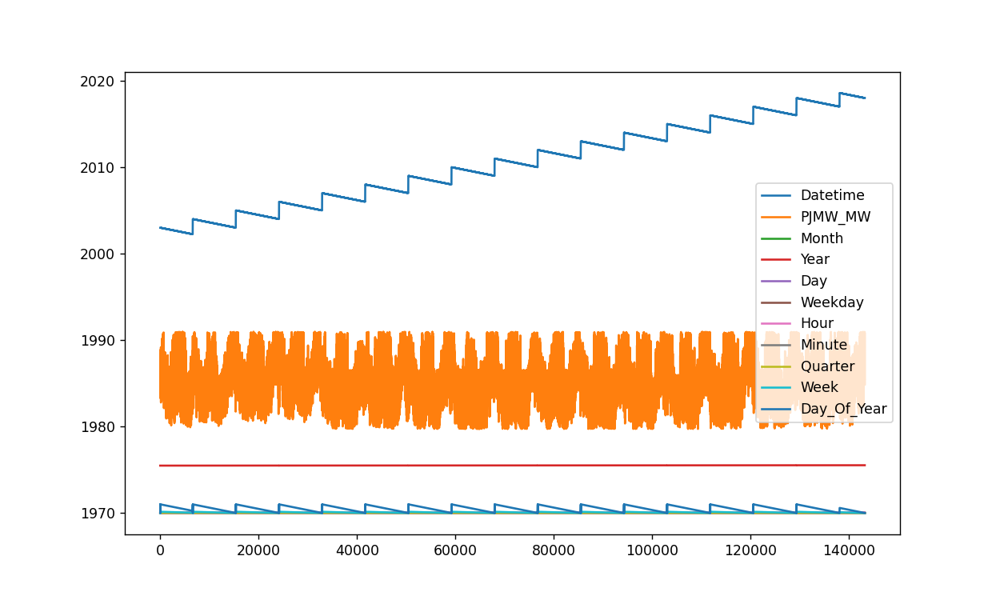

<AxesSubplot:>

In [85]:
new_df.plot(figsize=(10,6),label=True)

#Relation between energy consumption and year

<IPython.core.display.Javascript object>


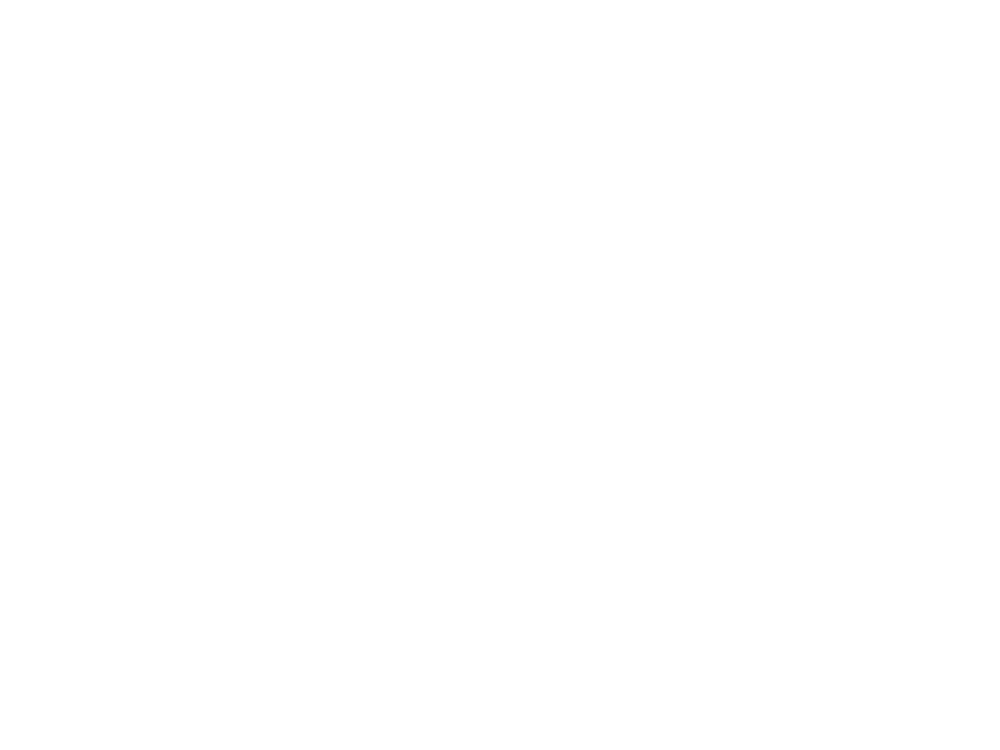

<IPython.core.display.Javascript object>


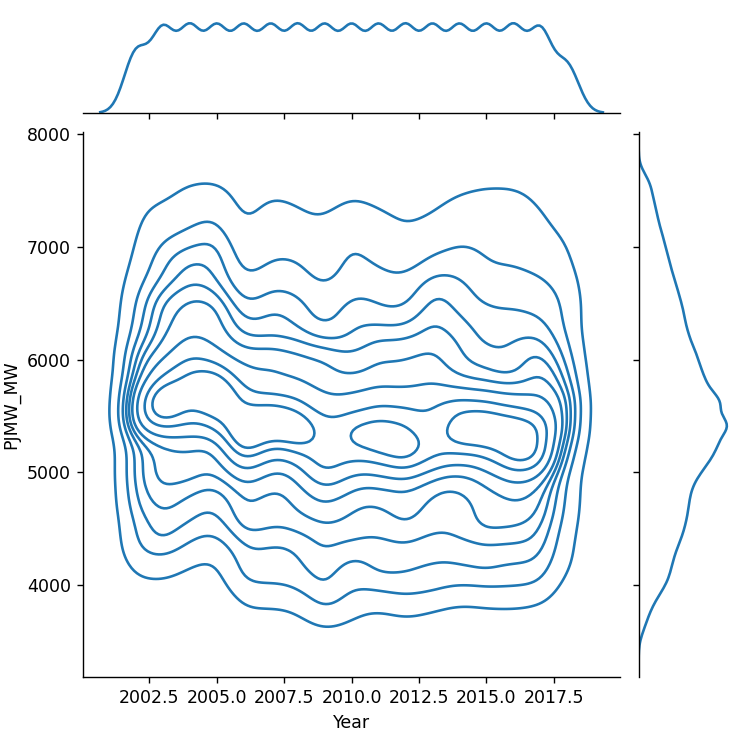

In [90]:
plt.figure(figsize=(8,6))
sns.jointplot(x='Year', y= 'PJMW_MW', data=new_df,kind='kde')
plt.show()

<IPython.core.display.Javascript object>


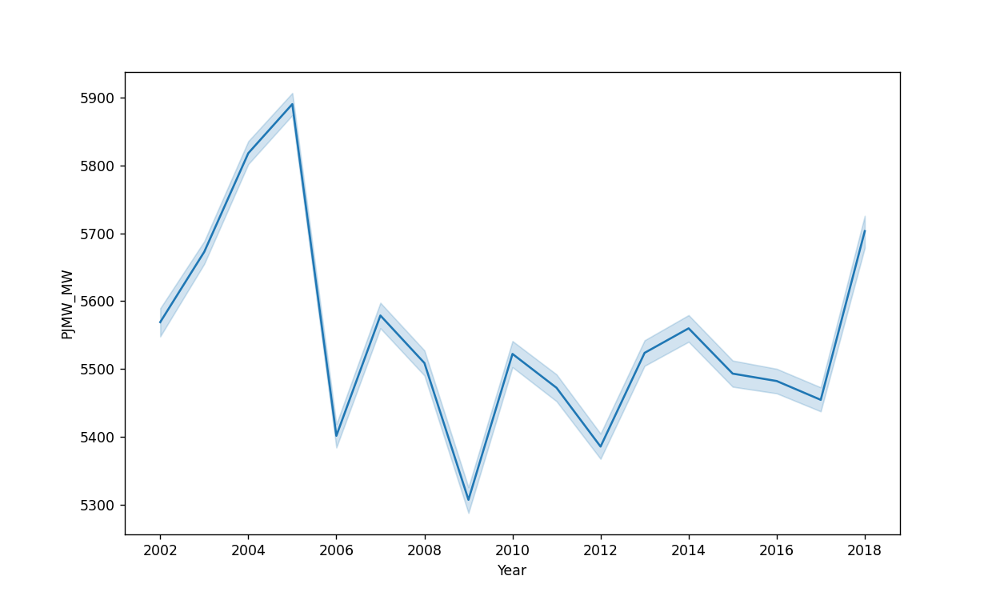

In [86]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Year',y='PJMW_MW',data=new_df)
plt.show()

#let see data is normally distributed or not

<IPython.core.display.Javascript object>


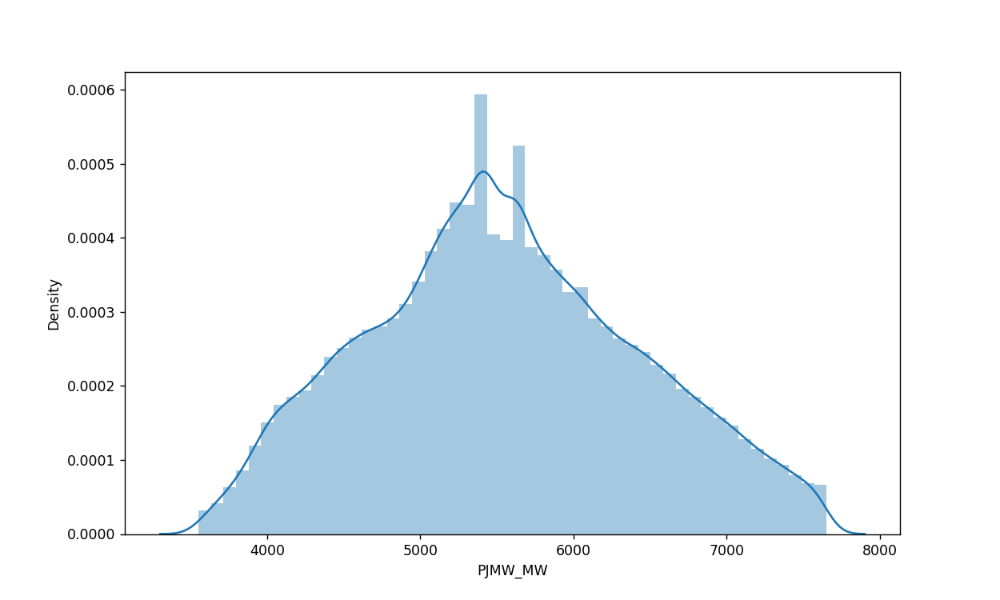

In [87]:
plt.figure(figsize=(10,6))
sns.distplot(new_df['PJMW_MW'])
plt.show()

<IPython.core.display.Javascript object>


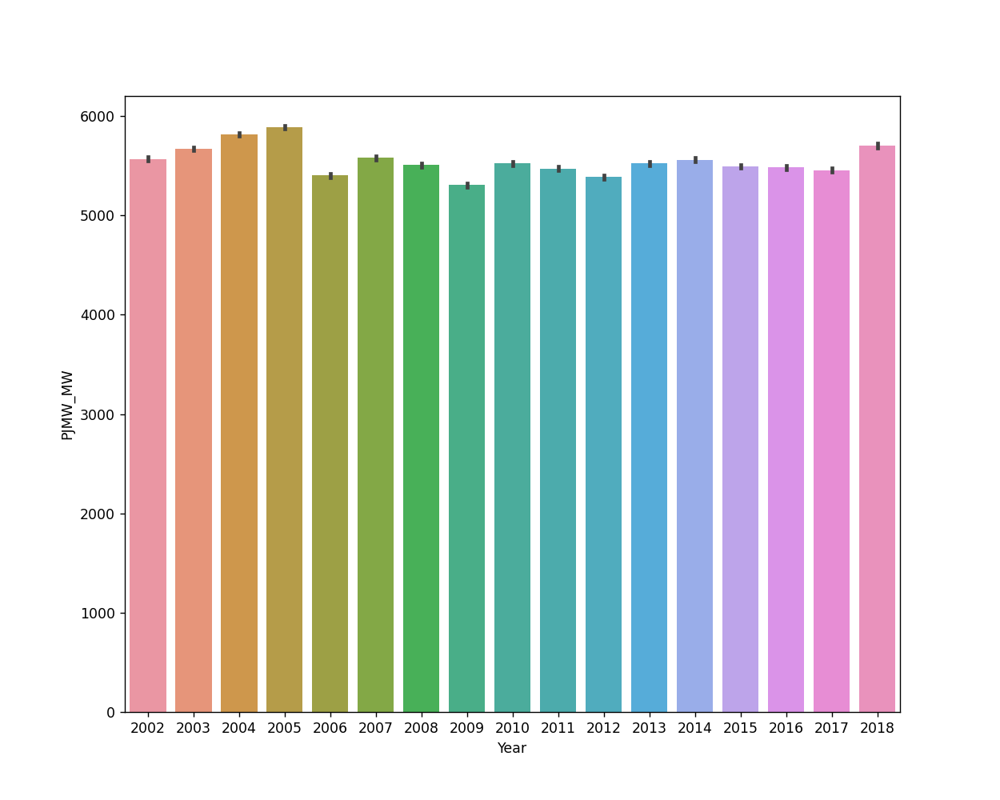

In [88]:

f, ax = plt.subplots(figsize=(10,8))
sns.barplot(x='Year', y="PJMW_MW",  data=new_df);

### Check for the yearly trend

<IPython.core.display.Javascript object>


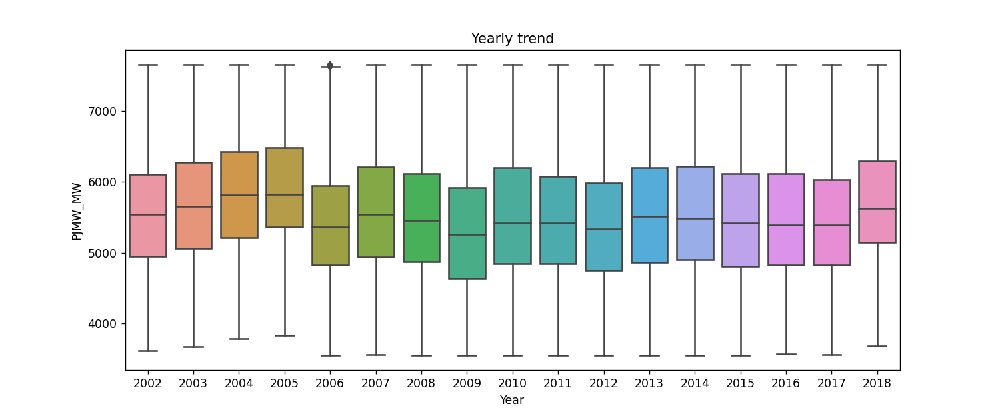

Text(0.5, 1.0, 'Yearly trend')

In [89]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = new_df['Year'],
                y = new_df['PJMW_MW'], 
                ax = ax)
ax.set_title('Yearly trend')

Observation: Low consumption in 2009 and high consumption in 2005

#### Check for the monthly trend

<IPython.core.display.Javascript object>


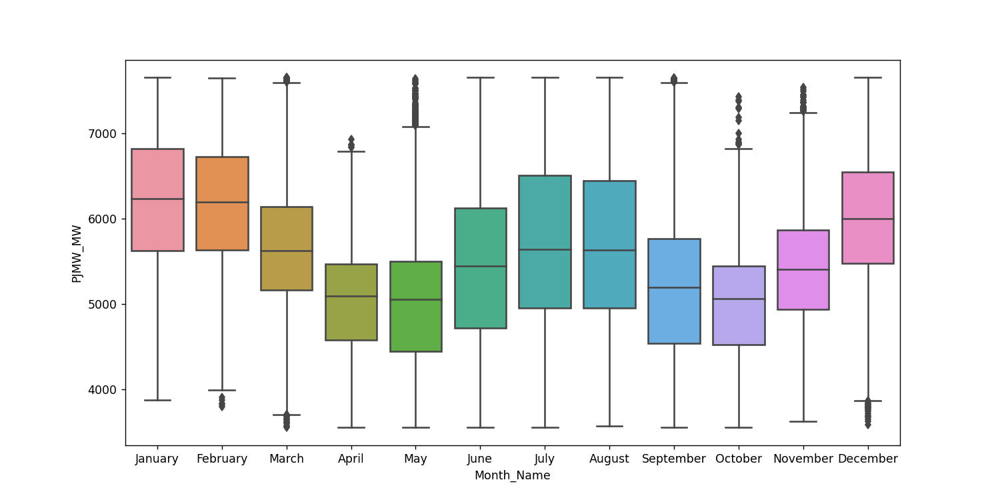

<AxesSubplot:xlabel='Month_Name', ylabel='PJMW_MW'>

In [90]:
fig, ax = plt.subplots(figsize=(12,6))
sns.boxplot(x = new_df['Month_Name'],
                y = new_df['PJMW_MW'],order=['January','February','March','April','May','June','July','August','September','October','November','December'],
                ax = ax)

Observation: For Dec, Jan, Feb and Jun,Jul, Aug the consumptin is higher as compared to other months.

Create the column 'Season' to Check for the seasonal trend

# we have to check seasonal changes and  energy consumption in  all seasons

In [91]:
df2=new_df.copy()

In [92]:
df2['season']=df2['Month_Name'].copy()

In [93]:
df2['season']=df2['season'].map({'January':'Winter','February':'Winter','March':'Winter','April':'Spring','May':'Spring','June':'Spring','August':'Summer','September':'Fall','July':'Summer','October': 'Fall','November': 'Fall','December': 'Winter'})


In [94]:
df2.head()

,Datetime,PJMW_MW,Month,Year,Day,Weekday,Month_Name,Week_Day,Hour,Minute,Quarter,Week,Day_Of_Year,season
0,2002-12-31 01:00:00,5077.0,12,2002,31,1,December,Tue,1,0,4,1,365,Winter
1,2002-12-31 02:00:00,4939.0,12,2002,31,1,December,Tue,2,0,4,1,365,Winter
2,2002-12-31 03:00:00,4885.0,12,2002,31,1,December,Tue,3,0,4,1,365,Winter
3,2002-12-31 04:00:00,4857.0,12,2002,31,1,December,Tue,4,0,4,1,365,Winter
4,2002-12-31 05:00:00,4930.0,12,2002,31,1,December,Tue,5,0,4,1,365,Winter


<IPython.core.display.Javascript object>


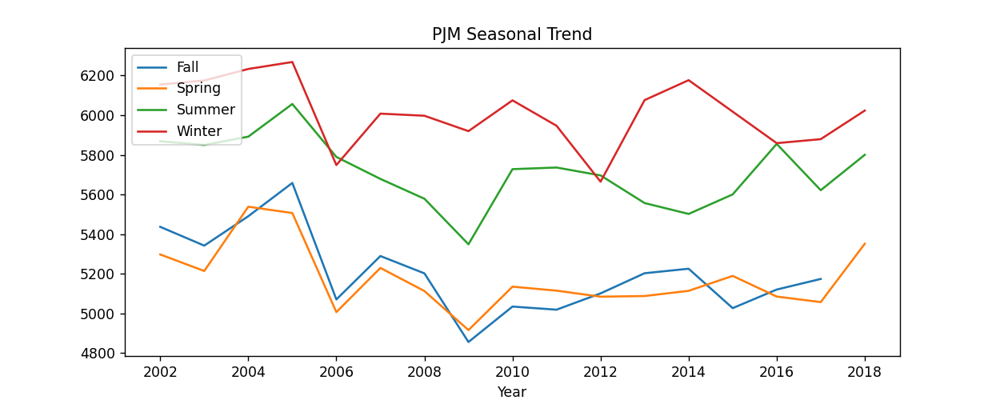

In [95]:
df2.pivot_table(index=df2['Year'], 
                     columns='season', 
                     values='PJMW_MW',
                     aggfunc='mean').plot(figsize=(10,4),
                     title='PJM Seasonal Trend')
plt.legend(loc='upper left')

<IPython.core.display.Javascript object>


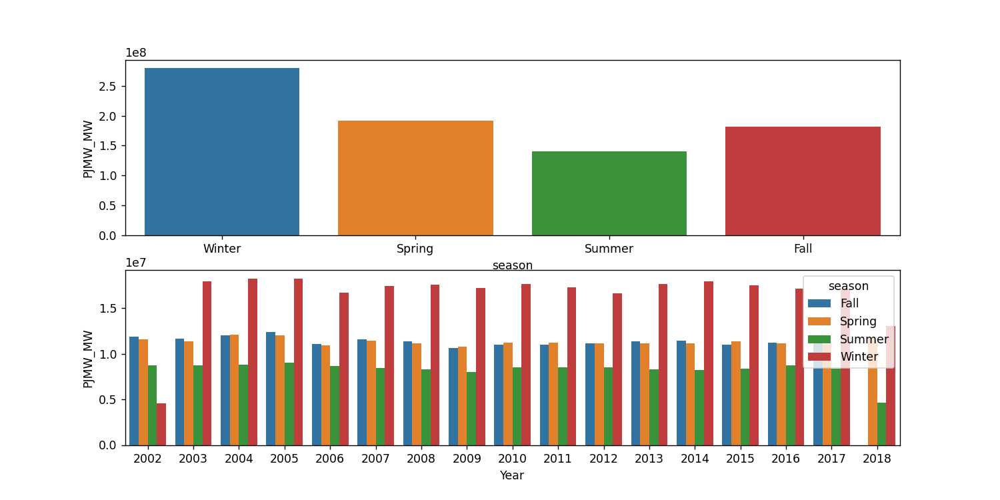

In [96]:
plt.figure(figsize=(12,6))
aux1 = df2[['season', 'PJMW_MW']].groupby( 'season' ).sum().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='season', y='PJMW_MW', data=aux1, order=['Winter', 'Spring', 'Summer', 'Fall'] )

aux2 = df2[['Year', 'season', 'PJMW_MW']].groupby( ['Year', 'season'] ).sum().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='Year', y='PJMW_MW', hue='season', data=aux2 );

<IPython.core.display.Javascript object>


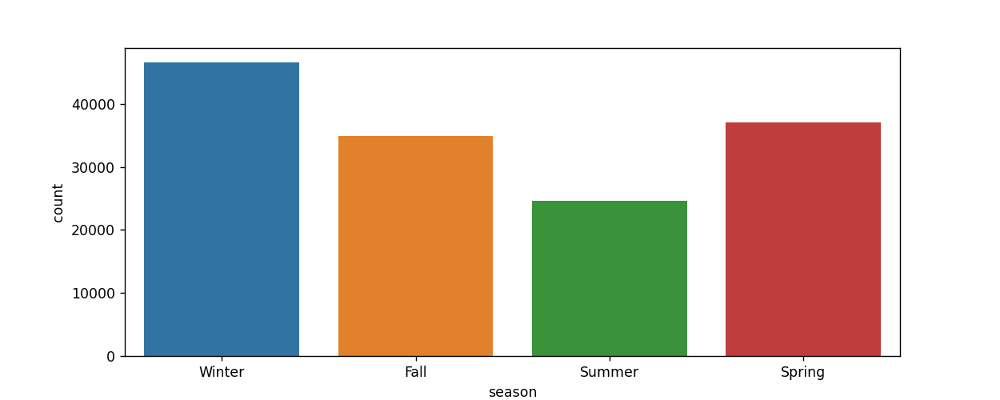

In [97]:
fig_dims=(10,4)
fig,ax =plt.subplots(figsize=fig_dims)
sns.countplot(x='season',ax=ax,data=df2)
plt.show()

Observation: For winter season the energy consumption is on a higher side and for summer the consumption is comparatively low

<IPython.core.display.Javascript object>


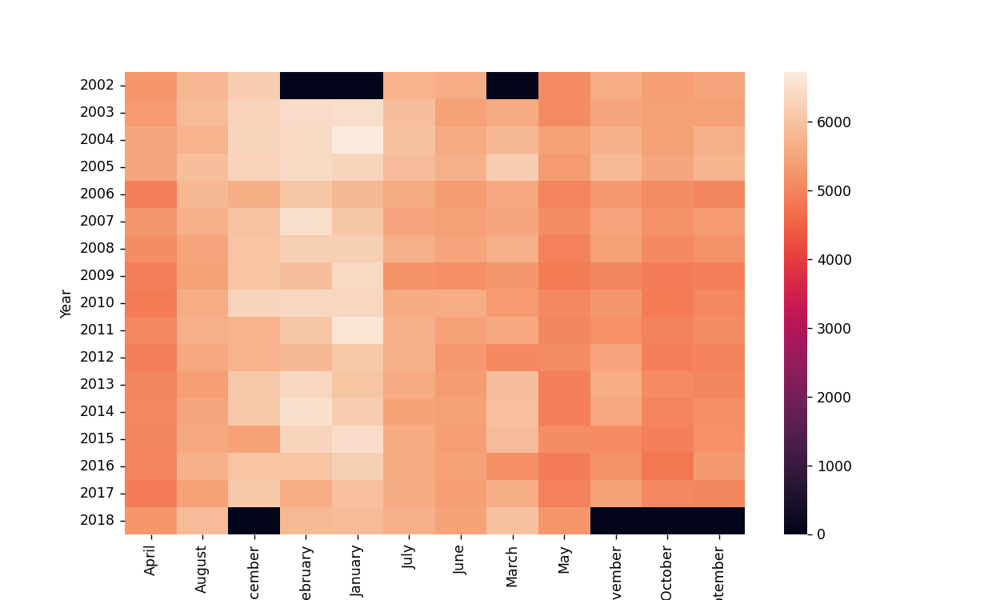

<AxesSubplot:xlabel='Month_Name', ylabel='Year'>

In [98]:

plt.figure(figsize=(10,6))
heatmap = pd.pivot_table(data=df2,values="PJMW_MW",index="Year",columns="Month_Name",aggfunc="median",fill_value=0)
sns.heatmap(heatmap ,fmt="g")

#### Check for the hourly trend

<IPython.core.display.Javascript object>


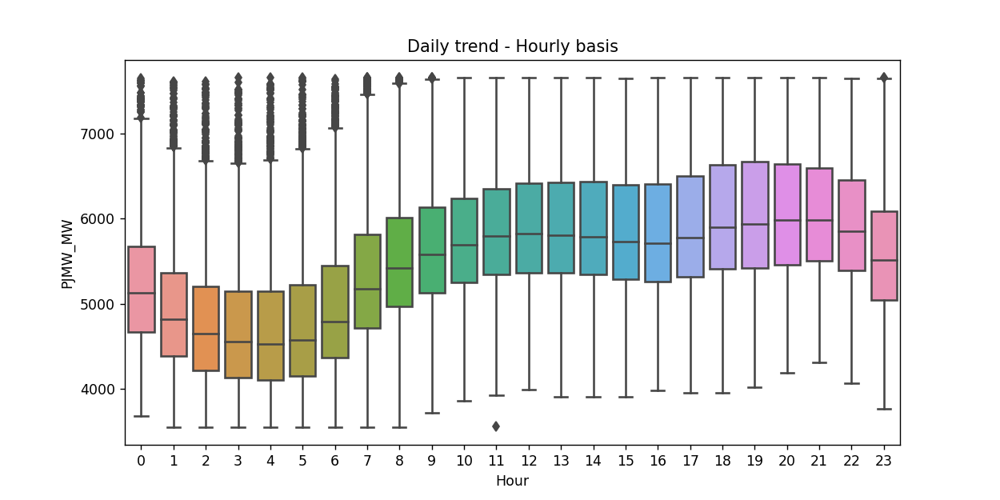

Text(0.5, 1.0, 'Daily trend - Hourly basis')

In [99]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x = df2['Hour'],
                y = df2['PJMW_MW'], 
                ax = ax)
ax.set_title('Daily trend - Hourly basis')

Observation: From midnight after 11 pm the power consumption starts decreasing and from morning 7 it increases till 11 pm.

# Check for the daily trend

<IPython.core.display.Javascript object>


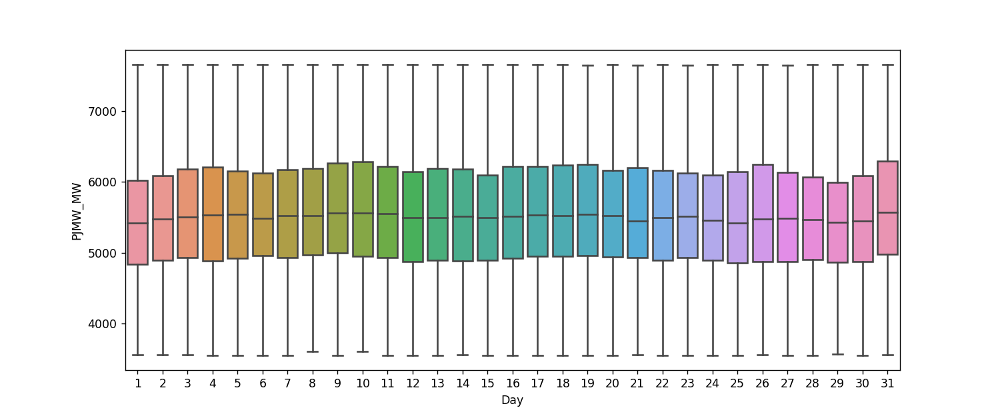

<AxesSubplot:xlabel='Day', ylabel='PJMW_MW'>

In [100]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = df2['Day'],
                y = df2['PJMW_MW'],
                ax = ax)

#### Check for the Weekly trend

<IPython.core.display.Javascript object>


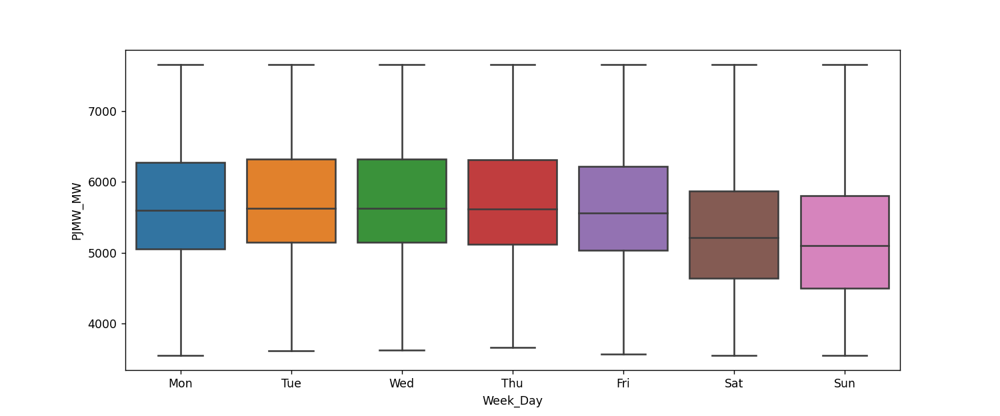

<AxesSubplot:xlabel='Week_Day', ylabel='PJMW_MW'>

In [101]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = df2['Week_Day'],
                y = df2['PJMW_MW'],order=['Mon','Tue','Wed','Thu','Fri','Sat','Sun'],
                ax = ax)

Observation:Low power consumption during Weekends

<IPython.core.display.Javascript object>


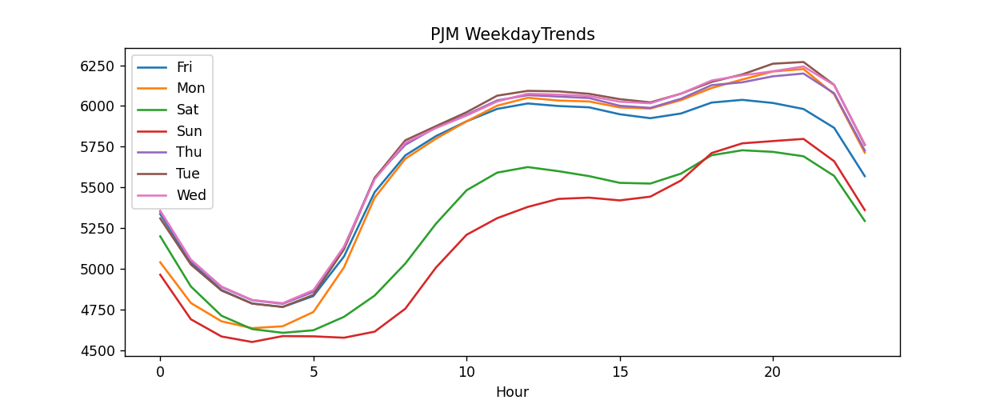

In [102]:
df2.pivot_table(index=df2['Hour'], 
                     columns='Week_Day', 
                     values='PJMW_MW',
                     aggfunc='mean').plot(figsize=(10,4),
                     title='PJM WeekdayTrends')
plt.legend(loc='upper left')

observation: The plot shows that there are less consumption of power during weekends as compared to weekdays. 
Also the power consumption began to rise from morning 7 and at midnight 11 it again decreases.

In [103]:
df2['season'].isnull().sum()

0

In [104]:
df2['season'].value_counts()

Winter    46547
Spring    37122
Fall      34936
Summer    24601
Name: season, dtype: int64

In [107]:
#Data visualization  of season data with energy consumption

<IPython.core.display.Javascript object>


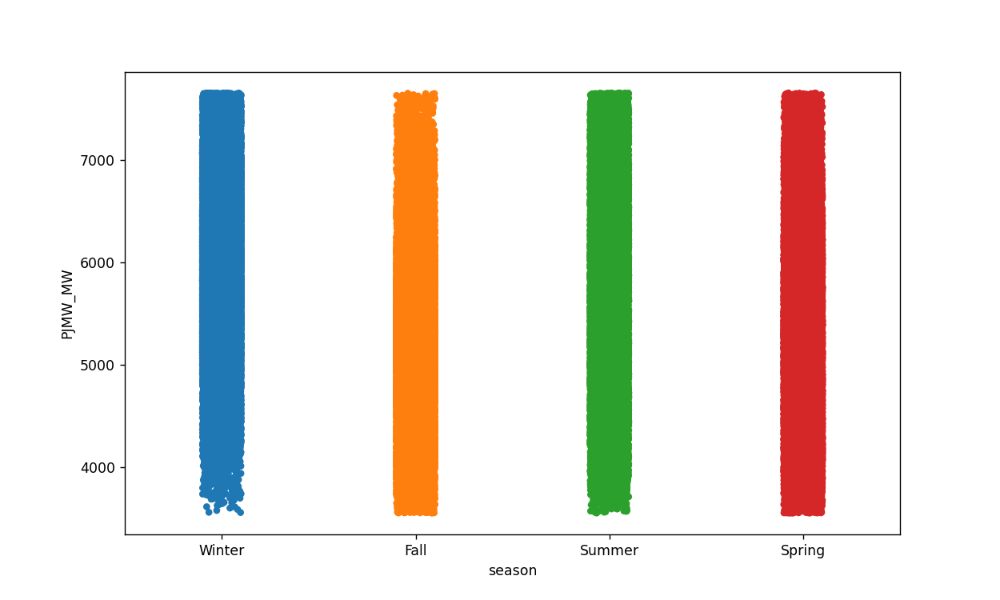

In [105]:
plt.figure(figsize=(10,6))
sns.stripplot(x='season', y='PJMW_MW', data=df2)
plt.show()

In [106]:
df3=df2.copy()

In [107]:
df3.set_index('Datetime')

,PJMW_MW,Month,Year,Day,Weekday,Month_Name,Week_Day,Hour,Minute,Quarter,Week,Day_Of_Year,season
Datetime,,,,,,,,,,,,,
2002-12-31 01:00:00,5077.000000,12,2002,31,1,December,Tue,1,0,4,1,365,Winter
2002-12-31 02:00:00,4939.000000,12,2002,31,1,December,Tue,2,0,4,1,365,Winter
2002-12-31 03:00:00,4885.000000,12,2002,31,1,December,Tue,3,0,4,1,365,Winter
2002-12-31 04:00:00,4857.000000,12,2002,31,1,December,Tue,4,0,4,1,365,Winter
2002-12-31 05:00:00,4930.000000,12,2002,31,1,December,Tue,5,0,4,1,365,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-01 20:00:00,5621.663180,1,2018,1,0,January,Mon,20,0,1,1,1,Winter
2018-01-01 21:00:00,5621.663180,1,2018,1,0,January,Mon,21,0,1,1,1,Winter
2018-01-01 22:00:00,5621.663180,1,2018,1,0,January,Mon,22,0,1,1,1,Winter


In [108]:
df3 = df3.sort_index()
df3

,Datetime,PJMW_MW,Month,Year,Day,Weekday,Month_Name,Week_Day,Hour,Minute,Quarter,Week,Day_Of_Year,season
0,2002-12-31 01:00:00,5077.000000,12,2002,31,1,December,Tue,1,0,4,1,365,Winter
1,2002-12-31 02:00:00,4939.000000,12,2002,31,1,December,Tue,2,0,4,1,365,Winter
2,2002-12-31 03:00:00,4885.000000,12,2002,31,1,December,Tue,3,0,4,1,365,Winter
3,2002-12-31 04:00:00,4857.000000,12,2002,31,1,December,Tue,4,0,4,1,365,Winter
4,2002-12-31 05:00:00,4930.000000,12,2002,31,1,December,Tue,5,0,4,1,365,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143201,2018-01-01 20:00:00,5621.663180,1,2018,1,0,January,Mon,20,0,1,1,1,Winter
143202,2018-01-01 21:00:00,5621.663180,1,2018,1,0,January,Mon,21,0,1,1,1,Winter
143203,2018-01-01 22:00:00,5621.663180,1,2018,1,0,January,Mon,22,0,1,1,1,Winter
143204,2018-01-01 23:00:00,5425.448847,1,2018,1,0,January,Mon,23,0,1,1,1,Winter


In [109]:
pip install holidays

Note: you may need to restart the kernel to use updated packages.


In [110]:
df4=df3.set_index('Datetime')

In [111]:
df4=df3.reset_index()

In [112]:
import holidays
from datetime import date
df4['holidays'] = df4.Datetime.apply( lambda x: 'Holiday' if x in holidays.US() else 'Normal day' )


<IPython.core.display.Javascript object>


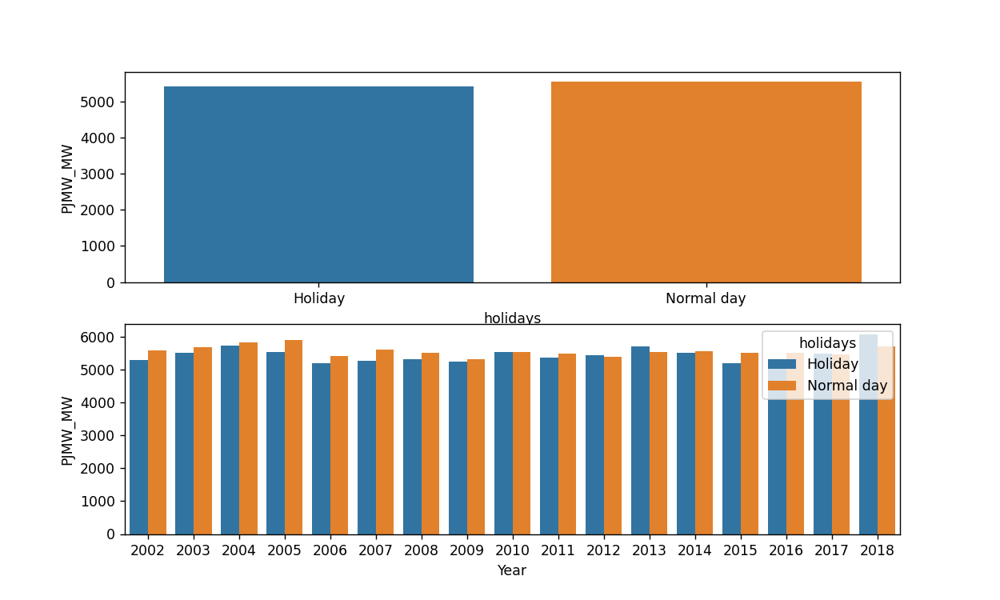

In [113]:
plt.figure(figsize=(10,6))
df4['holidays'] = df4.Datetime.apply( lambda x: 'Holiday' if x in holidays.US() else 'Normal day' )


aux1 = df4[['holidays', 'PJMW_MW']].groupby( 'holidays' ).mean().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='holidays', y='PJMW_MW', data=aux1 )

aux2 = df4[['Year', 'holidays', 'PJMW_MW']].groupby( ['Year', 'holidays'] ).mean().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='Year', y='PJMW_MW', hue='holidays', data=aux2 );

# breaking the data of hours with respect to time 

In [114]:
df4

,index,Datetime,PJMW_MW,Month,Year,Day,Weekday,Month_Name,Week_Day,Hour,Minute,Quarter,Week,Day_Of_Year,season,holidays
0,0,2002-12-31 01:00:00,5077.000000,12,2002,31,1,December,Tue,1,0,4,1,365,Winter,Normal day
1,1,2002-12-31 02:00:00,4939.000000,12,2002,31,1,December,Tue,2,0,4,1,365,Winter,Normal day
2,2,2002-12-31 03:00:00,4885.000000,12,2002,31,1,December,Tue,3,0,4,1,365,Winter,Normal day
3,3,2002-12-31 04:00:00,4857.000000,12,2002,31,1,December,Tue,4,0,4,1,365,Winter,Normal day
4,4,2002-12-31 05:00:00,4930.000000,12,2002,31,1,December,Tue,5,0,4,1,365,Winter,Normal day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143201,143201,2018-01-01 20:00:00,5621.663180,1,2018,1,0,January,Mon,20,0,1,1,1,Winter,Holiday
143202,143202,2018-01-01 21:00:00,5621.663180,1,2018,1,0,January,Mon,21,0,1,1,1,Winter,Holiday
143203,143203,2018-01-01 22:00:00,5621.663180,1,2018,1,0,January,Mon,22,0,1,1,1,Winter,Holiday
143204,143204,2018-01-01 23:00:00,5425.448847,1,2018,1,0,January,Mon,23,0,1,1,1,Winter,Holiday


In [115]:
#night time -22 to 3
#morning time- 4 to 12
# afternoon time -12 to 17
#evening time-17 to 22

def ffun(x):
    if x['Hour'] in [22,23,0,1,2,3]:
        time='Night'
    elif x['Hour'] in range(4,12):
        time='Morning'
    elif x['Hour'] in range (12,17):
        time='Afternoon'
    elif x['Hour'] in range(17,22):
            time='Evening'
    else:
        time=x
    return time

In [116]:
df4['time']=df4.apply(ffun,axis=1)
df4.head() # creating column of time

,index,Datetime,PJMW_MW,Month,Year,Day,Weekday,Month_Name,Week_Day,Hour,Minute,Quarter,Week,Day_Of_Year,season,holidays,time
0,0,2002-12-31 01:00:00,5077.0,12,2002,31,1,December,Tue,1,0,4,1,365,Winter,Normal day,Night
1,1,2002-12-31 02:00:00,4939.0,12,2002,31,1,December,Tue,2,0,4,1,365,Winter,Normal day,Night
2,2,2002-12-31 03:00:00,4885.0,12,2002,31,1,December,Tue,3,0,4,1,365,Winter,Normal day,Night
3,3,2002-12-31 04:00:00,4857.0,12,2002,31,1,December,Tue,4,0,4,1,365,Winter,Normal day,Morning
4,4,2002-12-31 05:00:00,4930.0,12,2002,31,1,December,Tue,5,0,4,1,365,Winter,Normal day,Morning


In [117]:
df4['time'].sort_values().value_counts(sort=False)

Afternoon    29840
Evening      29840
Morning      47744
Night        35782
Name: time, dtype: int64

In [121]:
#boxplot with respect to time

<IPython.core.display.Javascript object>


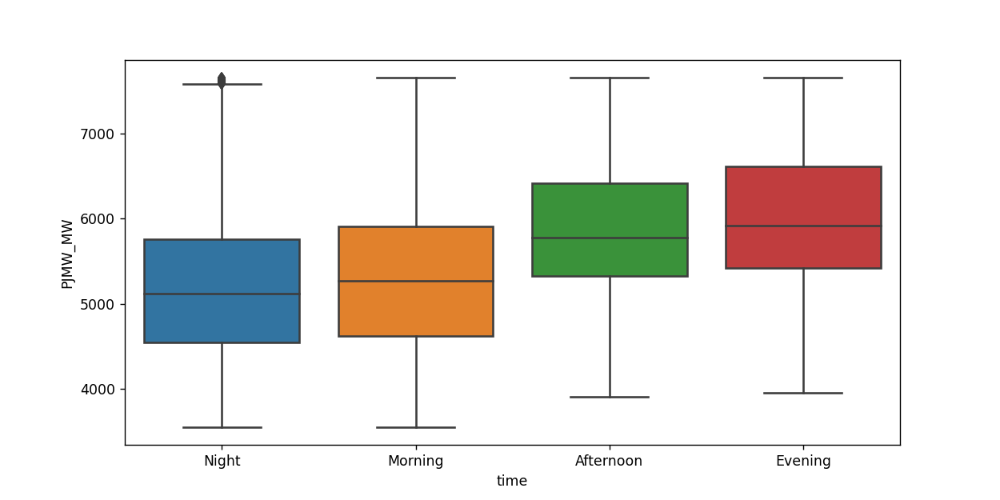

<AxesSubplot:xlabel='time', ylabel='PJMW_MW'>

In [118]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x = df4['time'],
                y = df4['PJMW_MW'],
                ax = ax)

observation :- as we see in this boxplot with time energy consumption is incresing in morning and decreasing in night

#mean ,max and min functions used in data to calculate average, minimum value and maximum value

# Energy consumption in season and year

In [119]:
print(df4.loc[:,['season','Year','PJMW_MW']])

        season  Year      PJMW_MW
0       Winter  2002  5077.000000
1       Winter  2002  4939.000000
2       Winter  2002  4885.000000
3       Winter  2002  4857.000000
4       Winter  2002  4930.000000
...        ...   ...          ...
143201  Winter  2018  5621.663180
143202  Winter  2018  5621.663180
143203  Winter  2018  5621.663180
143204  Winter  2018  5425.448847
143205  Winter  2018  5425.448847

[143206 rows x 3 columns]


# Average energy consumption in  year

In [120]:
print(df4.groupby('Year')['PJMW_MW'].mean())

Year
2002    5569.104946
2003    5672.765315
2004    5818.137424
2005    5890.511798
2006    5401.599121
2007    5578.909128
2008    5508.857481
2009    5307.293045
2010    5522.271467
2011    5472.345083
2012    5385.686210
2013    5523.836350
2014    5559.982866
2015    5493.265580
2016    5482.317314
2017    5454.625047
2018    5703.275703
Name: PJMW_MW, dtype: float64


# AVERAGE ENERGY CONSUMPTION IN EVERY SEASON

In [121]:
print(df4.groupby('season')['PJMW_MW'].mean())

season
Fall      5203.127786
Spring    5178.891747
Summer    5712.910245
Winter    6006.403381
Name: PJMW_MW, dtype: float64


#winter and summer energy consumption data 
summer 5266.420376 
winter 5559.598413
it shows difference in energy consumptiom in summer and winter
High energy consumption in winter and lower energy consumption in summer


In [130]:
#subplot of energy consumption in season

<IPython.core.display.Javascript object>


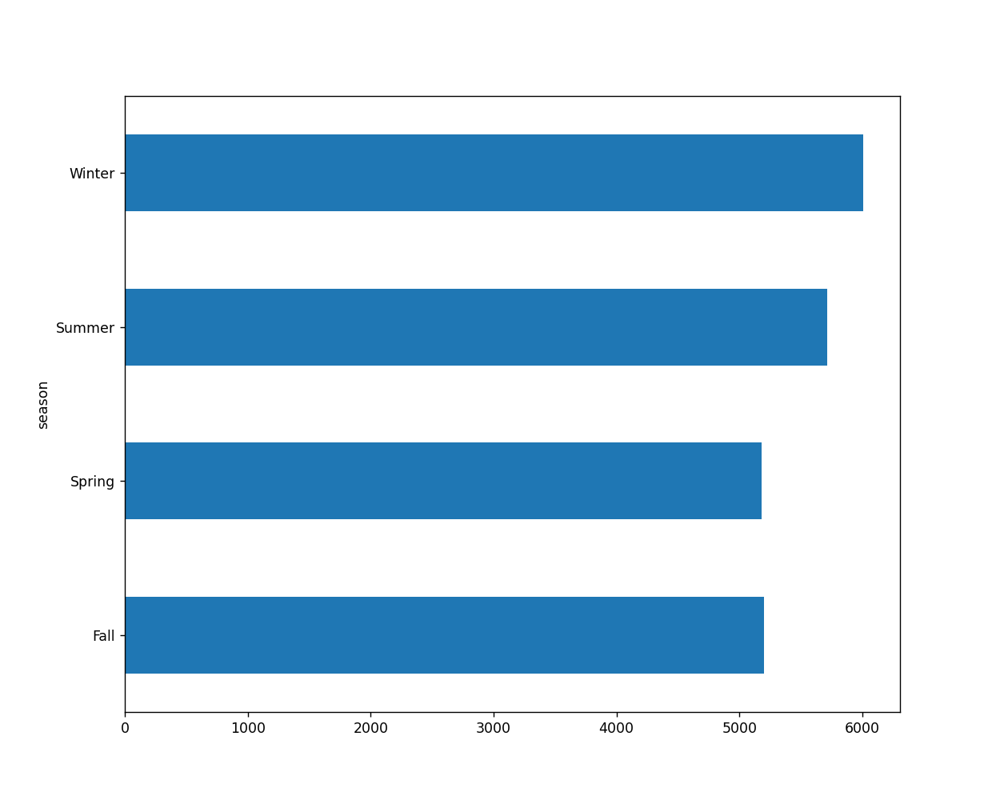

<AxesSubplot:ylabel='season'>

In [122]:
figbi, axesbi = plt.subplots(1, figsize=(10, 8))

df4.groupby('season')['PJMW_MW'].mean().plot(kind='barh')


In [288]:
#subplot of energy consumption in year

<IPython.core.display.Javascript object>


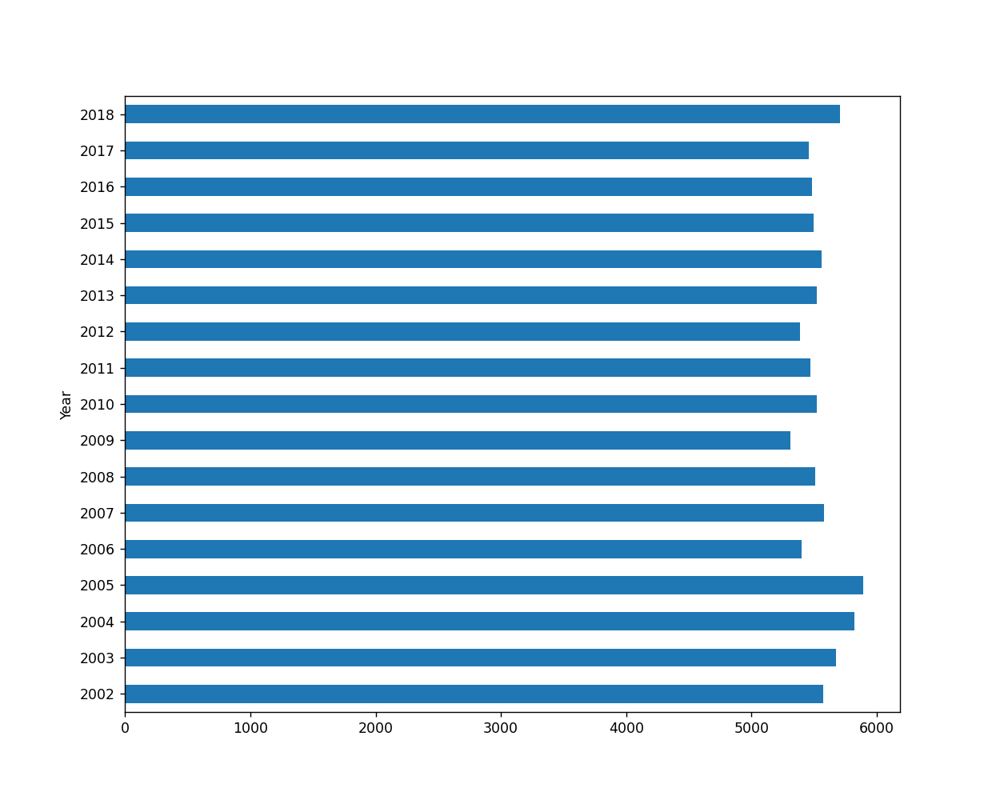

<AxesSubplot:ylabel='Year'>

In [123]:
figbi, axesbi = plt.subplots(1, figsize=(10, 8))

df4.groupby('Year')['PJMW_MW'].mean().plot(kind='barh')


# subplot of energy consumption in hour

<IPython.core.display.Javascript object>


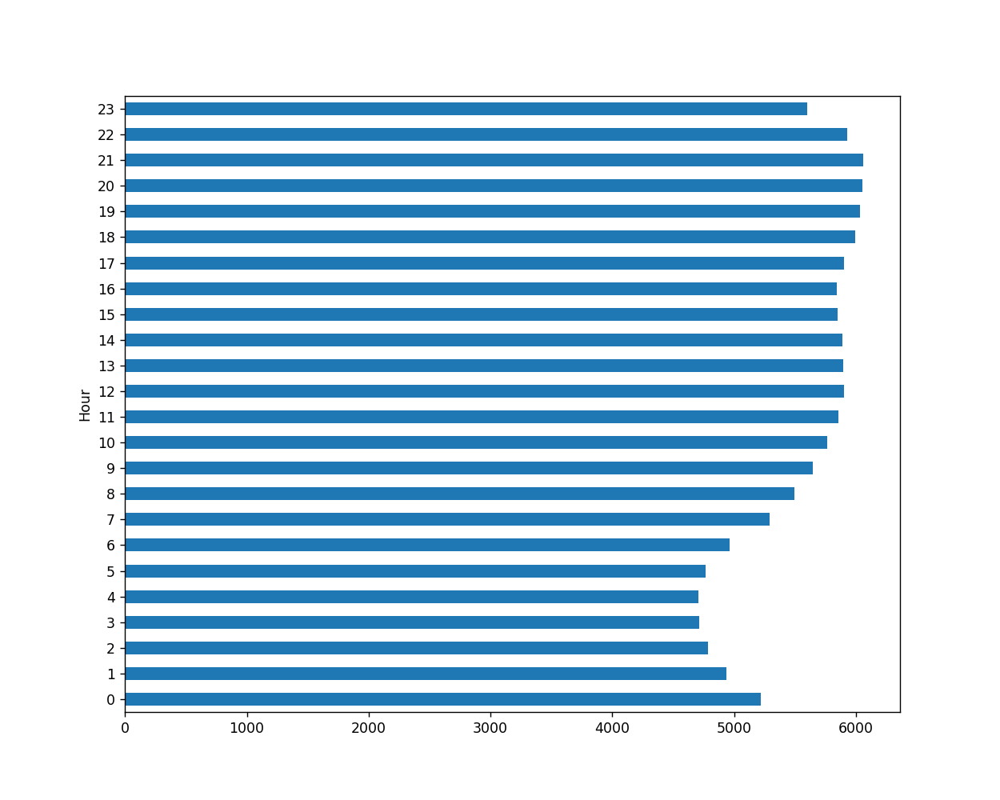

<AxesSubplot:ylabel='Hour'>

In [124]:
figbi, axesbi = plt.subplots(1, figsize=(10, 8))

df4.groupby('Hour')['PJMW_MW'].mean().plot(kind='barh')


# average energy consumption in every season

In [125]:
Season_data=df4.groupby('season')['PJMW_MW'].mean()
Season_data

season
Fall      5203.127786
Spring    5178.891747
Summer    5712.910245
Winter    6006.403381
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


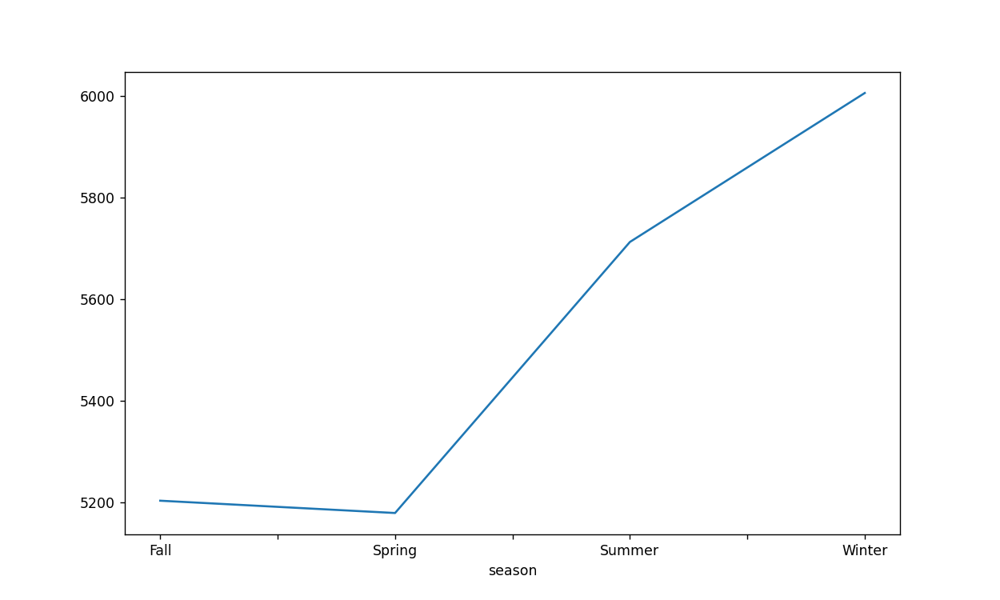

In [126]:
plt.figure(figsize=(10,6))
Season_data.plot()
plt.show()

<IPython.core.display.Javascript object>


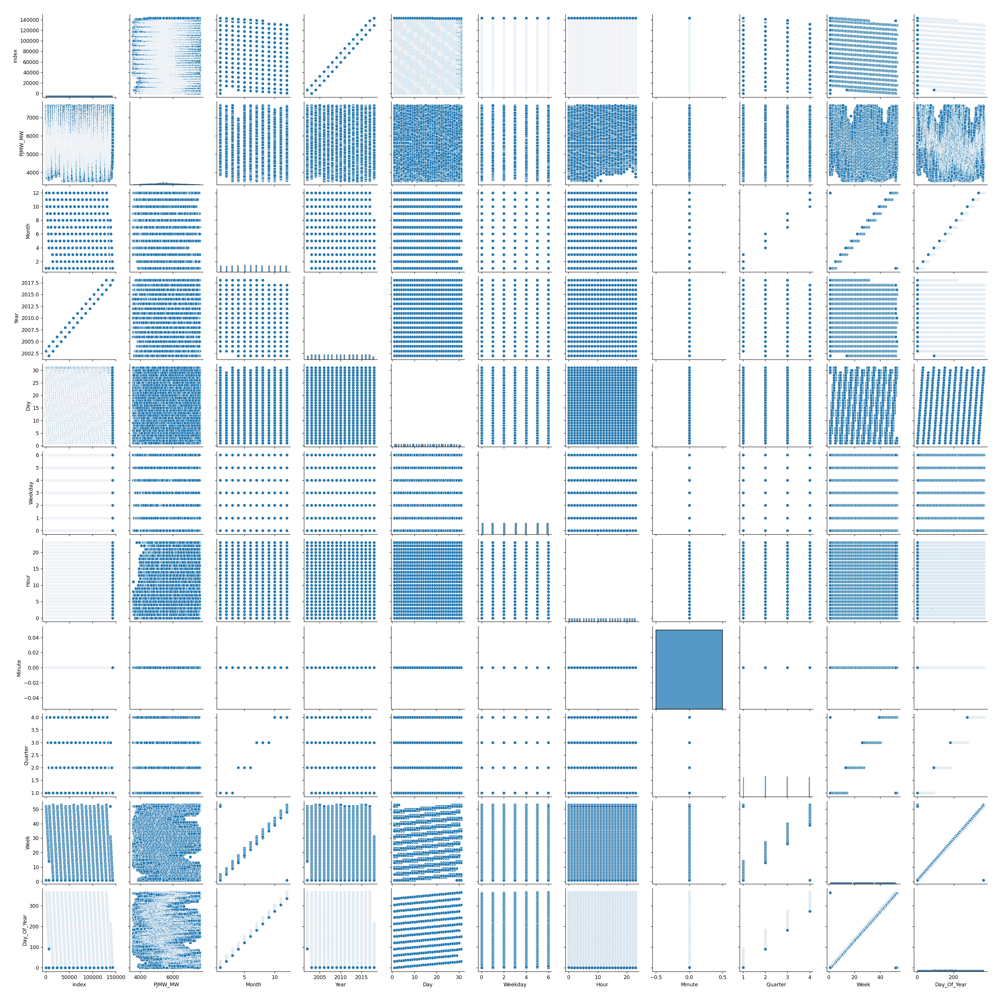

In [131]:

sns.pairplot(df4)
plt.show()

#as we have to create hourly data so we have to show visualization of hourly data and PJMW data

#scatter plot of hourly energy consumption of data

<IPython.core.display.Javascript object>


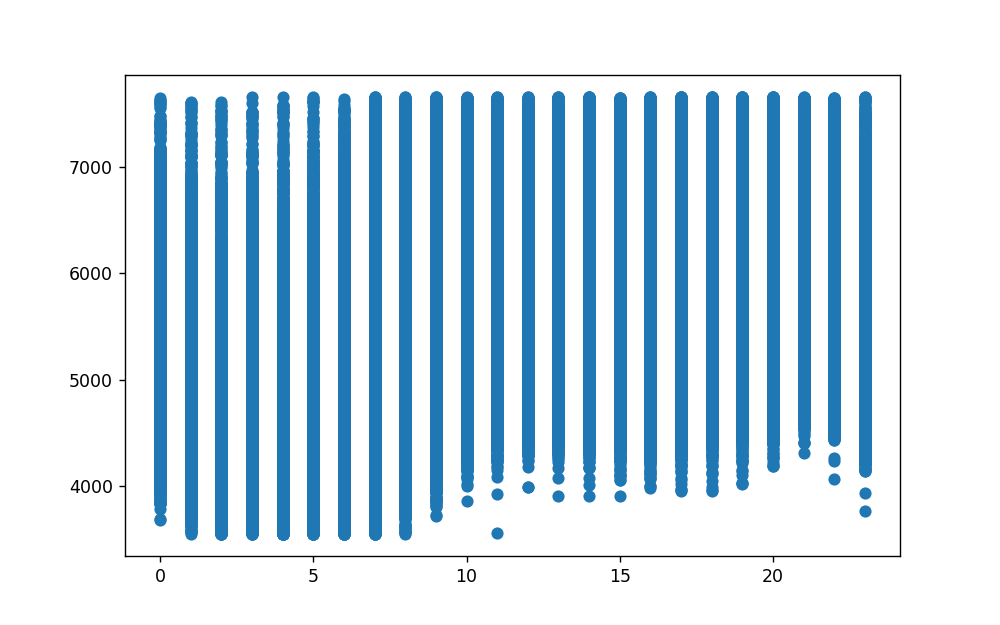

In [132]:
plt.figure(figsize=(8,5))
plt.scatter(df4.Hour,df4.PJMW_MW)

#scatter plot of yearly energy consumption of data

<IPython.core.display.Javascript object>


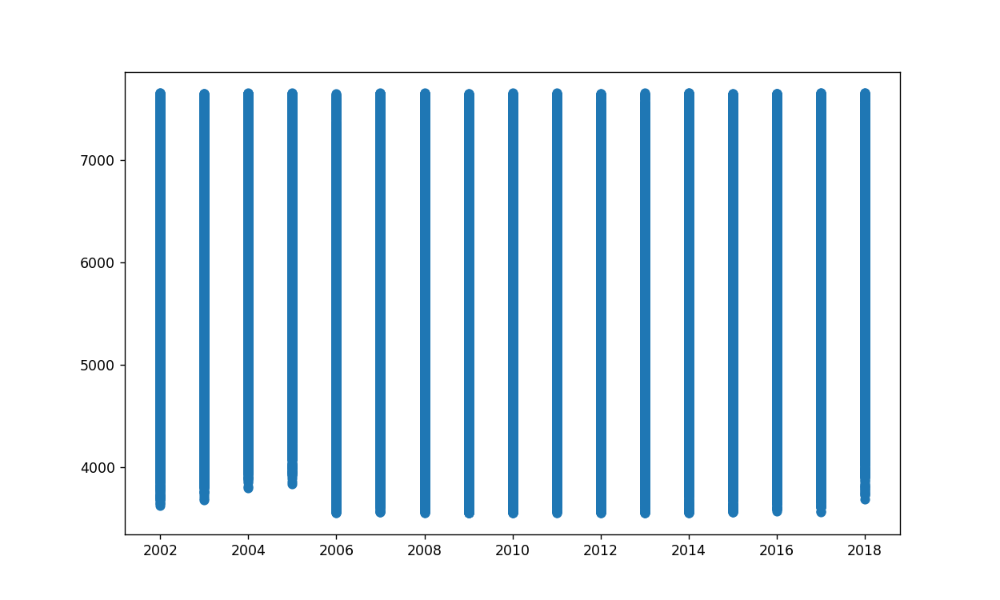

In [133]:
plt.figure(figsize=(10,6))
plt.scatter(df4.Year,df4.PJMW_MW)

#scatterplot of data by quarter wise energy consmuption in month

<IPython.core.display.Javascript object>


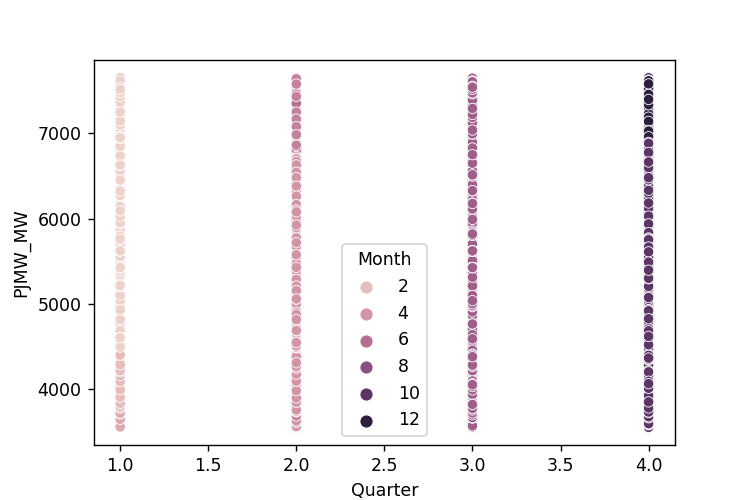

<AxesSubplot:xlabel='Quarter', ylabel='PJMW_MW'>

In [134]:
plt.figure(figsize=(6,4))
sns.scatterplot('Quarter','PJMW_MW',hue='Month',data=df4)

#scatterplot of data by month wise energy consmuption in year

<IPython.core.display.Javascript object>


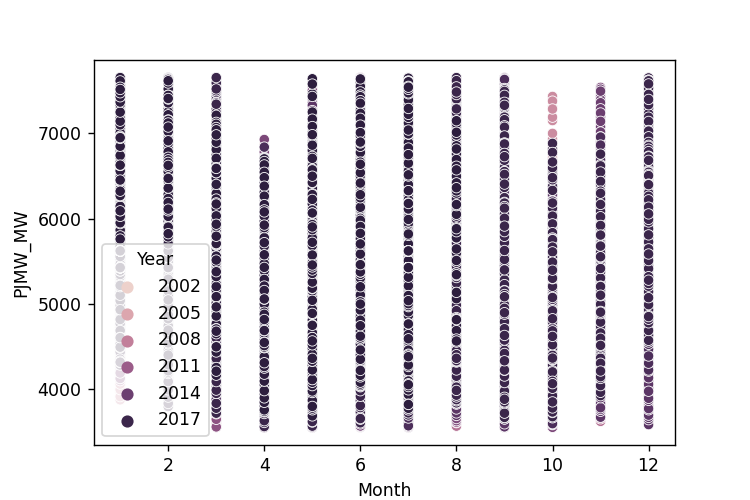

<AxesSubplot:xlabel='Month', ylabel='PJMW_MW'>

In [135]:
plt.figure(figsize=(6,4))
sns.scatterplot('Month','PJMW_MW',hue='Year',data=df4)

<IPython.core.display.Javascript object>


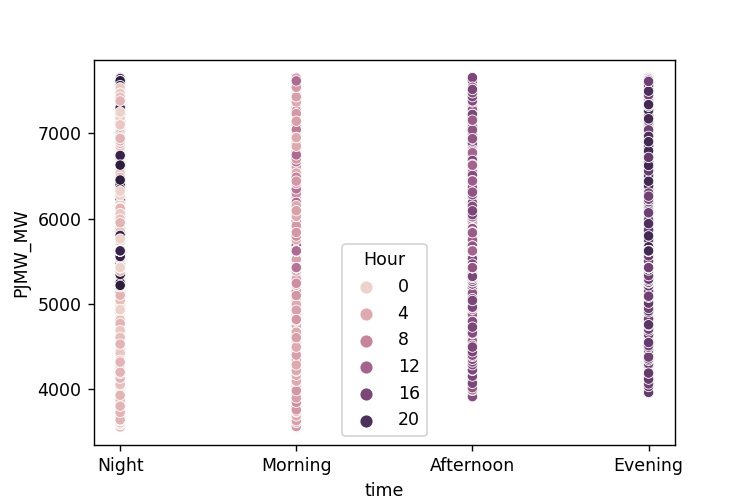

<AxesSubplot:xlabel='time', ylabel='PJMW_MW'>

In [136]:
plt.figure(figsize=(6,4))
sns.scatterplot('time','PJMW_MW',hue='Hour',data=df4)

# Minimum  maximum  and average energy consumption in every Year

In [137]:
df4.groupby('Year')['PJMW_MW'].max()


Year
2002    7653.0
2003    7651.0
2004    7654.0
2005    7653.0
2006    7647.0
2007    7654.0
2008    7653.0
2009    7649.0
2010    7653.0
2011    7654.0
2012    7651.0
2013    7654.0
2014    7654.0
2015    7649.0
2016    7650.0
2017    7653.0
2018    7653.0
Name: PJMW_MW, dtype: float64

In [138]:
df4.groupby('Year')['PJMW_MW'].min()

Year
2002    3621.0
2003    3677.0
2004    3793.0
2005    3837.0
2006    3553.0
2007    3562.0
2008    3553.0
2009    3551.0
2010    3551.0
2011    3552.0
2012    3555.0
2013    3551.0
2014    3551.0
2015    3558.0
2016    3571.0
2017    3562.0
2018    3687.0
Name: PJMW_MW, dtype: float64

In [139]:
df4.groupby('Year')['PJMW_MW'].mean()

Year
2002    5569.104946
2003    5672.765315
2004    5818.137424
2005    5890.511798
2006    5401.599121
2007    5578.909128
2008    5508.857481
2009    5307.293045
2010    5522.271467
2011    5472.345083
2012    5385.686210
2013    5523.836350
2014    5559.982866
2015    5493.265580
2016    5482.317314
2017    5454.625047
2018    5703.275703
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


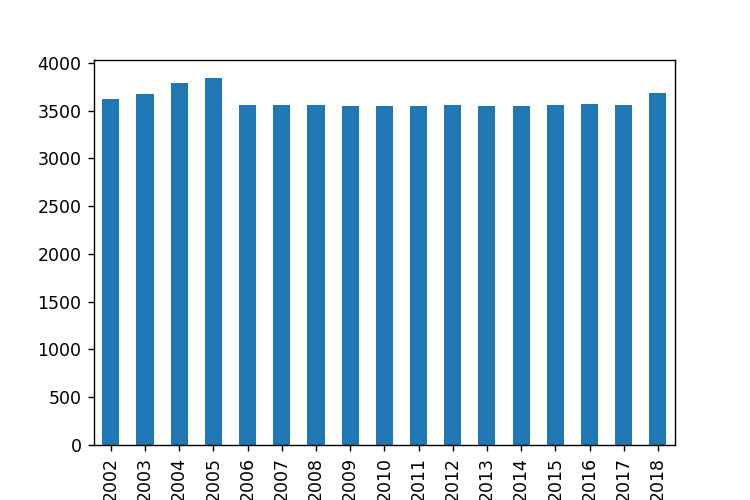

<IPython.core.display.Javascript object>


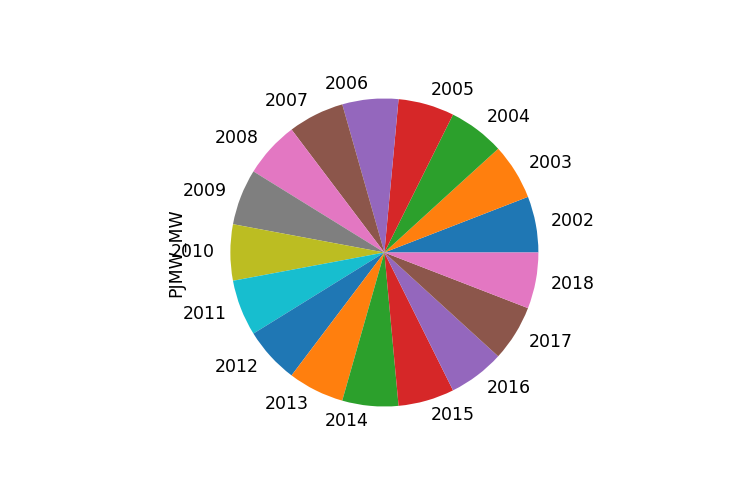

<IPython.core.display.Javascript object>


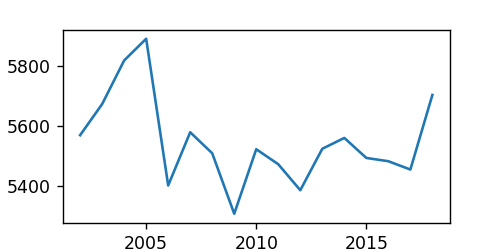

<AxesSubplot:xlabel='Year'>

In [140]:
figbi, axesbi = plt.subplots(1, figsize=(6, 4))
df4.groupby('Year')['PJMW_MW'].min().plot(kind='bar')
figbi, axesbi = plt.subplots(1, figsize=(6, 4))
df4.groupby('Year')['PJMW_MW'].max().plot(kind='pie')
figbi, axesbi = plt.subplots(1, figsize=(4, 2))
df4.groupby('Year')['PJMW_MW'].mean().plot(kind='line')


# Minimum  maximum  and average energy consumption in every Month

In [141]:


df4.groupby('Month_Name')['PJMW_MW'].min()


Month_Name
April        3551.0
August       3567.0
December     3585.0
February     3796.0
January      3876.0
July         3551.0
June         3554.0
March        3556.0
May          3551.0
November     3623.0
October      3553.0
September    3551.0
Name: PJMW_MW, dtype: float64

In [142]:
df4.groupby('Month_Name')['PJMW_MW'].max()


Month_Name
April        6927.0
August       7654.0
December     7653.0
February     7652.0
January      7654.0
July         7654.0
June         7654.0
March        7654.0
May          7639.0
November     7538.0
October      7432.0
September    7651.0
Name: PJMW_MW, dtype: float64

In [143]:
df4.groupby('Month_Name')['PJMW_MW'].mean()


Month_Name
April        5036.962973
August       5704.112433
December     6003.361382
February     6182.115169
January      6211.861714
July         5721.224623
June         5471.267792
March        5643.496507
May          5033.230285
November     5402.416749
October      5006.125711
September    5207.374029
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


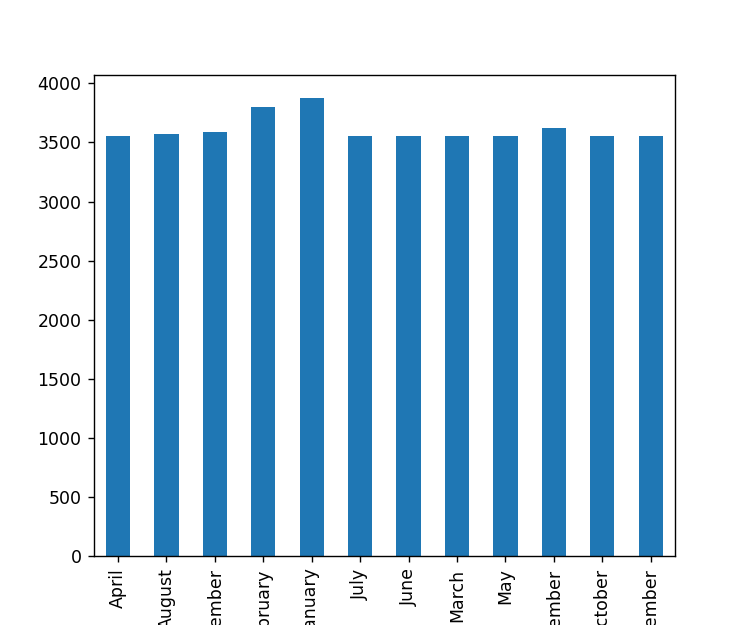

<IPython.core.display.Javascript object>


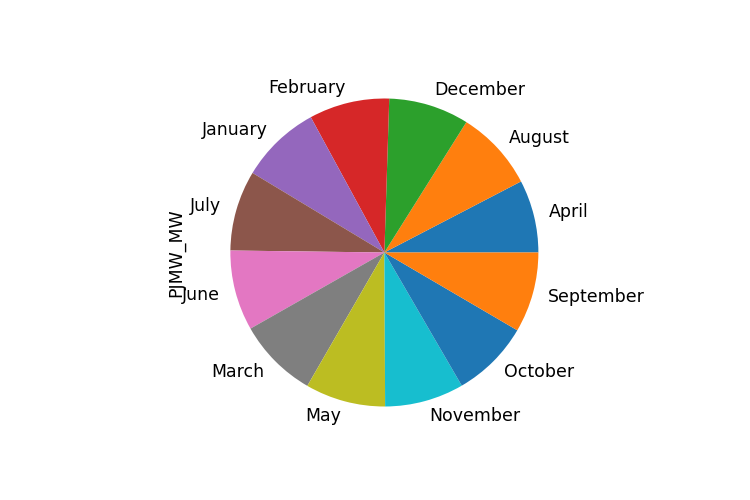

<IPython.core.display.Javascript object>


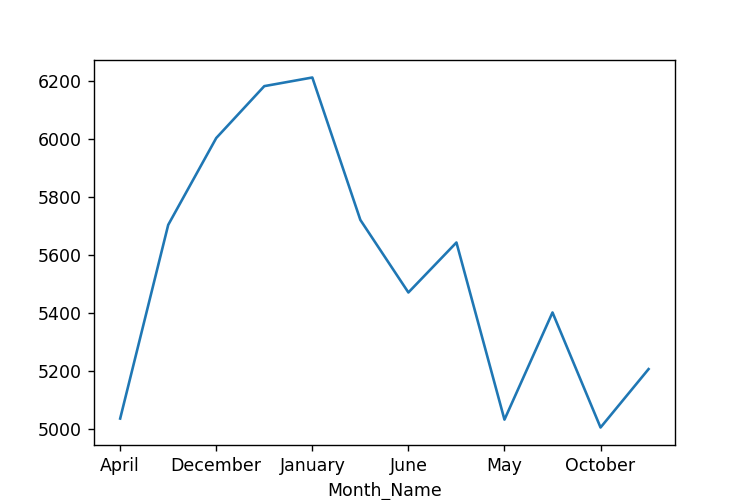

<AxesSubplot:xlabel='Month_Name'>

In [144]:
figbi, axesbi = plt.subplots(1, figsize=(6, 5))

df4.groupby('Month_Name')['PJMW_MW'].min().plot(kind='bar')

figbi, axesbi = plt.subplots(1, figsize=(6, 4))

df4.groupby('Month_Name')['PJMW_MW'].max().plot(kind='pie')

figbi, axesbi = plt.subplots(1, figsize=(6, 4))

df4.groupby('Month_Name')['PJMW_MW'].mean().plot(kind='line')


# Minimum  maximum  and average energy consumption in every Hour

In [145]:
df4.groupby('Hour')['PJMW_MW'].min()


Hour
0     3682.0
1     3559.0
2     3553.0
3     3552.0
4     3551.0
5     3551.0
6     3551.0
7     3552.0
8     3558.0
9     3728.0
10    3860.0
11    3564.0
12    3992.0
13    3915.0
14    3913.0
15    3913.0
16    3986.0
17    3956.0
18    3962.0
19    4025.0
20    4195.0
21    4315.0
22    4070.0
23    3771.0
Name: PJMW_MW, dtype: float64

In [146]:
df4.groupby('Hour')['PJMW_MW'].max()


Hour
0     7643.0
1     7602.0
2     7604.0
3     7653.0
4     7649.0
5     7650.0
6     7637.0
7     7654.0
8     7652.0
9     7653.0
10    7652.0
11    7652.0
12    7652.0
13    7654.0
14    7653.0
15    7648.0
16    7653.0
17    7654.0
18    7653.0
19    7651.0
20    7654.0
21    7653.0
22    7642.0
23    7649.0
Name: PJMW_MW, dtype: float64

In [147]:
df4.groupby('Hour')['PJMW_MW'].mean()


Hour
0     5221.708616
1     4934.265616
2     4783.746416
3     4714.709848
4     4705.893004
5     4762.502566
6     4964.685468
7     5288.610163
8     5497.483919
9     5643.504774
10    5764.267041
11    5858.506890
12    5900.615042
13    5896.784254
14    5887.080533
15    5851.010052
16    5843.046958
17    5901.583485
18    5995.781227
19    6032.084250
20    6055.278060
21    6058.350172
22    5929.242584
23    5598.115739
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


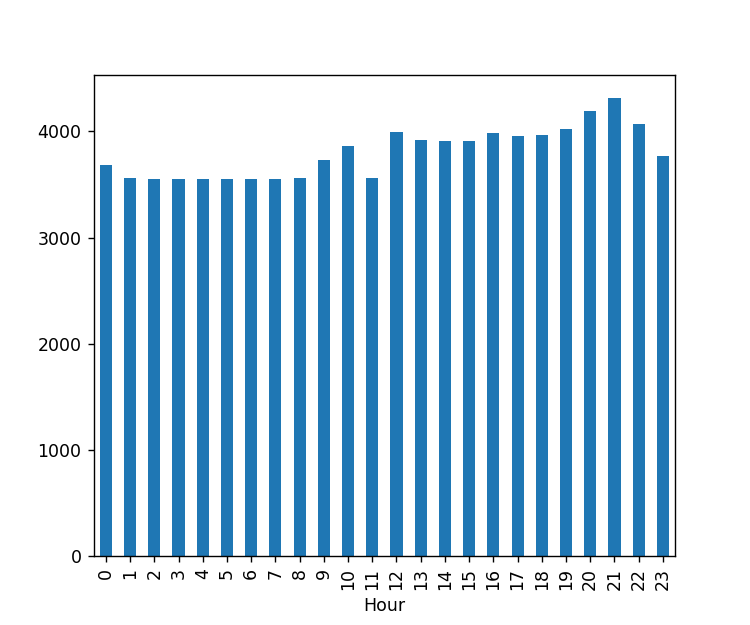

<IPython.core.display.Javascript object>


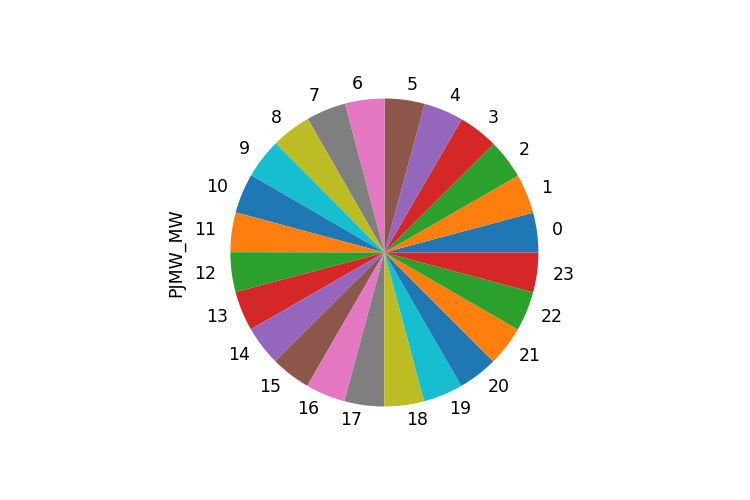

<IPython.core.display.Javascript object>


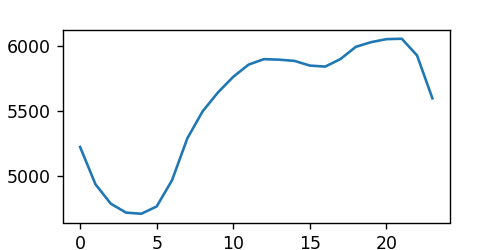

<AxesSubplot:xlabel='Hour'>

In [148]:
figbi, axesbi = plt.subplots(1, figsize=(6, 5))
df4.groupby('Hour')['PJMW_MW'].min().plot(kind='bar')
figbi, axesbi = plt.subplots(1, figsize=(6, 4))
df4.groupby('Hour')['PJMW_MW'].max().plot(kind='pie')
figbi, axesbi = plt.subplots(1, figsize=(4, 2))
df4.groupby('Hour')['PJMW_MW'].mean().plot(kind='line')


# Minimum  maximum  and average energy consumption in every time

In [149]:
df4.groupby('time')['PJMW_MW'].max()


time
Afternoon    7654.0
Evening      7654.0
Morning      7654.0
Night        7653.0
Name: PJMW_MW, dtype: float64

In [150]:
df4.groupby('time')['PJMW_MW'].min()


time
Afternoon    3913.0
Evening      3956.0
Morning      3551.0
Night        3552.0
Name: PJMW_MW, dtype: float64

In [151]:
df4.groupby('time')['PJMW_MW'].mean()


time
Afternoon    5875.707368
Evening      6008.615439
Morning      5310.681728
Night        5197.285616
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


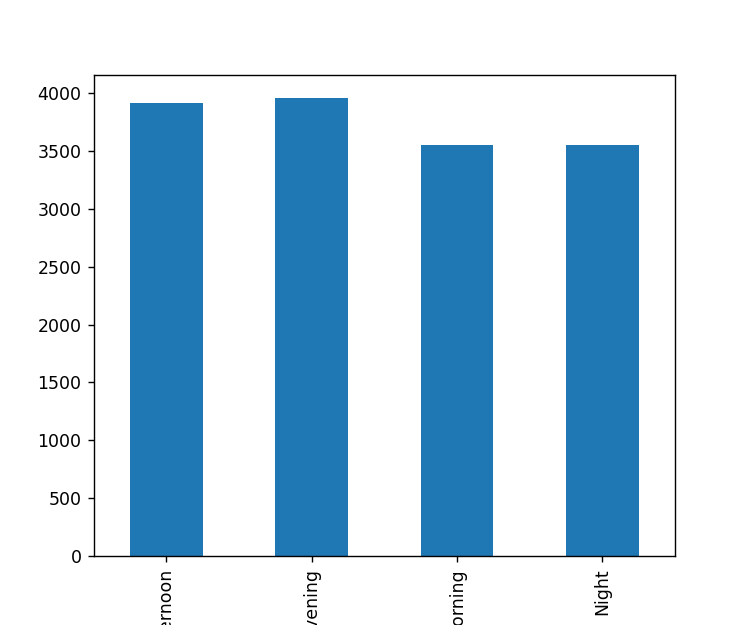

<IPython.core.display.Javascript object>


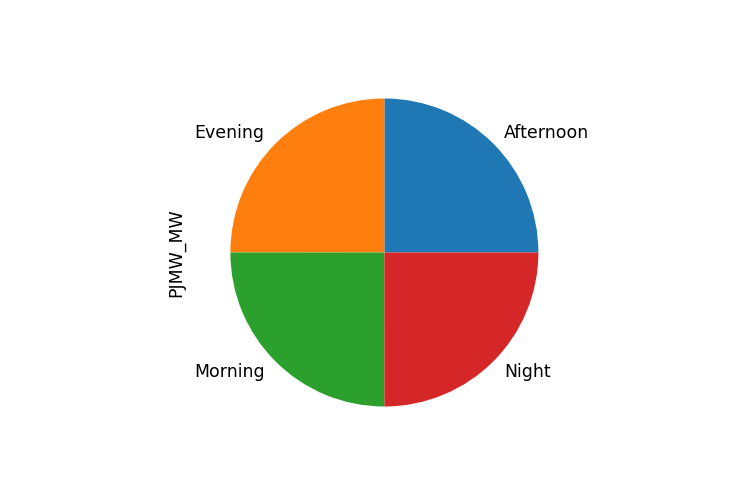

<IPython.core.display.Javascript object>


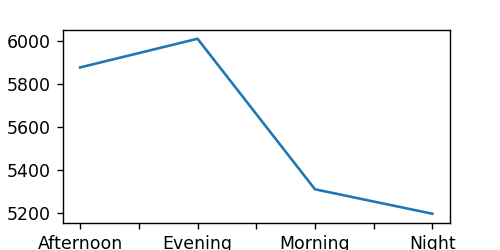

<AxesSubplot:xlabel='time'>

In [152]:
figbi, axesbi = plt.subplots(1, figsize=(6, 5))
df4.groupby('time')['PJMW_MW'].min().plot(kind='bar')
figbi, axesbi = plt.subplots(1, figsize=(6, 4))
df4.groupby('time')['PJMW_MW'].max().plot(kind='pie')
figbi, axesbi = plt.subplots(1, figsize=(4, 2))
df4.groupby('time')['PJMW_MW'].mean().plot(kind='line')


# Minimum  maximum  and average energy consumption in every season

In [153]:
df4.groupby('season')['PJMW_MW'].max()


season
Fall      7651.0
Spring    7654.0
Summer    7654.0
Winter    7654.0
Name: PJMW_MW, dtype: float64

In [154]:
df4.groupby('season')['PJMW_MW'].min()


season
Fall      3551.0
Spring    3551.0
Summer    3551.0
Winter    3556.0
Name: PJMW_MW, dtype: float64

In [155]:

df4.groupby('season')['PJMW_MW'].mean()

season
Fall      5203.127786
Spring    5178.891747
Summer    5712.910245
Winter    6006.403381
Name: PJMW_MW, dtype: float64

<IPython.core.display.Javascript object>


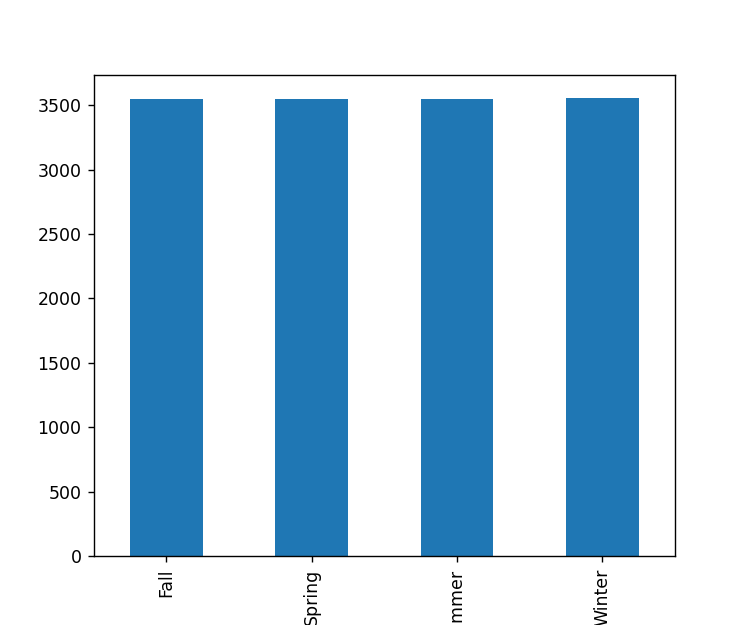

<IPython.core.display.Javascript object>


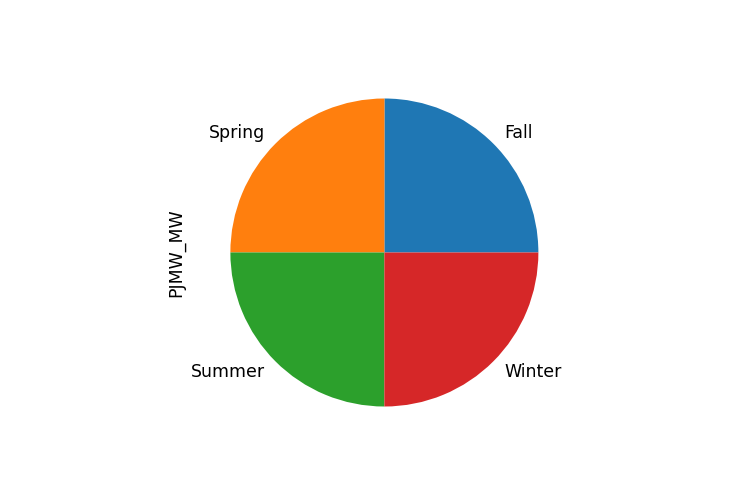

<IPython.core.display.Javascript object>


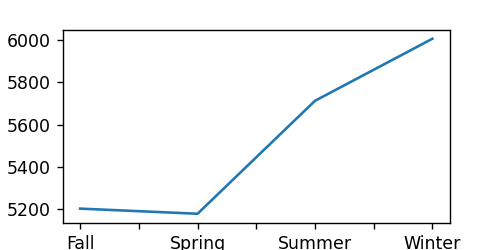

<AxesSubplot:xlabel='season'>

In [156]:
figbi, axesbi = plt.subplots(1, figsize=(6, 5))
df4.groupby('season')['PJMW_MW'].min().plot(kind='bar')
figbi, axesbi = plt.subplots(1, figsize=(6, 4))
df4.groupby('season')['PJMW_MW'].max().plot(kind='pie')
figbi, axesbi = plt.subplots(1, figsize=(4, 2))
df4.groupby('season')['PJMW_MW'].mean().plot(kind='line')


<IPython.core.display.Javascript object>


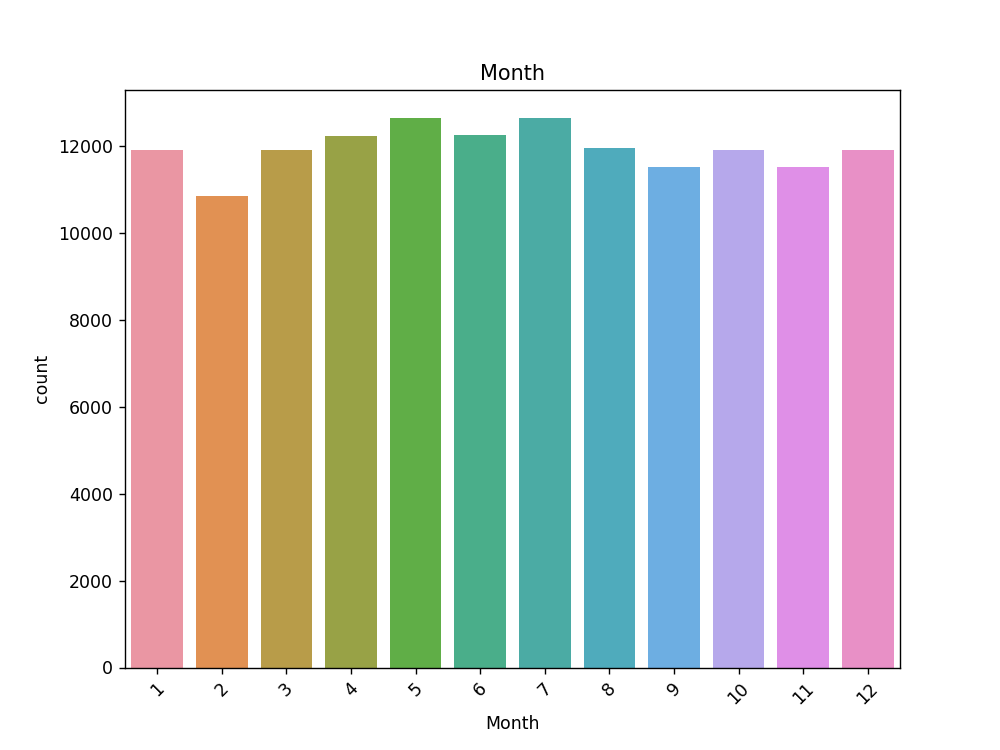

<IPython.core.display.Javascript object>


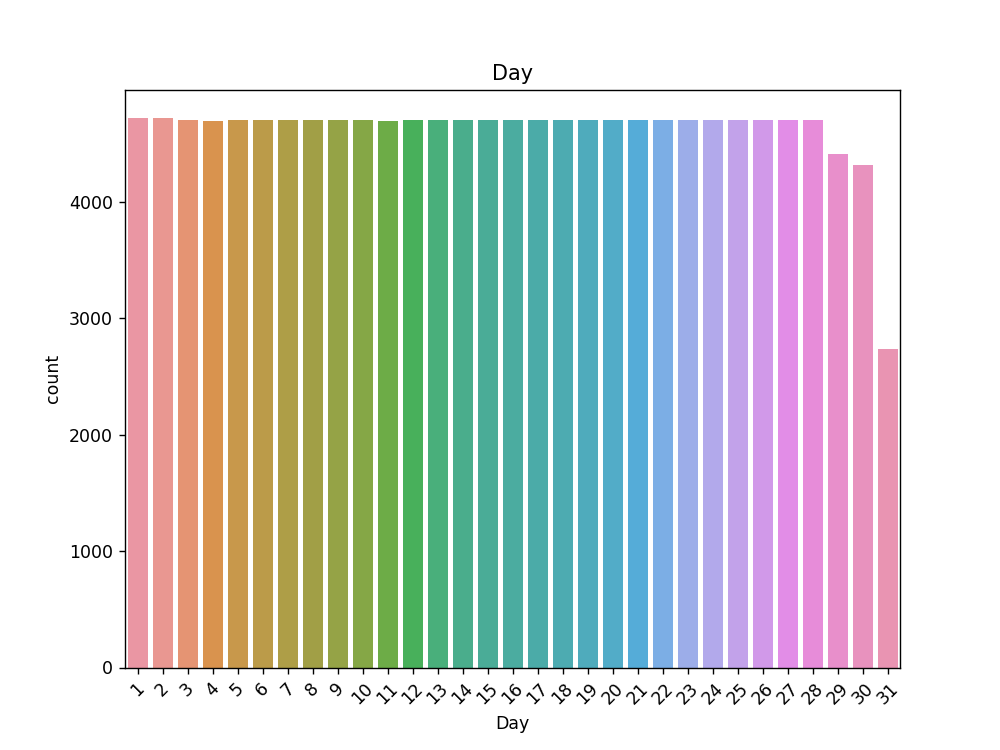

<IPython.core.display.Javascript object>


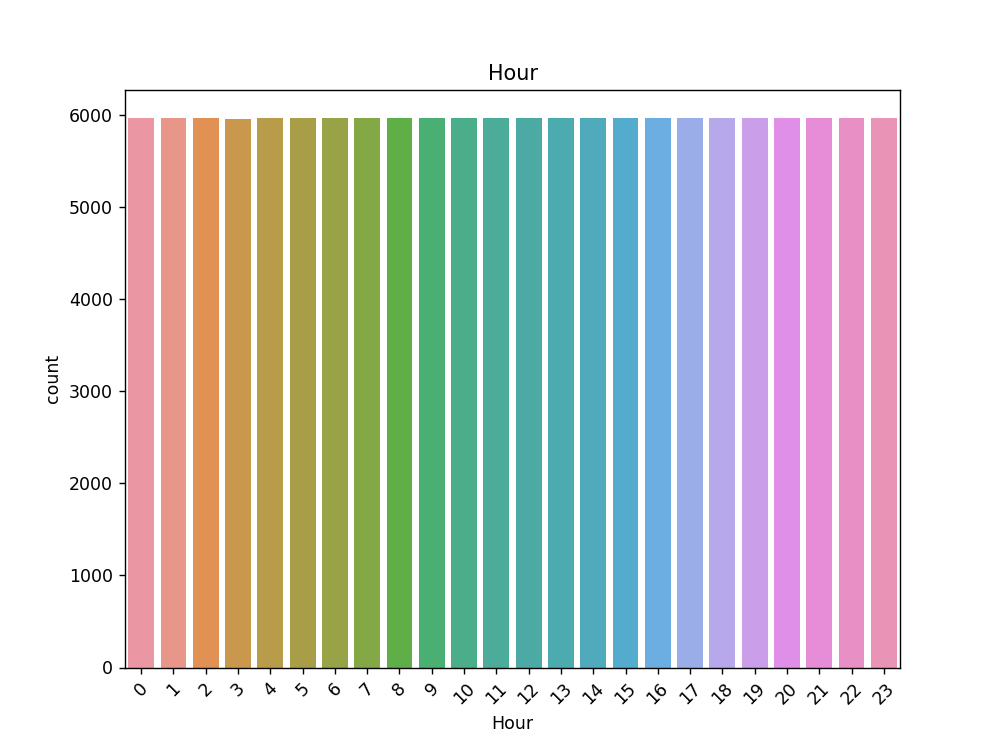

<IPython.core.display.Javascript object>


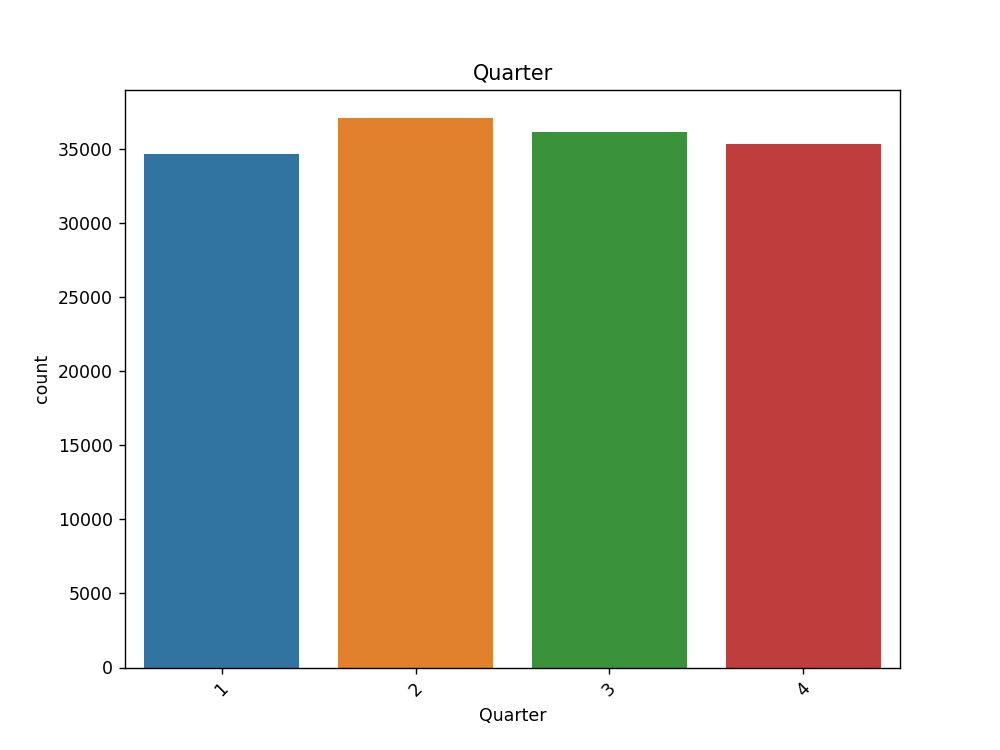

<IPython.core.display.Javascript object>


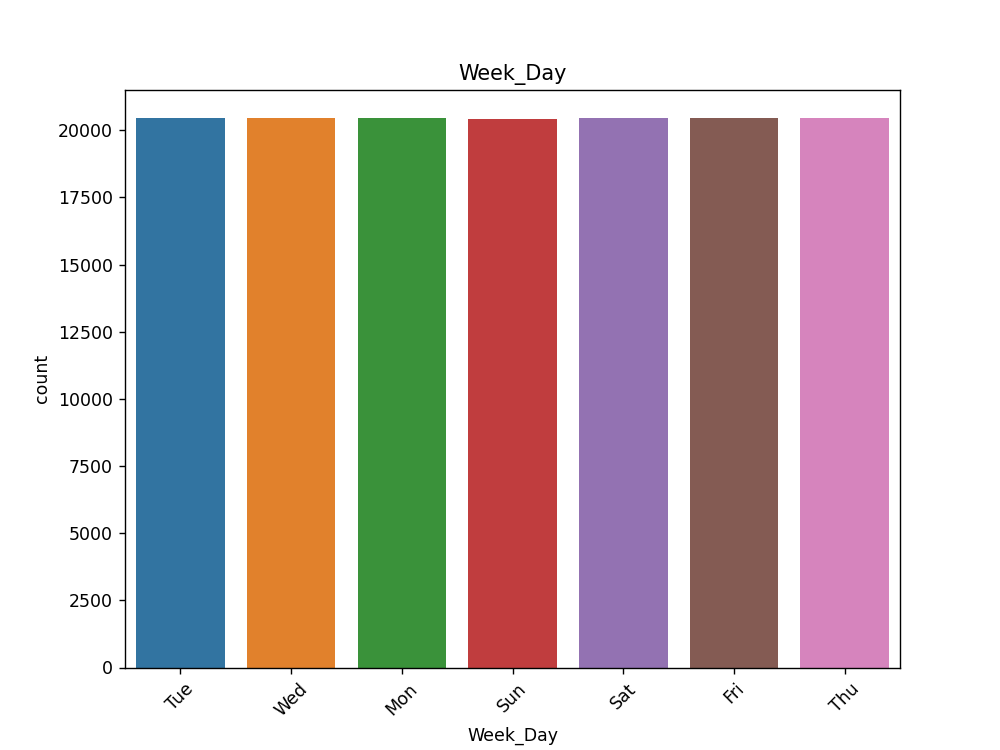

<IPython.core.display.Javascript object>


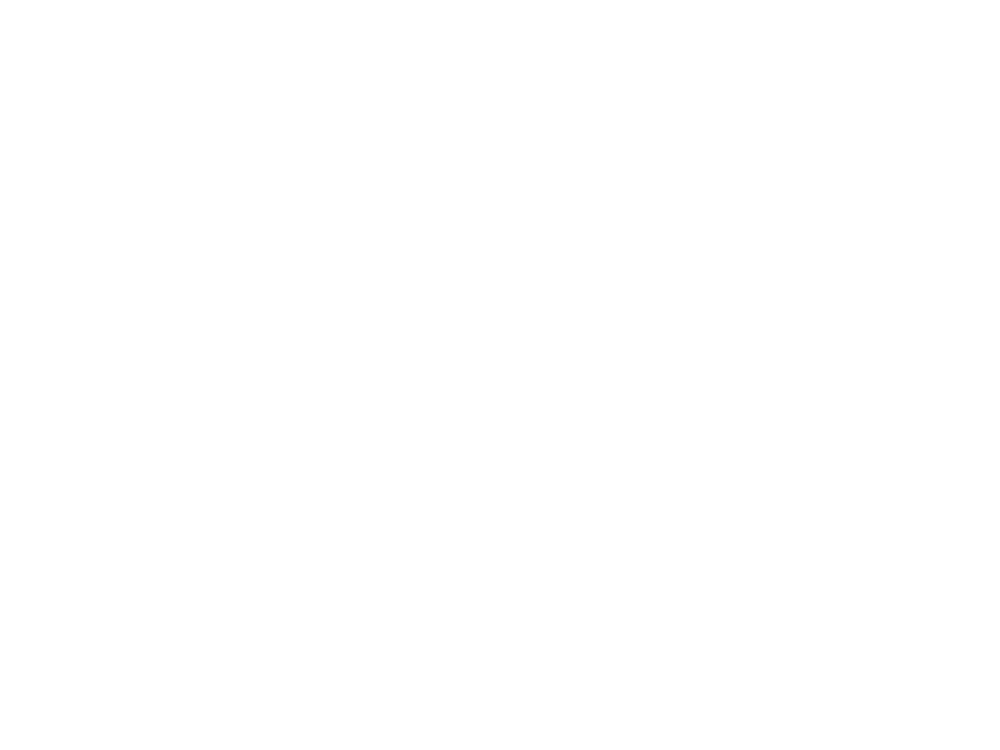

In [163]:
for col in ['Year','Month','Day','Hour','Quarter','Week_Day']:
    sns.countplot(df4[col])
    plt.title(col)
    plt.xticks(rotation=45)
    plt.figure(figsize=(8,6))
    plt.show()


In [321]:
#OBSERVATION 

Month: as year no missing values
Day: No missing values and for 29,30,31 values are less because leap year or month day difference
Hour : all Data present
Weekday : all data present

Energy consumption on hourly,daily,weekly, monthly and yearly basis

<IPython.core.display.Javascript object>


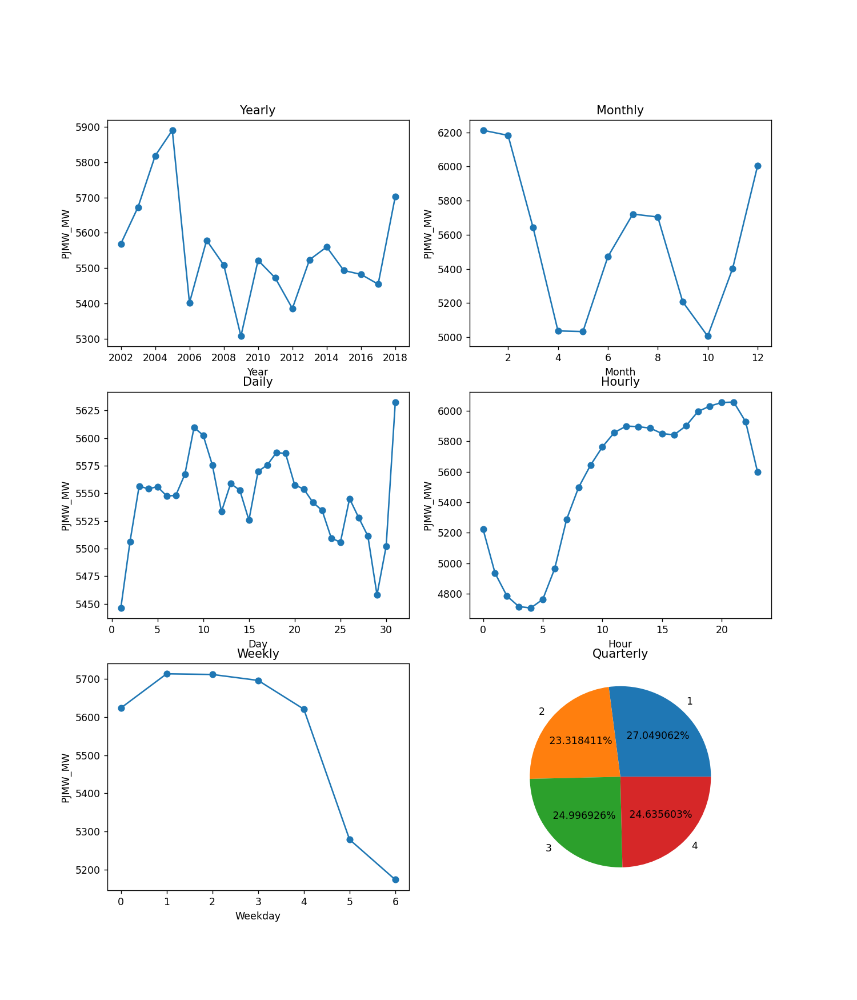

Text(0.5, 1.0, 'Quarterly')

In [157]:
fig, ax=plt.subplots(nrows=3, ncols=2, figsize=(12,14))
##energy consupmtion on yearly basis
df_year = df4.groupby('Year').agg({"PJMW_MW": "mean"}).reset_index()
ax[0][0].plot(df_year['Year'],df_year['PJMW_MW'],marker='o')
ax[0][0].set_title('Yearly')
ax[0][0].set_xlabel('Year')
ax[0][0].set_ylabel('PJMW_MW')
##energy consupmtion on monthly basis
df_month = df4.groupby('Month').agg({"PJMW_MW": "mean"}).reset_index()
ax[0][1].plot(df_month['Month'],df_month['PJMW_MW'],marker='o')
ax[0][1].set_title('Monthly')
ax[0][1].set_xlabel('Month')
ax[0][1].set_ylabel('PJMW_MW')
##energy consupmtion on daily basis
df_day = df4.groupby('Day').agg({"PJMW_MW": "mean"}).reset_index()
ax[1][0].plot(df_day['Day'],df_day['PJMW_MW'],marker='o')
ax[1][0].set_title('Daily')
ax[1][0].set_xlabel('Day')
ax[1][0].set_ylabel('PJMW_MW')
##energy consupmtion on hourly basis
df_hour = df4.groupby('Hour').agg({"PJMW_MW": "mean"}).reset_index()
ax[1][1].plot(df_hour['Hour'],df_hour['PJMW_MW'],marker='o')
ax[1][1].set_title('Hourly')
ax[1][1].set_xlabel('Hour')
ax[1][1].set_ylabel('PJMW_MW')
##energy consupmtion on weekly basis
df_weekday= df4.groupby('Weekday').agg({"PJMW_MW": "mean"}).reset_index()
ax[2][0].plot(df_weekday['Weekday'],df_weekday['PJMW_MW'],marker='o')
ax[2][0].set_title('Weekly')
ax[2][0].set_xlabel('Weekday')
ax[2][0].set_ylabel('PJMW_MW')
##energy consupmtion on quarterly basis
df_quarter= df4.groupby('Quarter').agg({"PJMW_MW": "mean"}).reset_index()
ax[2][1].pie(df_quarter['PJMW_MW'],labels=df_quarter['Quarter'],autopct='% 0f%%')
ax[2][1].set_title('Quarterly')


# Decomposition
We will de-compose the time series into trend, seasonal and residuals

In [139]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

<IPython.core.display.Javascript object>


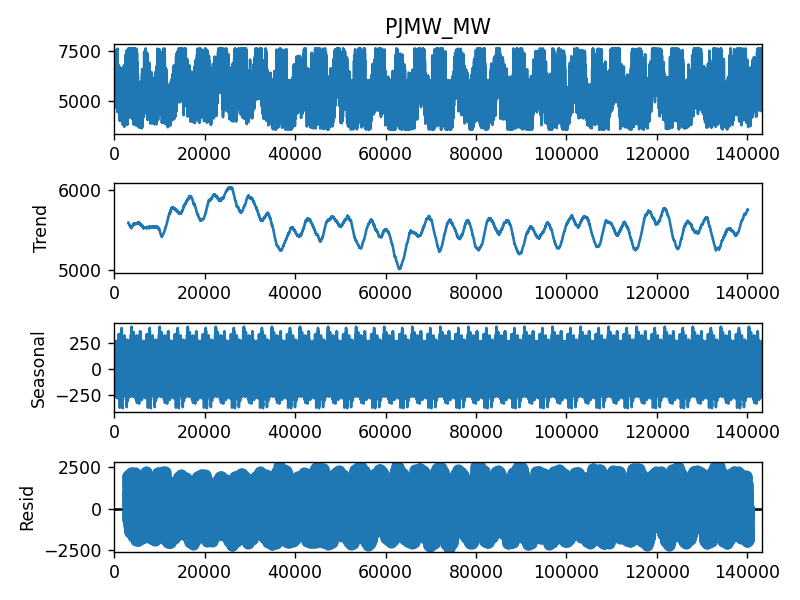

In [159]:
decompose = seasonal_decompose(df4.PJMW_MW,period=6205)
decompose.plot()
plt.show()

This graph gives us an overall trend in our data from year 2002 till year 2018.
Seasonality cannot be checked as the datapoints are too many.

Lets resample and aggregate up to weekly level to reduce the noise

<IPython.core.display.Javascript object>


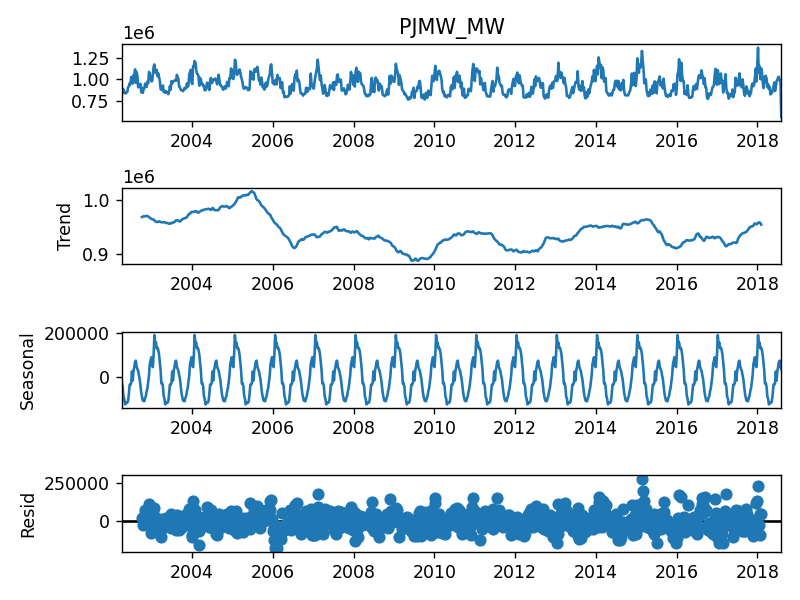

In [161]:
weekly_data = df.PJMW_MW.resample(rule='W').sum()
decomposition = seasonal_decompose(weekly_data, model='additive') # Aggregate to weekly level
fig = decomposition.plot()
plt.show()

Observations:
There is no trend since its not increasing or decreasing.
Seasonal pattern is consistent
Resduals are whetever is left after fitting the trend and seasonal components to the observed data. 
It's the component we cannot explain. We want the residuals to be i.i.d (i.e uncorrelated). If the residuals have a pattern,
it means there is still some structural information left to be captured. Residuals are showing some wavy pattern,
which is not good. Let's perform **Ljung Box test** to confirm if they are i.i.d as a group.
We do not want to see any recognizable patterns in the residuals, e.g. waves, upward/downward slope, funnel pattern etc.

# Ljung Box test

In [162]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(df, lags=[1], return_df=True)

,lb_stat,lb_pvalue
1,136113.053316,0.0


Since lb_pvalue < 0.05, residuals are uncorrelated. If the residuals are correlated, we can perform transformations to see if it stabilizes the variance. It's also an indication that we may need to use exogenous variable to fully explain the time series behaviour or use higher order models.
In this case, the residuals are uncorrelated.

#### LAG PLOT

A lag plot is used to help evaluate whether the values in a dataset or time series are random. If the data are random, the lag plot will exhibit no identifiable pattern. If the data are not random, the lag plot will demonstrate a clearly identifiable pattern

<IPython.core.display.Javascript object>


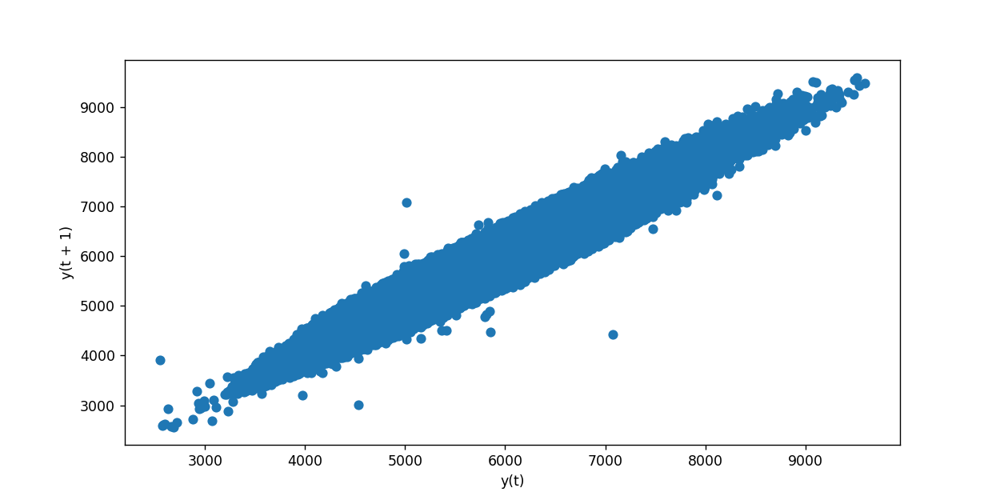

In [163]:
from pandas.plotting import lag_plot
plt.figure(figsize=(10,5))
lag_plot(df.PJMW_MW)
plt.show()

Our data has Moderate Autocorrelation as the lag plot is in eliptical shape.

<IPython.core.display.Javascript object>


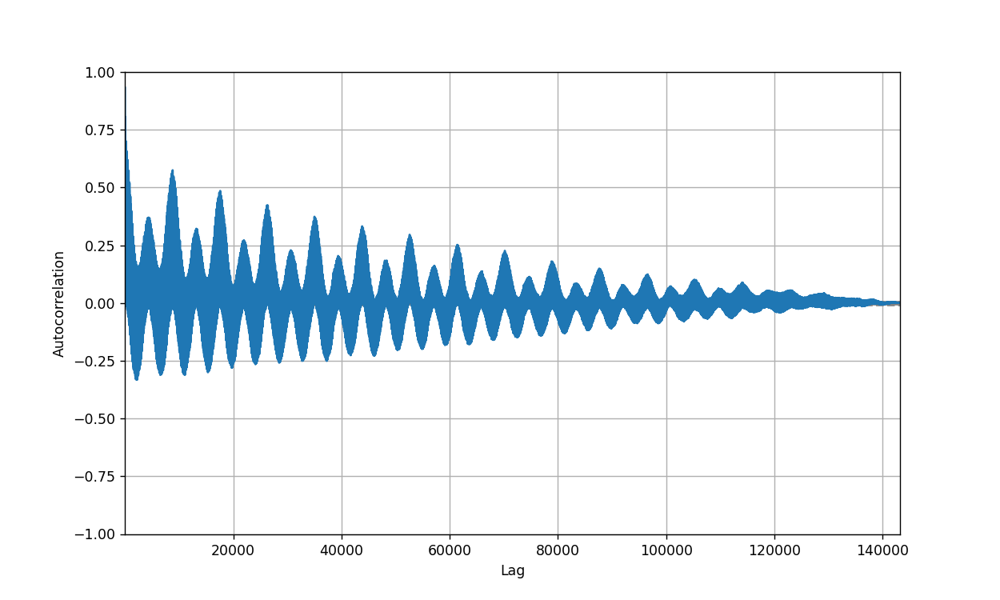

In [164]:
from pandas.plotting import autocorrelation_plot
plt.figure(figsize=(10,6))
autocorrelation_plot(df4.PJMW_MW)
plt.show()

# Check for Stationarity

Stationary data means? 
1) constant mean

2) constant variance

3) constant covariance (uncorrelated)

We verify this by observing change in mean, variance, autocorrelation and with a statistical test (ADFuller test)

Following are the Techniques to check data is stationary or not ?
** Augmented Dickey-fuller test


# 1.Constant mean

<IPython.core.display.Javascript object>


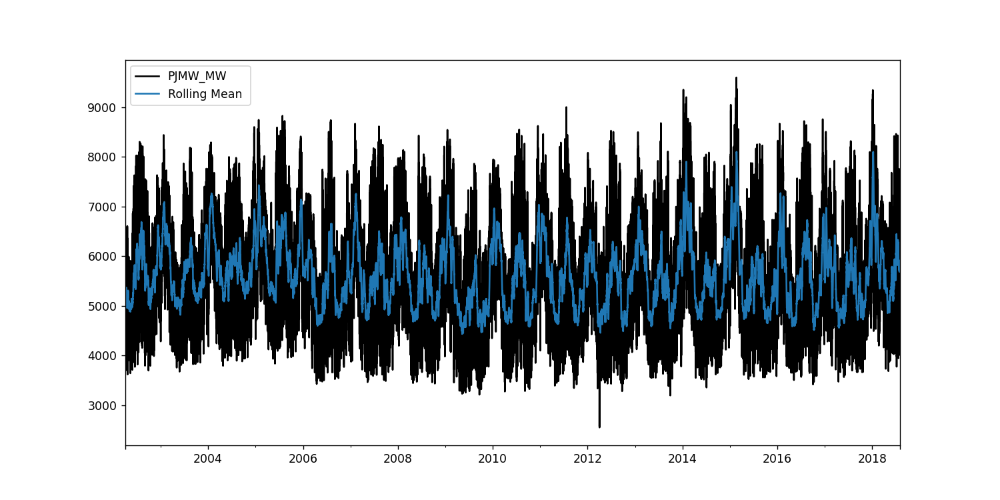

Mean is: 5602.245472380474


In [165]:
df.plot(figsize=(12,6), legend=True, label="Data", cmap='gray')
df["PJMW_MW"].rolling(200, center=False).mean().plot(legend=True, label="Rolling Mean ");
print("Mean is:", df["PJMW_MW"].mean())

### 2) constant variance

<IPython.core.display.Javascript object>


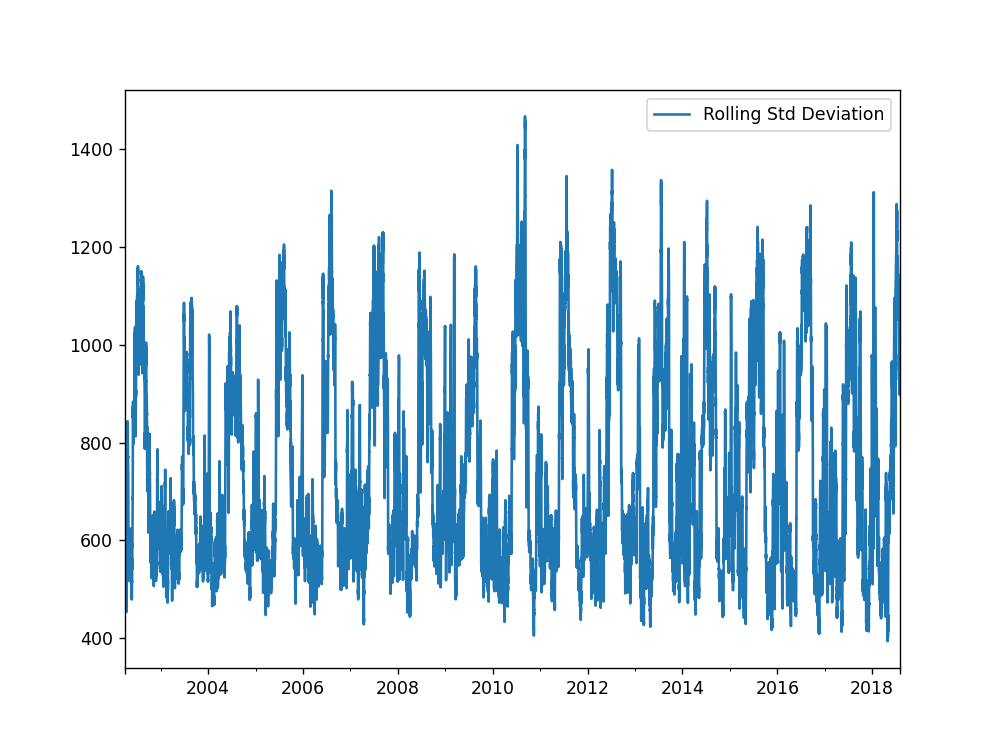

S.D is: 979.0860631744555


In [166]:
plt.figure(figsize=(8,6))
df["PJMW_MW"].rolling(200).std().plot(legend=True, label="Rolling Std Deviation");
print("S.D is:", df["PJMW_MW"].std())

Both mean and variance are constant.

## Coefficient of Variation:

Coefficient of variation gives us an idea about the variability in the process.

c.v = s.d/mean

If C.V<0.75 => Low Variability

If 0.75<C.V<1.3 => Medium Variability

If C.V>1.3 => High Variability

In [167]:
cv = df["PJMW_MW"].std()/df["PJMW_MW"].mean()
cv

0.1747667195237034

CV < 0.75 Hence its a low variability process

# Augmented Dickey-fuller test

In [168]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(df4.PJMW_MW , autolag= 'AIC')
print("1. ADF :" , dftest[0])
print("2. P-Value :" , dftest[1])
print("3. Num of lags :" , dftest[2])
print("4. No of obs used for ADF regression and critical value calculation :" , dftest[3])
print("5. Critical Values: ")
for key, val in dftest[4].items():
    print("\t",key, ": " , val)

1. ADF : -19.0357835812742
2. P-Value : 0.0
3. Num of lags : 74
4. No of obs used for ADF regression and critical value calculation : 143131
5. Critical Values: 
	 1% :  -3.4303956883364264
	 5% :  -2.8615601935959596
	 10% :  -2.5667807483328238


Our p-value is definitely less than 0.05 and so we can say with pretty good confidence that we can reject the null (unit root, non-stationary data) and can assume our data is stationary.

# ACF & PACF Plot

<IPython.core.display.Javascript object>


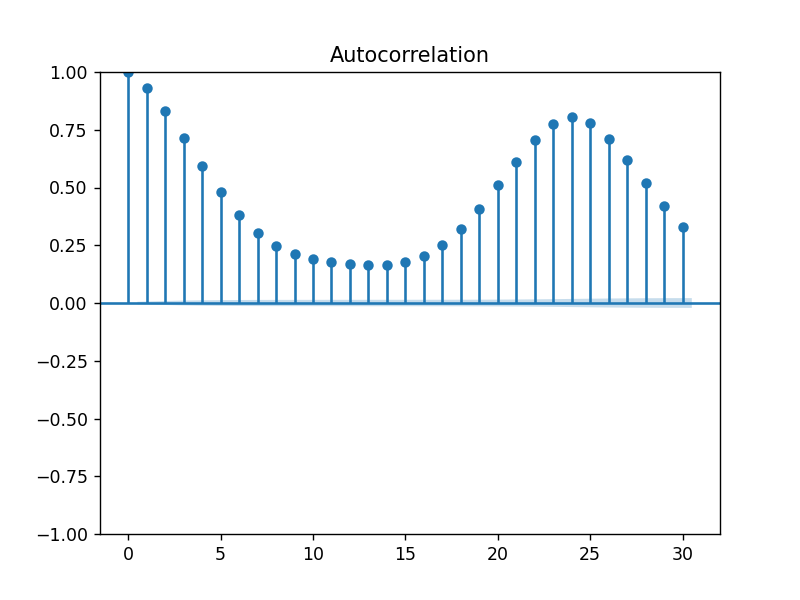

<IPython.core.display.Javascript object>


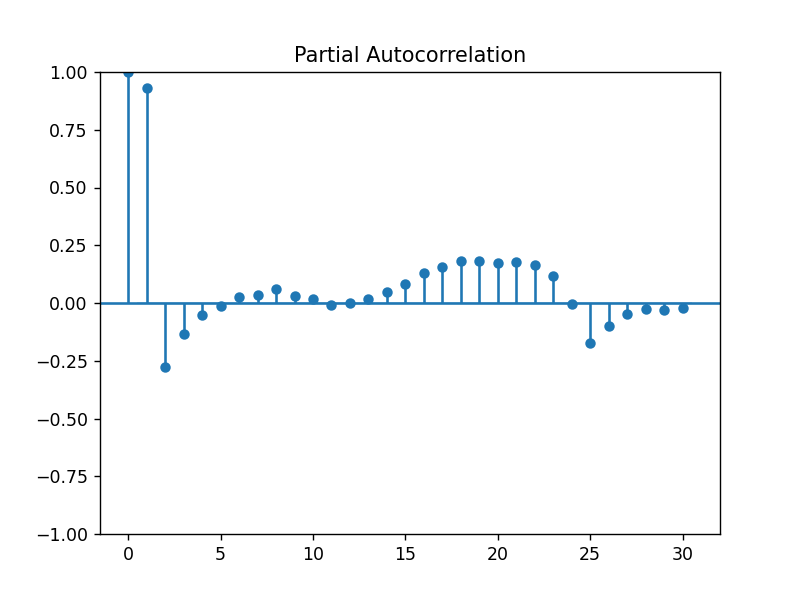

In [169]:
tsa_plots.plot_acf(df4.PJMW_MW,lags=30)
tsa_plots.plot_pacf(df4.PJMW_MW,lags=30)
plt.show()

Downsample data to daily basis

In [127]:
day_data = df.resample(rule='D').mean()
day_data = day_data.asfreq('D')

In [128]:
day_data

,PJMW_MW
2002-04-01,5271.173913
2002-04-02,5310.416667
2002-04-03,5325.916667
2002-04-04,5670.791667
2002-04-05,5686.125000
...,...
2018-07-30,5492.708333
2018-07-31,5660.750000
2018-08-01,5959.708333
2018-08-02,5805.041667


### Differencing the daily data to remove seasonality

<IPython.core.display.Javascript object>


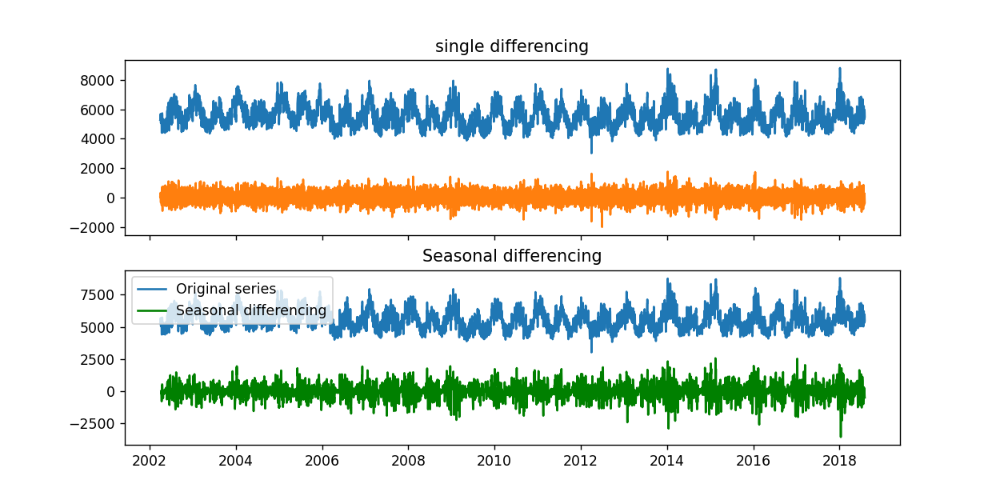

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [129]:
fig, axes = plt.subplots(2,1,figsize=(10,5),dpi=100,sharex=True)
data=day_data.PJMW_MW
axes[0].plot(data[:], label = "Original series")
axes[0].plot(data[:].diff(1), label = "single differencing")
axes[0].set_title("single differencing")
plt.legend(loc='upper left', fontsize=10)

#Second differencing with 7 lags

axes[1].plot(data[:], label = "Original series")
axes[1].plot(data[:].diff(7), label = "Seasonal differencing",color='green')
axes[1].set_title("Seasonal differencing")
plt.legend(loc='upper left', fontsize=10)

plt.show()

<IPython.core.display.Javascript object>


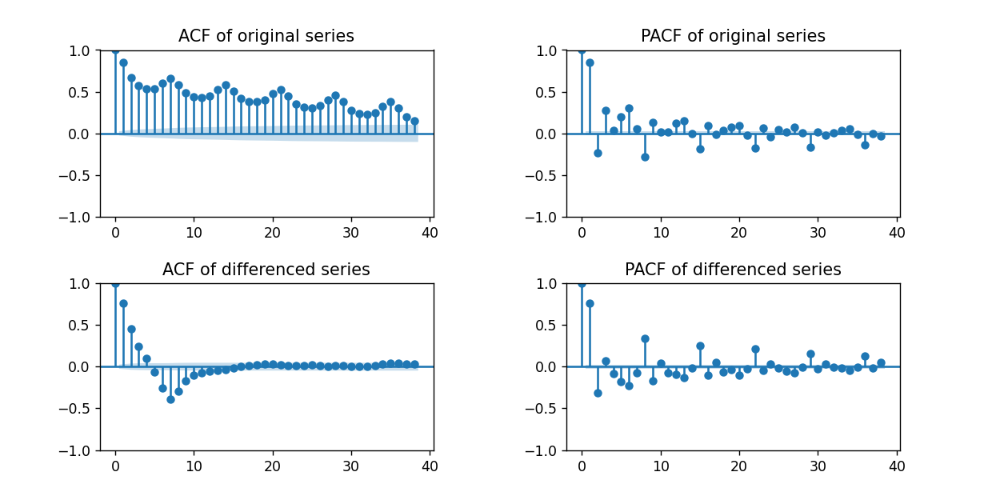

In [130]:
fig,axes = plt.subplots(2,2,figsize=(10,5))
tsa_plots.plot_acf(day_data, ax=axes[0,0]); axes[0,0].set_title('ACF of original series')
tsa_plots.plot_pacf(day_data, ax=axes[0,1]); axes[0,1].set_title('PACF of original series')

#differencing
tsa_plots.plot_acf(day_data.diff(7).dropna(), ax=axes[1,0]); axes[1,0].set_title('ACF of differenced series')
tsa_plots.plot_pacf(day_data.diff(7).dropna(), ax=axes[1,1]); axes[1,1].set_title('PACF of differenced series')

plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)

# Double Differencing

<IPython.core.display.Javascript object>


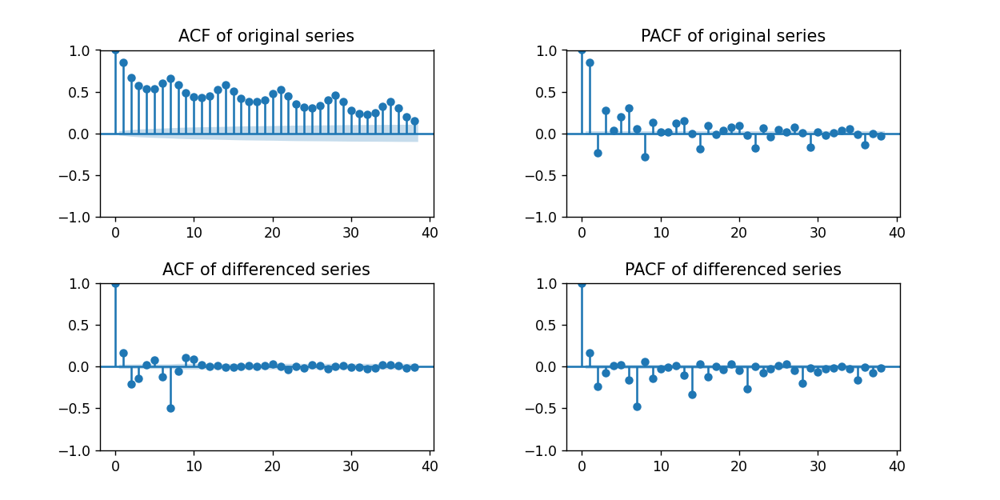

In [131]:
fig,axes = plt.subplots(2,2,figsize=(10,5))
tsa_plots.plot_acf(day_data, ax=axes[0,0]); axes[0,0].set_title('ACF of original series')
tsa_plots.plot_pacf(day_data, ax=axes[0,1]); axes[0,1].set_title('PACF of original series')

#differencing
tsa_plots.plot_acf(day_data.diff(7).diff().dropna(), ax=axes[1,0]); axes[1,0].set_title('ACF of differenced series')
tsa_plots.plot_pacf(day_data.diff(7).diff().dropna(), ax=axes[1,1]); axes[1,1].set_title('PACF of differenced series')

plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)

Split train and test

In [132]:
# First we split it up between train and test
# We will aim for a 12 month forecast horizon (ie predict the last 12 months in the dataset)
cutoff = '2017-08-04'

day_data.sort_index()

train = day_data[:cutoff]
test = day_data[cutoff:]

In [133]:
train.shape,test.shape

((5605, 1), (365, 1))

<IPython.core.display.Javascript object>


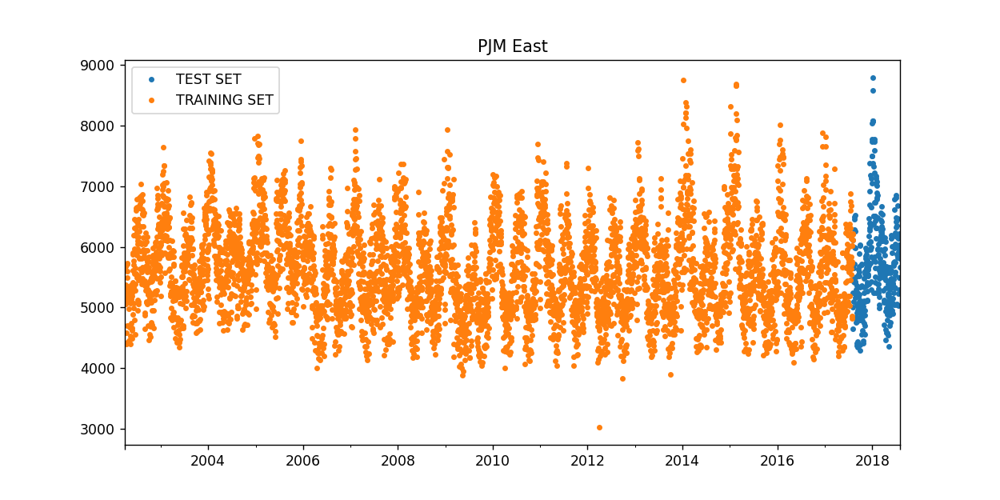

In [134]:
# Plot train and test so you can see where we have split
test.rename(columns={'PJMW_MW': 'TEST SET'}).join(train.rename(columns={'PJMW_MW': 'TRAINING SET'}),
          how='outer').plot(figsize=(10,5), title='PJM East', style='.')
plt.show()

### Diff 7

<IPython.core.display.Javascript object>


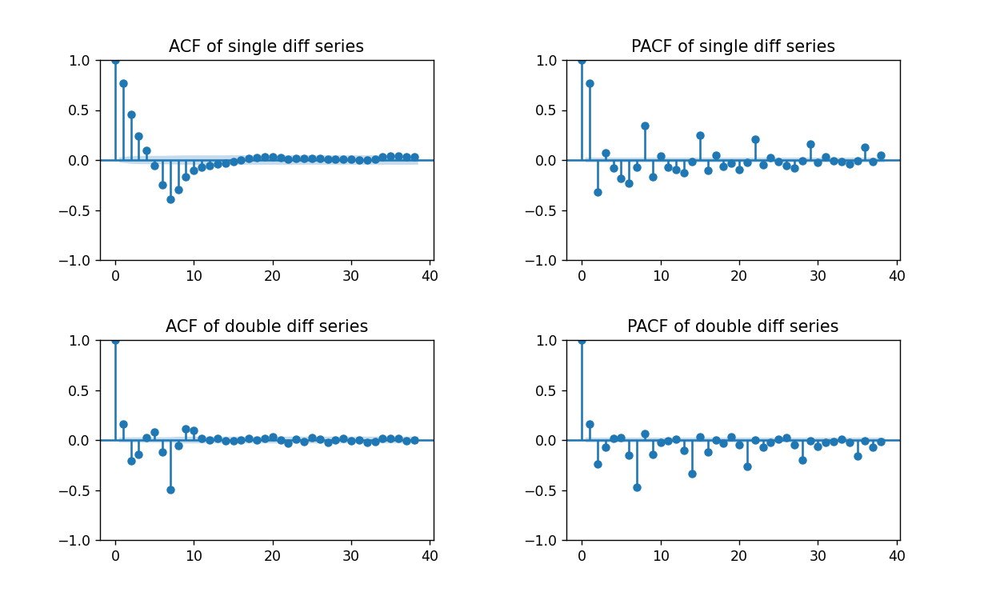

In [178]:
fig,axes = plt.subplots(2,2,figsize=(10,6))
tsa_plots.plot_acf(day_data.diff(7).dropna(), ax=axes[0,0]); axes[0,0].set_title('ACF of single diff series')
tsa_plots.plot_pacf(day_data.diff(7).dropna(), ax=axes[0,1]); axes[0,1].set_title('PACF of single diff series')

#differencing
tsa_plots.plot_acf(day_data.diff(7).diff().dropna(), ax=axes[1,0]); axes[1,0].set_title('ACF of double diff series')
tsa_plots.plot_pacf(day_data.diff(7).diff().dropna(), ax=axes[1,1]); axes[1,1].set_title('PACF of double diff series')

plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)

p=1 q=3 P=1 Q=0

<IPython.core.display.Javascript object>


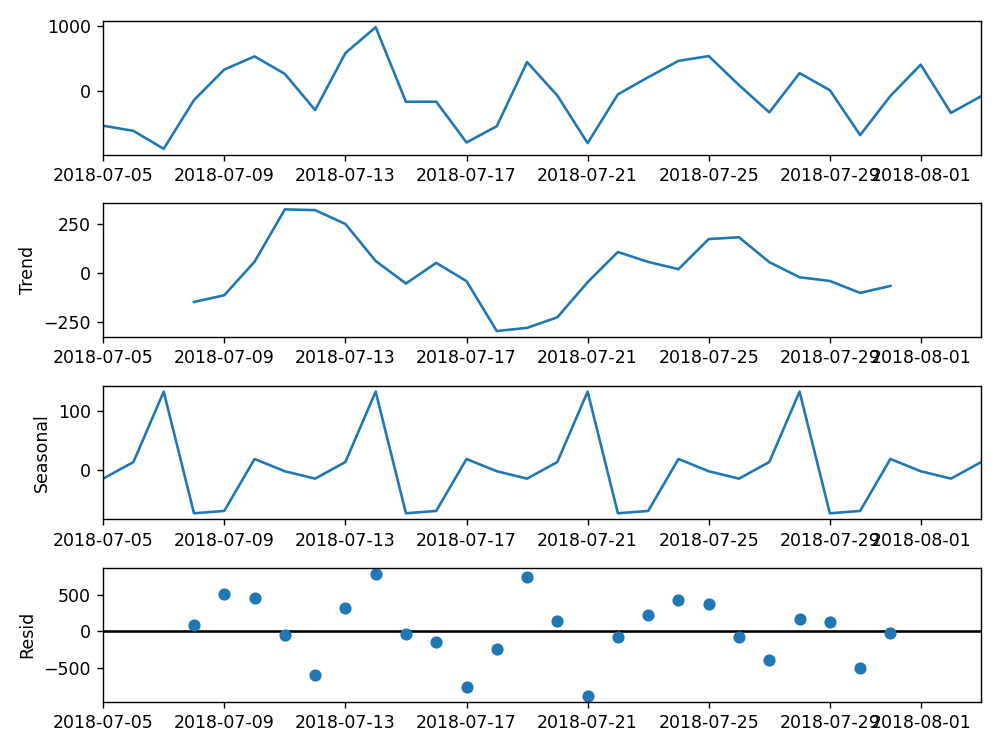

In [179]:
diff7=day_data.diff(7).diff().dropna()
plt.rcParams['figure.figsize'] = [8, 6]
decomposition = seasonal_decompose(diff7[-30:], model='additive') # Aggregate to weekly level
decomposition.plot()
plt.show()


In [180]:
model_7=sm.tsa.statespace.SARIMAX(train,order=(1,1,3),seasonal_order=(1,1,0,7))
fitted_7 = model_7.fit(disp=-1)
print(fitted_7.summary())

                                     SARIMAX Results                                      
Dep. Variable:                            PJMW_MW   No. Observations:                 5605
Model:             SARIMAX(1, 1, 3)x(1, 1, [], 7)   Log Likelihood              -40300.003
Date:                            Tue, 25 Oct 2022   AIC                          80612.005
Time:                                    11:43:01   BIC                          80651.785
Sample:                                04-01-2002   HQIC                         80625.868
                                     - 08-04-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6305      0.017     37.554      0.000       0.598       0.663
ma.L1         -0.5792      1.801   

<IPython.core.display.Javascript object>


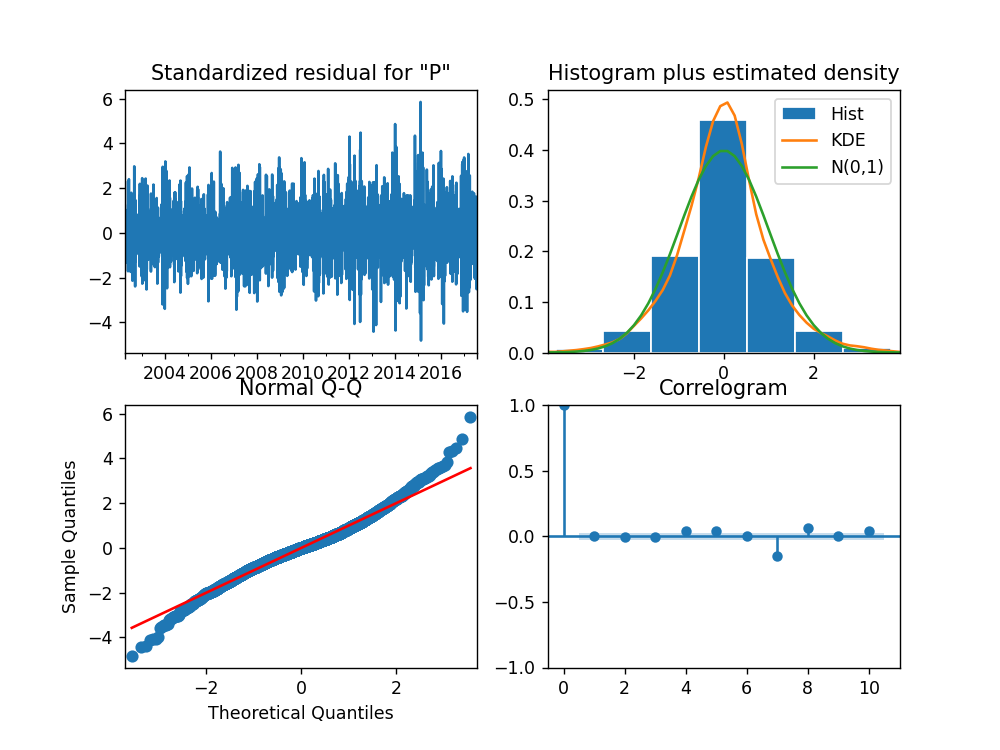

<IPython.core.display.Javascript object>


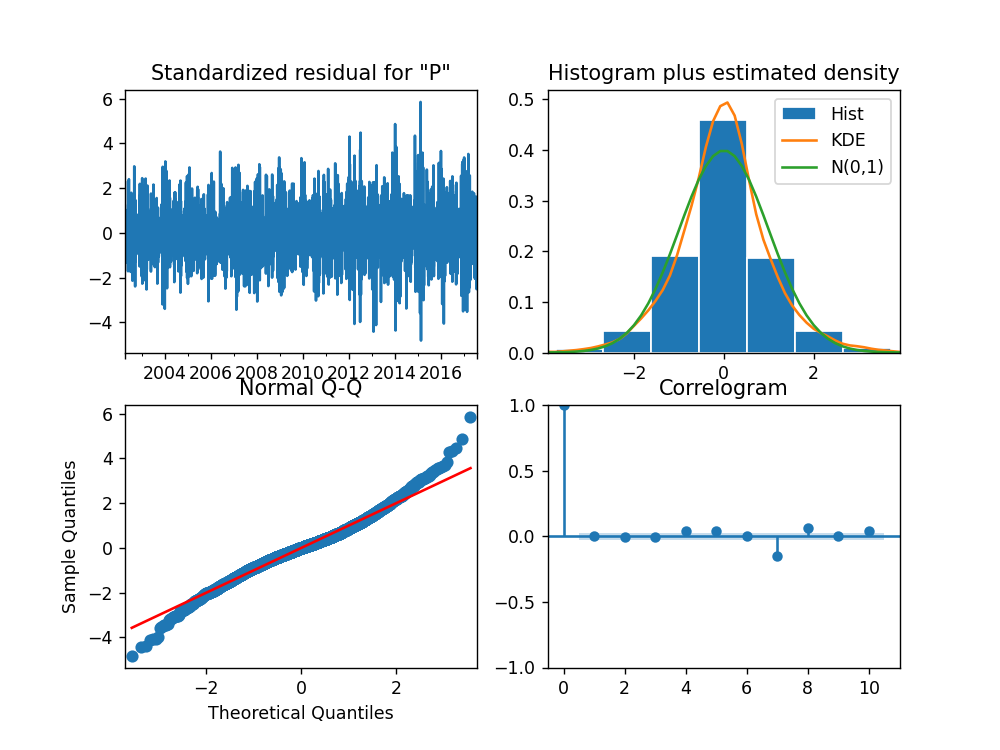

In [181]:
fitted_7.plot_diagnostics()

In [182]:
n_steps = 365
fc7 = fitted_7.forecast(n_steps,alpha=0.05)

# Model Evaluation

<IPython.core.display.Javascript object>


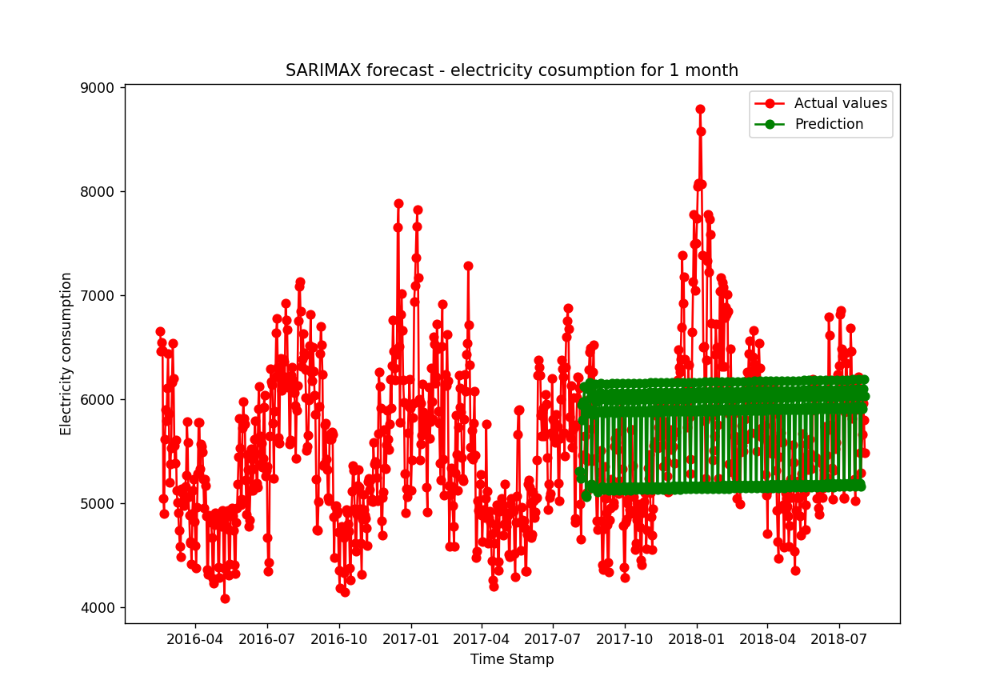

In [183]:

fitted_series7 = pd.Series(fc7,index=test.index)
fitted_series7=fitted_series7.bfill(axis ='rows')
fig, ax = plt.subplots(figsize=(10,7))
# plt.plot(daily_data)
plt.plot(day_data[-900:].index,day_data[-900:].values, label='Actual values', color="red", marker="o")
plt.plot(fitted_series7[-365:].index, fitted_series7[-365:].values,label='Prediction', color="green", marker="o")

# plt.plot(fitted_series)

plt.title("SARIMAX forecast - electricity cosumption for 1 month")
plt.xlabel("Time Stamp")
plt.ylabel("Electricity consumption")
plt.legend()

plt.show()

In [184]:
def mape(forecast,actual):
    mape=round(np.mean(np.abs(forecast - actual)/np.abs(actual))*100,2)
    return mape

In [185]:
def mae(forecast,actual):
    mae=round(np.mean(np.abs(forecast - actual)),2)
    return mae

In [186]:
def rmse(forecast,actual):
    rmse = round(np.mean(np.abs(forecast - actual)**2)**.5,2)
    return rmse

In [187]:
MAPE_7= mape(fitted_series7.values, test.values)
MAE_7= mae(fitted_series7.values, test.values)
print("MAPE_7: ",MAPE_7)
print("MAE_7: ",MAE_7)

MAPE_7:  12.06
MAE_7:  684.23


In [188]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_7=sqrt((mean_squared_error(fitted_series7.values,test.values)))
rmse_7

767.3478439666314

In [ ]:
## Diff 12

<IPython.core.display.Javascript object>


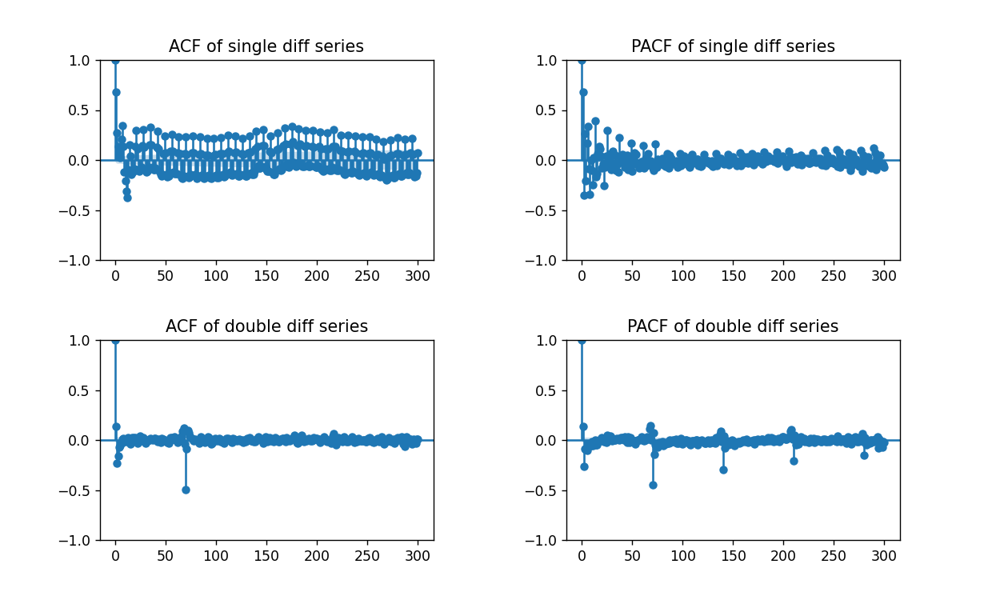

In [189]:
fig,axes = plt.subplots(2,2,figsize=(10,6))
tsa_plots.plot_acf(day_data.diff(12).dropna(), ax=axes[0,0],lags=300); axes[0,0].set_title('ACF of single diff series')
tsa_plots.plot_pacf(day_data.diff(12).dropna(), ax=axes[0,1],lags=300); axes[0,1].set_title('PACF of single diff series')

#differencing
tsa_plots.plot_acf(day_data.diff(70).diff().dropna(), ax=axes[1,0],lags=300); axes[1,0].set_title('ACF of double diff series')
tsa_plots.plot_pacf(day_data.diff(70).diff().dropna(), ax=axes[1,1],lags=300); axes[1,1].set_title('PACF of double diff series')

plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)

In [ ]:
p=0,q=1,P=0,Q=1

In [190]:
data_10year=day_data['2008-01-01':'2017-08-03']

In [191]:
data_10year

,PJMW_MW
2008-01-01,5657.125000
2008-01-02,6920.250000
2008-01-03,7223.416667
2008-01-04,6963.250000
2008-01-05,6016.958333
...,...
2017-07-30,4859.875000
2017-07-31,5757.750000
2017-08-01,6015.666667
2017-08-02,6215.958333


In [192]:
model_12=sm.tsa.statespace.SARIMAX(data_10year,order=(0,0,1),seasonal_order=(0,1,1,12))
fitted_12 = model_12.fit(disp=-1)
print(fitted_12.summary())

                                     SARIMAX Results                                      
Dep. Variable:                            PJMW_MW   No. Observations:                 3503
Model:             SARIMAX(0, 0, 1)x(0, 1, 1, 12)   Log Likelihood              -26520.555
Date:                            Tue, 25 Oct 2022   AIC                          53047.109
Time:                                    11:52:43   BIC                          53065.583
Sample:                                01-01-2008   HQIC                         53053.703
                                     - 08-03-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.8104      0.009     91.444      0.000       0.793       0.828
ma.S.L12      -0.5769      0.014   

<IPython.core.display.Javascript object>


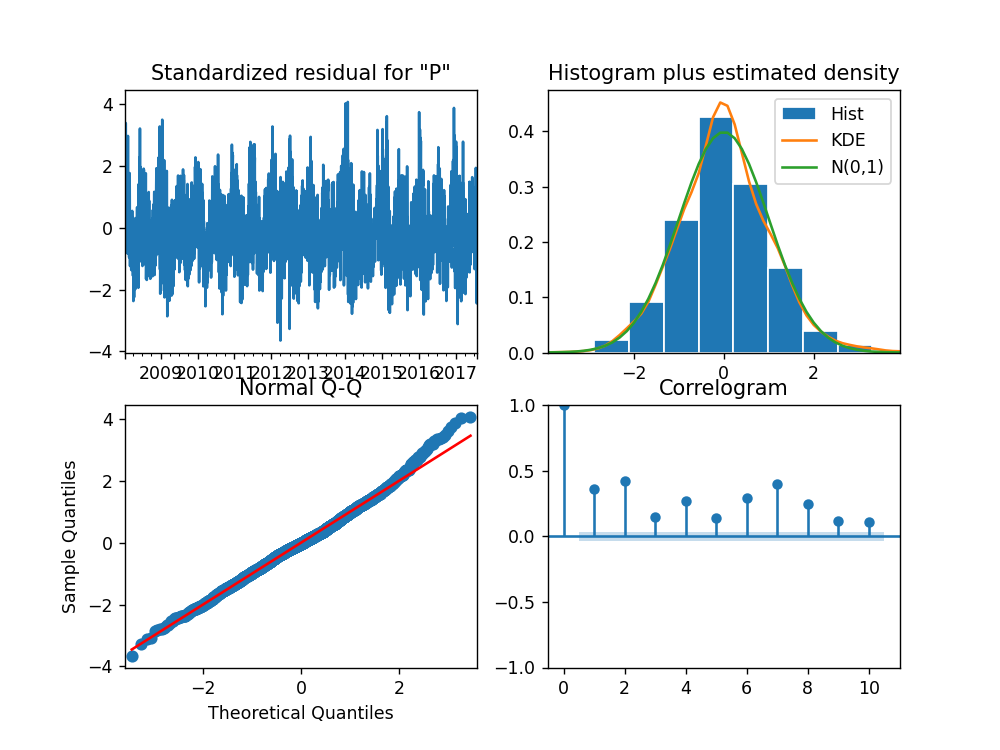

<IPython.core.display.Javascript object>


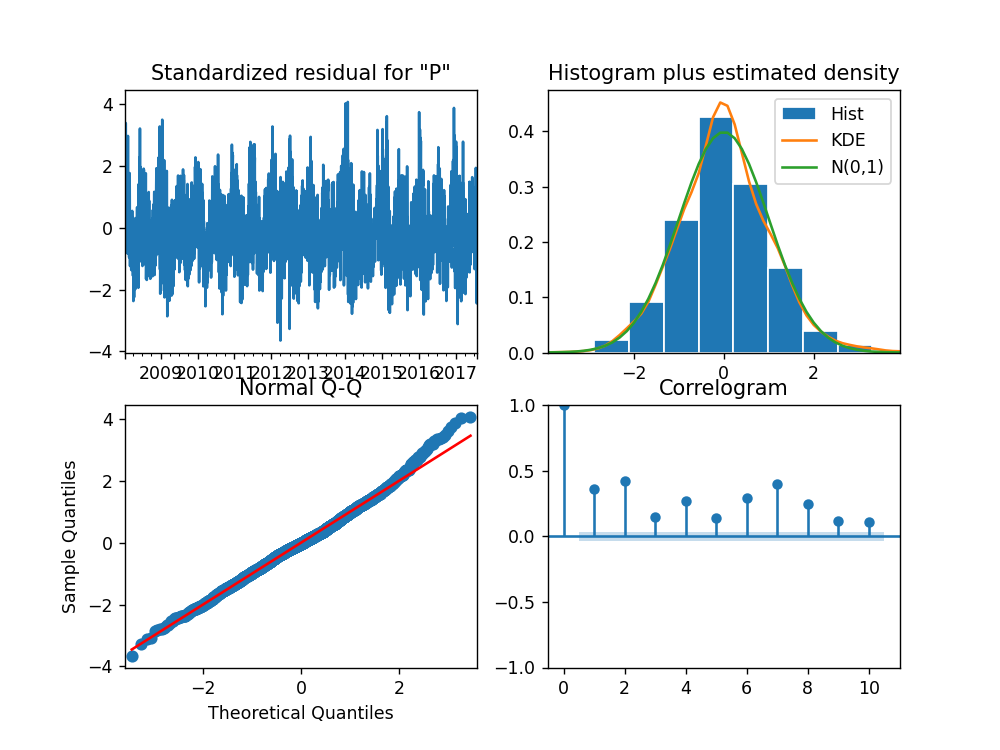

In [193]:
fitted_12.plot_diagnostics()

In [194]:
n_steps = 365
fc12 = fitted_12.forecast(n_steps,alpha=0.05)

# Evaluvate Model

<IPython.core.display.Javascript object>


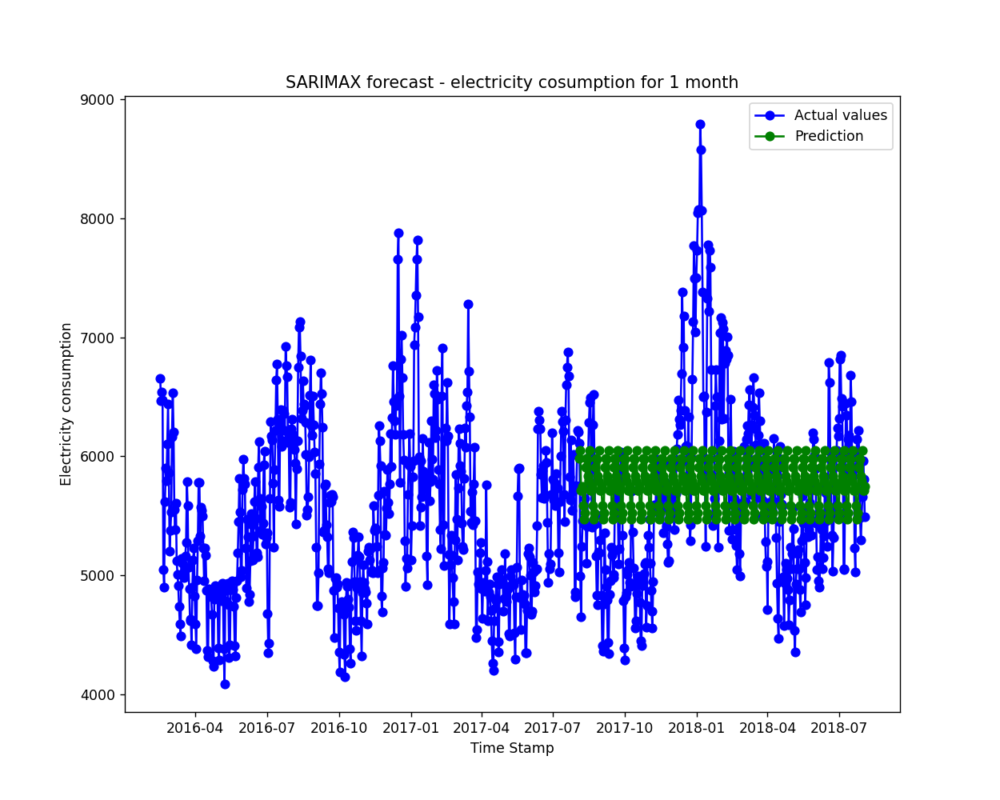

In [195]:
fitted_series12 = pd.Series(fc12,index=test.index)
fitted_series12=fitted_series12.bfill(axis ='rows')
fig, ax = plt.subplots(figsize=(10,8))
# plt.plot(daily_data)
plt.plot(day_data[-900:].index,day_data[-900:].values, label='Actual values', color="blue", marker="o")
plt.plot(fitted_series12[-365:].index, fitted_series12[-365:].values,label='Prediction', color="green", marker="o")

# plt.plot(fitted_series)

plt.title("SARIMAX forecast - electricity cosumption for 1 month")
plt.xlabel("Time Stamp")
plt.ylabel("Electricity consumption")
plt.legend()

plt.show()

In [196]:
MAPE_12= mape(fitted_series12.values, test.values)
MAE_12= mae(fitted_series12.values, test.values)
print("MAPE_12: ",MAPE_12)
print("MAE_12: ",MAE_12)

MAPE_12:  10.89
MAE_12:  617.1


In [197]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_12=sqrt((mean_squared_error(fitted_series12.values,test.values)))
rmse_12

798.4675069883306

In [198]:
rmse = round(sqrt(np.mean(np.abs(fitted_series12.values - test.values)**2)),2)
rmse

790.39

# Diff 90

<IPython.core.display.Javascript object>


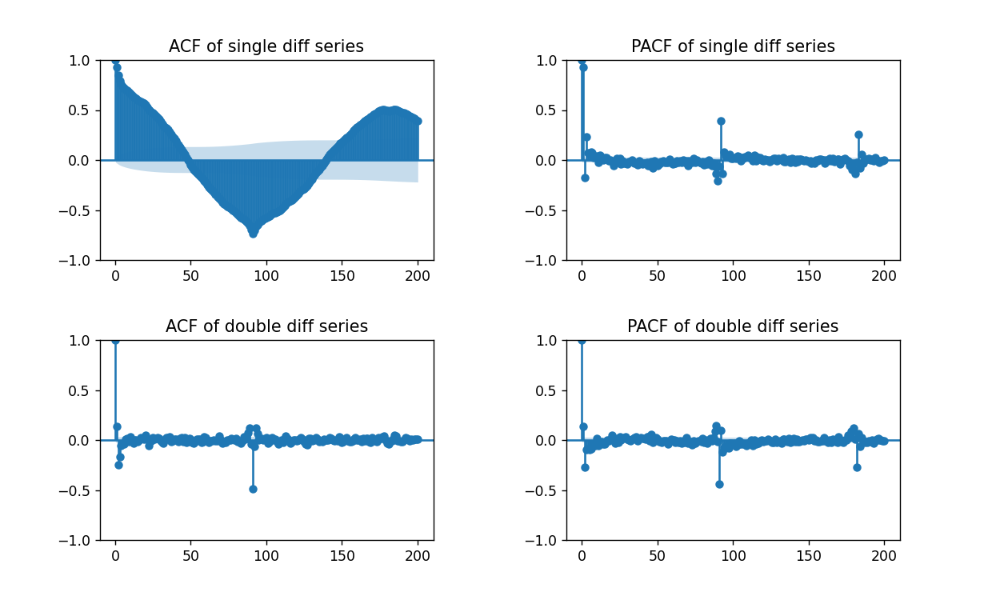

In [199]:
fig,axes = plt.subplots(2,2,figsize=(10,6))
tsa_plots.plot_acf(day_data.diff(91).dropna(), ax=axes[0,0],lags=200); axes[0,0].set_title('ACF of single diff series')
tsa_plots.plot_pacf(day_data.diff(91).dropna(), ax=axes[0,1],lags=200); axes[0,1].set_title('PACF of single diff series')

#differencing
tsa_plots.plot_acf(day_data.diff(91).diff().dropna(), ax=axes[1,0],lags=200); axes[1,0].set_title('ACF of double diff series')
tsa_plots.plot_pacf(day_data.diff(91).diff().dropna(), ax=axes[1,1],lags=200); axes[1,1].set_title('PACF of double diff series')

plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)

p=2,q=3,P=1,q=0

In [200]:
model_90=sm.tsa.statespace.SARIMAX(train,order=(2,1,3),seasonal_order=(1,1,0,91))
fitted_90 = model_90.fit(low_memory=True,cov_type='approx')
print(fitted_90.summary())

C:\Users\pranjali\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                      SARIMAX Results                                      
Dep. Variable:                             PJMW_MW   No. Observations:                 5605
Model:             SARIMAX(2, 1, 3)x(1, 1, [], 91)   Log Likelihood              -39864.204
Date:                             Tue, 25 Oct 2022   AIC                          79742.407
Time:                                     13:51:29   BIC                          79788.711
Sample:                                 04-01-2002   HQIC                         79758.556
                                      - 08-04-2017                                         
Covariance Type:                            approx                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5461      0.019     80.180      0.000       1.508       1.584
ar.L2         -0.5551      

<IPython.core.display.Javascript object>


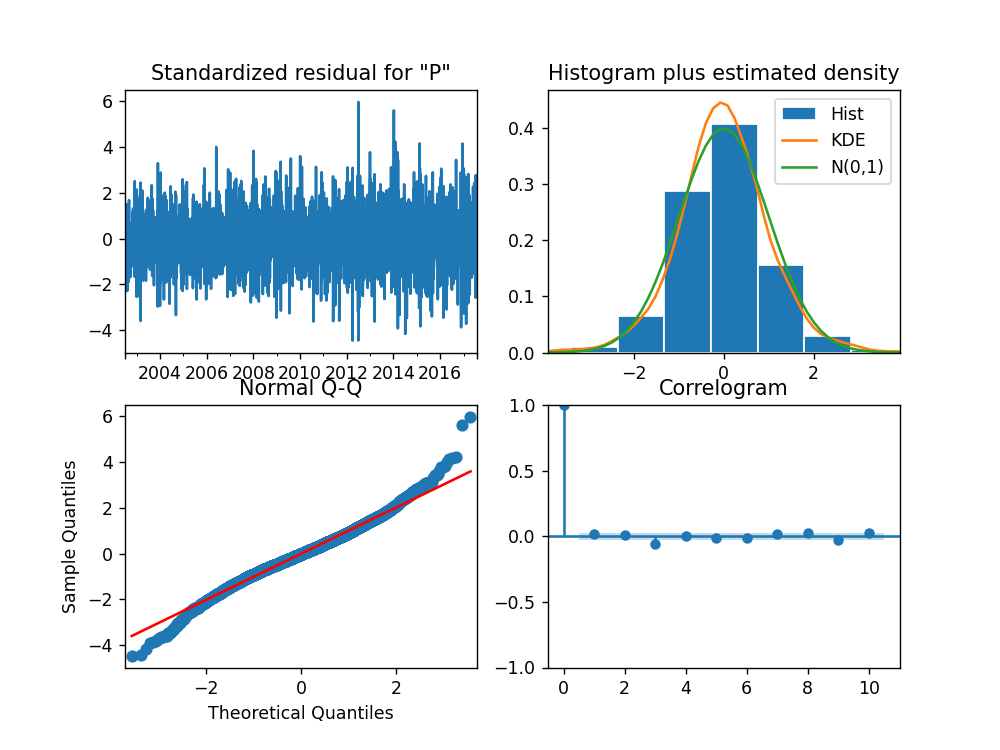

<IPython.core.display.Javascript object>


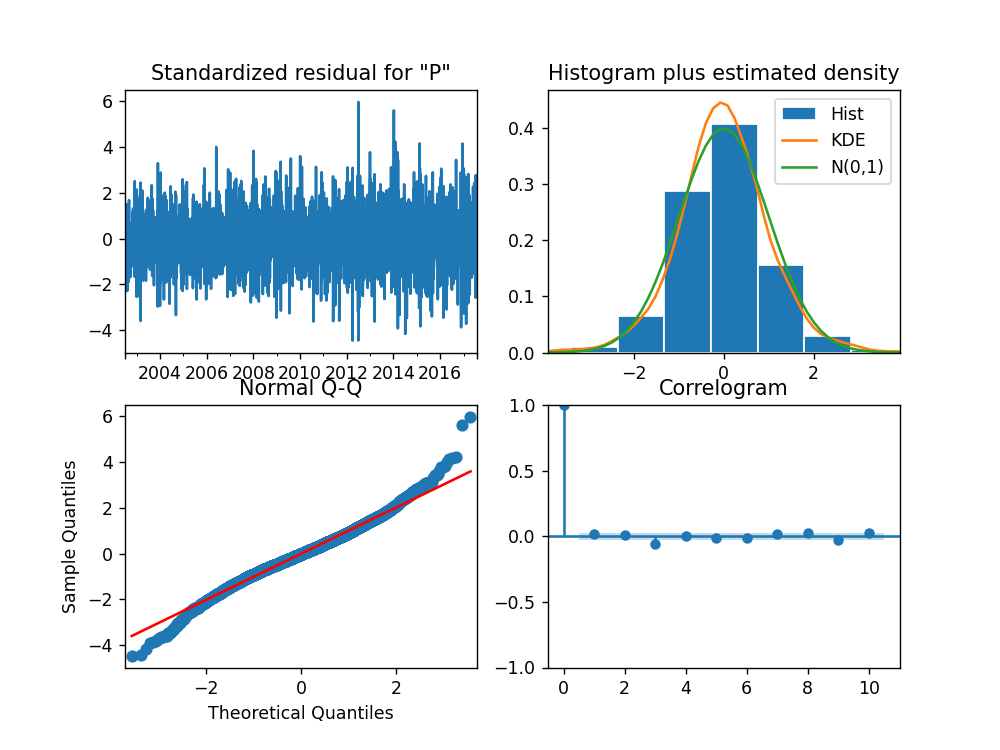

In [201]:
fitted_90.plot_diagnostics()

In [202]:
n_steps = 365
fc90 = fitted_90.forecast(n_steps,alpha=0.05)

# Evaluate Model

<IPython.core.display.Javascript object>


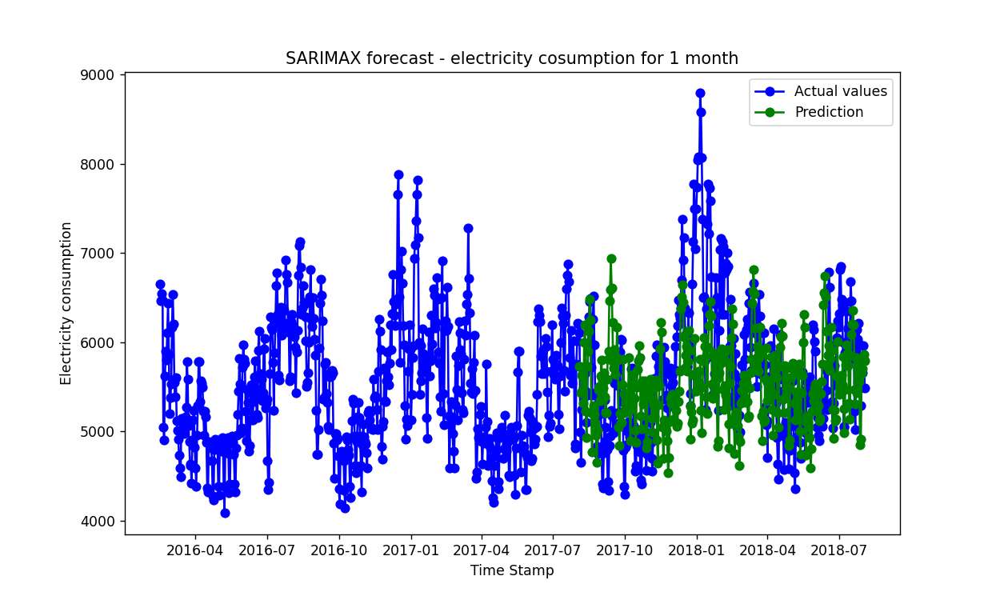

In [203]:
fitted_series90 = pd.Series(fc90,index=test.index)
fitted_series90=fitted_series90.bfill(axis ='rows')
fig, ax = plt.subplots(figsize=(10,6))
# plt.plot(daily_data)
plt.plot(day_data[-900:].index,day_data[-900:].values, label='Actual values', color="blue", marker="o")
plt.plot(fitted_series90[-365:].index, fitted_series90[-365:].values,label='Prediction', color="green", marker="o")

# plt.plot(fitted_series)

plt.title("SARIMAX forecast - electricity cosumption for 1 month")
plt.xlabel("Time Stamp")
plt.ylabel("Electricity consumption")
plt.legend()

plt.show()

In [204]:
MAPE_90= mape(fitted_series90.values, test.values)
MAE_90= mae(fitted_series90.values, test.values)
print("MAPE_90: ",MAPE_90)
print("MAE_90: ",MAE_90)

MAPE_90:  11.73
MAE_90:  686.71


In [205]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_90=sqrt((mean_squared_error(fitted_series90.values,test.values)))
rmse_90

785.4934698881257

# Diff 120

<IPython.core.display.Javascript object>


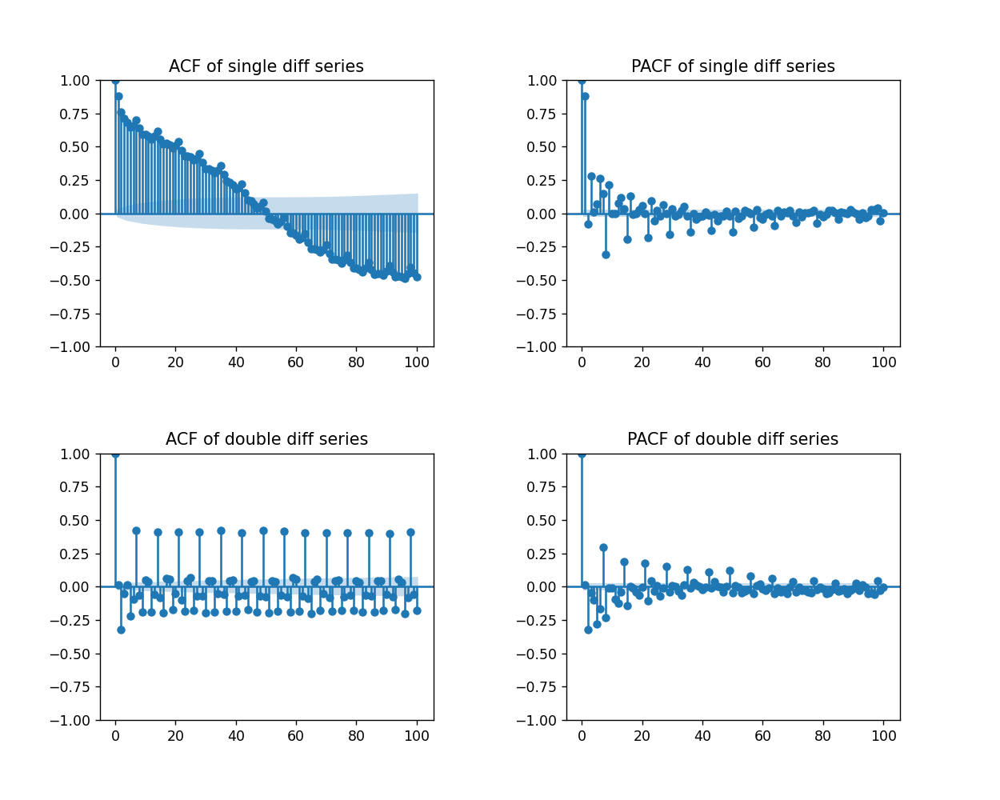

In [135]:
fig,axes = plt.subplots(2,2,figsize=(10,8))
tsa_plots.plot_acf(day_data.diff(120).dropna(), ax=axes[0,0],lags=100); axes[0,0].set_title('ACF of single diff series')
tsa_plots.plot_pacf(day_data.diff(120).dropna(), ax=axes[0,1],lags=100); axes[0,1].set_title('PACF of single diff series')

#differencing
tsa_plots.plot_acf(day_data.diff(120).diff().dropna(), ax=axes[1,0],lags=100); axes[1,0].set_title('ACF of double diff series')
tsa_plots.plot_pacf(day_data.diff(120).diff().dropna(), ax=axes[1,1],lags=100); axes[1,1].set_title('PACF of double diff series')

plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)

p=1,q=1,d=1,P=1,Q=1,D=1

In [136]:
data_2year=day_data['2015-08-03':'2017-08-03']

In [140]:
model_120=sm.tsa.statespace.SARIMAX(data_2year,order=(1,1,1),seasonal_order=(1,1,1,120))
fitted_120 = model_120.fit(low_memory=True,cov_type='approx')
print(fitted_120.summary())

                                      SARIMAX Results                                      
Dep. Variable:                             PJMW_MW   No. Observations:                  732
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 120)   Log Likelihood               -4608.026
Date:                             Thu, 27 Oct 2022   AIC                           9226.053
Time:                                     17:35:22   BIC                           9248.128
Sample:                                 08-03-2015   HQIC                          9234.639
                                      - 08-03-2017                                         
Covariance Type:                            approx                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3862      0.100     -3.849      0.000      -0.583      -0.190
ma.L1          0.6734      

<IPython.core.display.Javascript object>


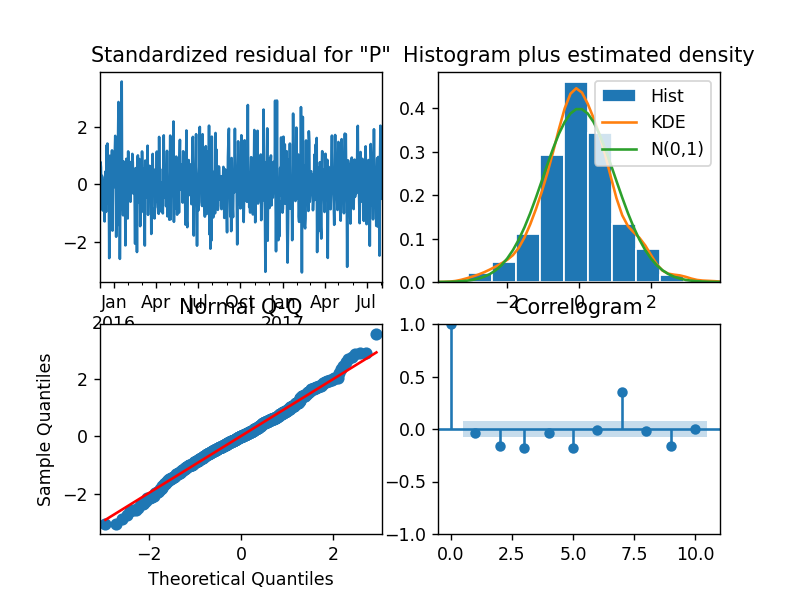

<IPython.core.display.Javascript object>


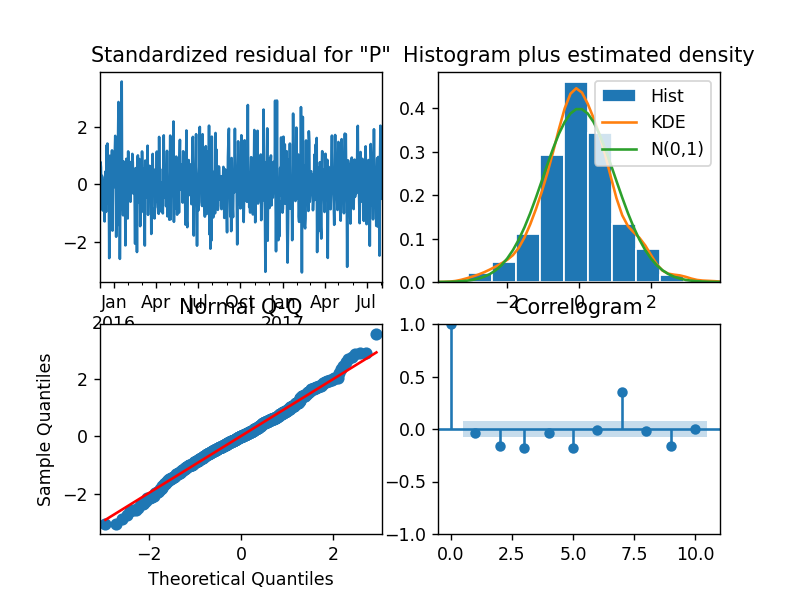

In [141]:
fitted_120.plot_diagnostics()

In [143]:
n_steps = 365
fc120 = fitted_120.forecast(n_steps,alpha=0.05)

<IPython.core.display.Javascript object>


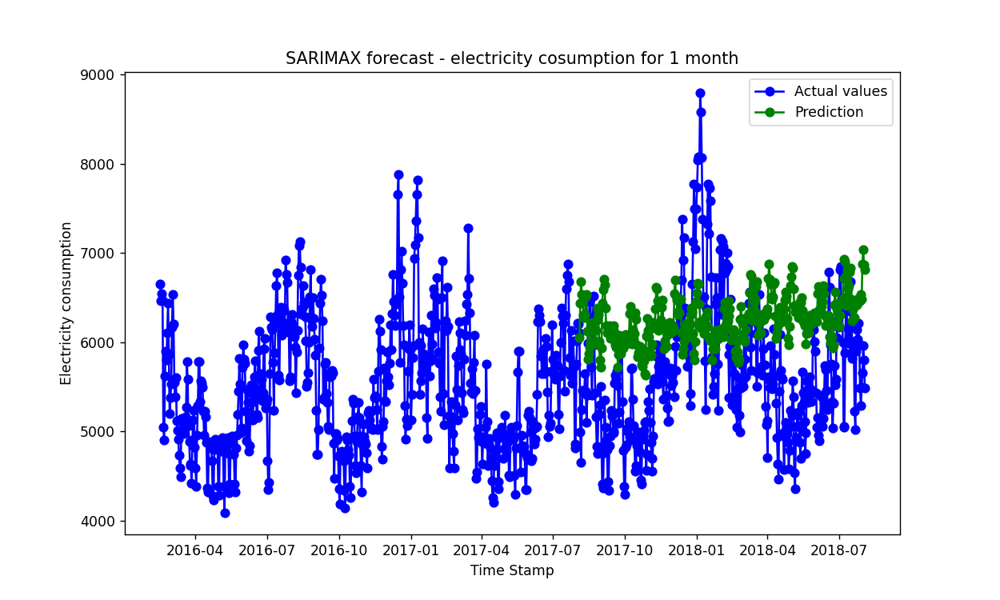

In [146]:
fitted_series120 = pd.Series(fc120,index=test.index)
fitted_series120=fitted_series120.bfill(axis ='rows')
fig, ax = plt.subplots(figsize=(10,6))
# plt.plot(daily_data)
plt.plot(day_data[-900:].index,day_data[-900:].values, label='Actual values', color="blue", marker="o")
plt.plot(fitted_series120[-365:].index, fitted_series120[-365:].values,label='Prediction', color="green", marker="o")

# plt.plot(fitted_series)

plt.title("SARIMAX forecast - electricity cosumption for 1 month")
plt.xlabel("Time Stamp")
plt.ylabel("Electricity consumption")
plt.legend()

plt.show()

In [212]:
MAPE_120= mape(fitted_series120.values, test.values)
MAE_120= mae(fitted_series120.values, test.values)
print("MAPE_120: ",MAPE_120)
print("MAE_120: ",MAE_120)

MAPE_120:  15.21
MAE_120:  820.81


In [213]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_120=sqrt((mean_squared_error(fitted_series120.values,test.values)))
rmse_120

967.5163001874981